<img src="cetelem1b.jpg" />

# Imports

In [1]:
# Math et données
import numpy as np
# import scipy
# from scipy.stats import zscore
import pandas as pd
from datetime import date
import itertools

# Librairies graphiques
import matplotlib.pyplot as plt
import seaborn as sns

import copy

c:\users\public\wpython\v_3.7.6\soft\python-3.7.6.amd64\lib\site-packages\statsmodels\tools\_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [2]:
from collections import Counter

In [3]:
# Pre-processing
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer

# Feature selection
from sklearn.model_selection import GridSearchCV, KFold

# ML
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
# from sklearn.multiclass import OneVsOneClassifier, OneVsRestClassifier
# from sklearn.svm import SVC, LinearSVC
from sklearn.dummy import DummyClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_curve, auc, roc_auc_score, confusion_matrix
from sklearn.metrics import make_scorer
from sklearn.metrics import classification_report

from imblearn.under_sampling import RandomUnderSampler
from imblearn.over_sampling import SMOTE, SMOTENC, BorderlineSMOTE, SVMSMOTE, ADASYN, RandomOverSampler
from imblearn.under_sampling import RandomUnderSampler
from imblearn.pipeline import Pipeline as imbPipeline

In [4]:
import joblib

In [5]:
import re

In [6]:
# Modules perso
%load_ext autoreload
# %reload_ext autoreload
%autoreload 2

In [7]:
import DisplotData, DisplotML, PwePwocess, Funktiuns
from DisplotData import bcolors
import MLstuff

In [8]:
pd.set_option("display.max_columns", 150) # None

# Noyau Kaggle

## Fonctions

### Preprocessing

In [27]:
def transform_operations(row):
    if Funktiuns.isNaN(row):
        return row
    row = row.split(',')
    return row

In [9]:
# Display/plot feature importance
def display_importances(feature_importance_df_, n_feat=40, algo_name=''):
    cols = feature_importance_df_[["feature", "importance"]].groupby("feature").mean().sort_values(by="importance", ascending=False)[:n_feat].index
    best_features = feature_importance_df_.loc[feature_importance_df_.feature.isin(cols)]
    result = best_features[["feature", "importance"]].groupby("feature").mean().sort_values(by="importance", ascending=False).index
    plt.figure()
    # sns.barplot(x="importance", y="feature", data=best_features.sort_values(by="importance", ascending=False))
    sns.barplot(x="importance", y="feature", data=best_features, order=result)

    plt.title(f'{algo_name} features')
    plt.tight_layout()
    plt.savefig(f'{algo_name}_importances.png')

In [10]:
def keep_selected_cols(df, selected_features, table_name=''):
    if not selected_features is None:
        kept_cols = selected_features.loc[selected_features['Table'].str.startswith(table_name), 'Row'].values
        efc_kept_cols = [c for c in df.columns if c in kept_cols]
        df = df[efc_kept_cols]
    return df


def rename_non_relaxable_cat_cols(df, selected_features, cat_cols, suffix='_NR', sep='__'):
    # print(f"df.columns AVANT = {df.columns}")
    new_cat_cols = cat_cols
    if not selected_features is None:
        new_cat_cols = []
        non_relaxable_cols = selected_features.loc[selected_features['Non-relaxable']==1, 'Row'].values
        # print(f"non_relaxable_cols = {non_relaxable_cols}")
        # print(f"cat_cols = {cat_cols}")
        for col_enc in cat_cols:
            # print(f"col_enc = {col_enc}")
            col = col_enc.split(sep)[0]
            # print(f"col = {col}")
            if col in non_relaxable_cols: # and col_enc in df.columns
                col_enc2 = col_enc+suffix
                # print(f"col_enc2 = {col_enc2}")
                new_cat_cols.append(col_enc2)
                df.rename(columns={col_enc: col_enc2}, inplace=True)
            else:
                new_cat_cols.append(col_enc)
    # print(f"df.columns APRES = {df.columns}")
    return df, new_cat_cols

def rename_non_relaxable_num_cols(df, selected_features, suffix='_NR', sep1='%', sep2='#'):
    new_num_cols = []
    num_cols = [col for col in df.columns if df[col].dtype != 'object']
    if not selected_features is None:
        non_relaxable_cols = selected_features.loc[selected_features['Non-relaxable']==1, 'Row'].values
        # print(f"non_relaxable_cols = {non_relaxable_cols}")
        # print(f"num_cols = {num_cols}")
        for col_agg in num_cols:
            # print(f"col_agg = {col_agg}")
            root_feat = col_agg
            if sep1 in root_feat:
                root_feat = root_feat.split(sep1)[1]
            if sep2 in root_feat:
                root_feat = root_feat.split(sep2)[0]
            # print(f"root_feat = {root_feat}")
            if root_feat in non_relaxable_cols: # and col_agg in df.columns
                col_agg2 = col_agg+suffix
                # print(f"col2 = {col2}")
                new_num_cols.append(col_agg2)
                df.rename(columns={col_agg: col_agg2}, inplace=True)
            else:
                new_num_cols.append(col_agg)
    # print(f"df.columns APRES = {df.columns}")
    return df, new_num_cols
    
def get_aggregations_for_root_var(num_cols, selected_features, table_name='', sep1='%', sep2='#'):
    aggregations = {}
    if not selected_features is None:
        # aggregations = {'MONTHS_BALANCE': ops} y sera !
        for col in num_cols:
            root_feat = col
            if sep1 in root_feat:
                root_feat = root_feat.split(sep1)[1]
            if sep2 in root_feat:
                root_feat = root_feat.split(sep2)[0]
            ops = selected_features.loc[(selected_features['Table'].str.startswith(table_name)) & (selected_features['Row']==root_feat), 'Operations'].values
            # print(root_feat, ops) # DEBUG
            if len(ops): 
                aggregations[col] = ops[0]
    
    return aggregations

In [14]:
# HOME CREDIT DEFAULT RISK COMPETITION
# Most features are created by applying min, max, mean, sum and var functions to grouped tables. 
# Little feature selection is done and overfitting might be a problem since many features are related.
# The following key ideas were used:
# - Divide or subtract important features to get rates (like annuity and income)
# - In Bureau Data: create specific features for Active credits and Closed credits
# - In Previous Applications: create specific features for Approved and Refused applications
# - Modularity: one function for each table (except bureau_balance and application_test)
# - One-hot encoding for categorical features
# All tables are joined with the application DF using the SK_ID_CURR key (except bureau_balance).
# You can use LightGBM with KFold or Stratified KFold.

# Update 16/06/2018:
# - Added Payment Rate feature
# - Removed index from features
# - Use standard KFold CV (not stratified)

import gc
import time
from contextlib import contextmanager
from lightgbm import LGBMClassifier
from lightgbm import early_stopping
from sklearn.metrics import roc_auc_score, roc_curve
from sklearn.model_selection import KFold, StratifiedKFold
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

@contextmanager
def timer(title):
    t0 = time.time()
    yield
    print("{} - done in {:.0f}s".format(title, time.time() - t0))

# One-hot encoding for categorical columns with get_dummies
def one_hot_encoder(df, nan_as_category=True, prefix_sep='_'):
    original_columns = list(df.columns)
    categorical_columns = [col for col in df.columns if df[col].dtype == 'object']
    df = pd.get_dummies(df, columns=categorical_columns, dummy_na=nan_as_category, prefix_sep=prefix_sep)
    new_columns = [c for c in df.columns if c not in original_columns]
    return df, new_columns


# Preprocess application_train.csv and application_test.csv
def application_train_test(selected_features=None, num_rows=None, nan_as_category=False):
    # Read data and merge
    # df = pd.read_csv('../input/application_train.csv', nrows= num_rows)
    df = df_application_train[0:num_rows]
    # test_df = pd.read_csv('../input/application_test.csv', nrows= num_rows)
    test_df = df_application_test[0:num_rows]
    print("Train samples: {}, test samples: {}".format(len(df), len(test_df)))
    df = df.append(test_df).reset_index()
    # Optional: Remove 4 applications with XNA CODE_GENDER (train set)
    df = df[df['CODE_GENDER'] != 'XNA']
    # Keep only wished cols, if they are specified
    df = keep_selected_cols(df, selected_features, table_name='application_{train|test}.csv')    
    # Categorical features with Binary encode (0 or 1; two categories)
    for bin_feature in ['CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY']: # comme étape du ColumnTransformer
        df[bin_feature], uniques = pd.factorize(df[bin_feature])
    # Categorical features with One-Hot encode
    df, cat_cols = one_hot_encoder(df, nan_as_category, prefix_sep='__')
    
    # Mark as non-relaxable the categorical variables not to SMOTE but to SMOTE-NC 
    df, cat_cols = rename_non_relaxable_cat_cols(df, selected_features, cat_cols)

    # NaN values for DAYS_EMPLOYED: 365.243 -> nan
    df['DAYS_EMPLOYED'].replace(365243, np.nan, inplace= True)
    # Some simple new features (percentages)
    df['DAYS_EMPLOYED_PERC'] = df['DAYS_EMPLOYED'] / df['DAYS_BIRTH']
    df['INCOME_CREDIT_PERC'] = df['AMT_INCOME_TOTAL'] / df['AMT_CREDIT']
    df['INCOME_PER_PERSON'] = df['AMT_INCOME_TOTAL'] / df['CNT_FAM_MEMBERS']
    df['ANNUITY_INCOME_PERC'] = df['AMT_ANNUITY'] / df['AMT_INCOME_TOTAL']
    df['PAYMENT_RATE'] = df['AMT_ANNUITY'] / df['AMT_CREDIT']
    # Mark as non-relaxable the numerical variables not to SMOTE but to SMOTE-NC 
    df, num_cols = rename_non_relaxable_num_cols(df, selected_features)
    del test_df
    gc.collect()
    return df, cat_cols


# Preprocess bureau.csv and bureau_balance.csv
def bureau_and_balance(selected_features=None, num_rows=None, nan_as_category=True):
    # bureau = pd.read_csv('../input/bureau.csv', nrows = num_rows)
    bureau = df_bureau # global
    # bb = pd.read_csv('../input/bureau_balance.csv', nrows = num_rows)
    bb = df_bureau_balance # global
    # Keep only wished cols, if they are specified
    bureau = keep_selected_cols(bureau, selected_features, table_name='bureau.csv')
    bb = keep_selected_cols(bb, selected_features, table_name='bureau_balance.csv')
    bb, bb_cat = one_hot_encoder(bb, nan_as_category, prefix_sep='__')
    bureau, bureau_cat = one_hot_encoder(bureau, nan_as_category, prefix_sep='__')    
    # Mark as non-relaxable the categorical variables not to SMOTE but to SMOTE-NC 
    bb, bb_cat = rename_non_relaxable_cat_cols(bb, selected_features, bb_cat)
    bureau, bureau_cat = rename_non_relaxable_cat_cols(bureau, selected_features, bureau_cat)

    # Bureau balance: Perform aggregations and merge with bureau.csv
    bb_aggregations = {}
    # Numerical
    if not selected_features is None:
        num_cols = list(set(bb.columns)-set(bb_cat)-set(['SK_ID_CURR', 'SK_ID_BUREAU']))
        bb_aggregations = get_aggregations_for_root_var(num_cols, selected_features, table_name='bureau.csv', sep1='%', sep2='#')
    else:
        bb_aggregations = {'MONTHS_BALANCE': ['min', 'max', 'size']}
    # Categorical
    for col in bb_cat:
        bb_aggregations[col] = ['mean'] # TODO : récupérer les opérations souhaitées pour la feature racine

    bb_agg = bb.groupby('SK_ID_BUREAU').agg(bb_aggregations)
    bb_agg.columns = pd.Index([e[0] + "#" + e[1].upper() for e in bb_agg.columns.tolist()])
    bureau = bureau.join(bb_agg, how='left', on='SK_ID_BUREAU')
    bureau.drop(['SK_ID_BUREAU'], axis=1, inplace= True)
    del bb, bb_agg
    gc.collect()
    
    # Bureau and bureau_balance numeric features
    if not selected_features is None:
        bb_num = list(set(bureau.columns)-set(bureau_cat)-set(bb_cat)-set(['SK_ID_CURR', 'SK_ID_BUREAU']))
        num_aggregations = get_aggregations_for_root_var(bb_num, selected_features, table_name='bureau', sep1='%', sep2='#')
    else:
        num_aggregations = {
            'DAYS_CREDIT': ['min', 'max', 'mean', 'var'],
            'DAYS_CREDIT_ENDDATE': ['min', 'max', 'mean'],
            'DAYS_CREDIT_UPDATE': ['mean'],
            'CREDIT_DAY_OVERDUE': ['max', 'mean'],
            'AMT_CREDIT_MAX_OVERDUE': ['mean'],
            'AMT_CREDIT_SUM': ['max', 'mean', 'sum'],
            'AMT_CREDIT_SUM_DEBT': ['max', 'mean', 'sum'],
            'AMT_CREDIT_SUM_OVERDUE': ['mean'],
            'AMT_CREDIT_SUM_LIMIT': ['mean', 'sum'],
            'AMT_ANNUITY': ['max', 'mean'],
            'CNT_CREDIT_PROLONG': ['sum'],
            'MONTHS_BALANCE#MIN': ['min'],
            'MONTHS_BALANCE#MAX': ['max'],
            'MONTHS_BALANCE#SIZE': ['mean', 'sum']
        }
    # Bureau and bureau_balance categorical features
    cat_aggregations = {}
    for cat in bureau_cat: cat_aggregations[cat] = ['mean']
    for cat in bb_cat: cat_aggregations[cat + "#MEAN"] = ['mean']
    
    bureau_agg = bureau.groupby('SK_ID_CURR').agg({**num_aggregations, **cat_aggregations})
    bureau_agg.columns = pd.Index(['BURO%' + e[0] + "#" + e[1].upper() for e in bureau_agg.columns.tolist()])
    # Bureau: Active credits - using only numerical aggregations
    if 'CREDIT_ACTIVE__Active_NR' in bureau.columns:
        active = bureau[bureau['CREDIT_ACTIVE__Active_NR'] == 1]
    else:
        active = bureau[bureau['CREDIT_ACTIVE__Active'] == 1]
    active_agg = active.groupby('SK_ID_CURR').agg(num_aggregations)
    active_agg.columns = pd.Index(['ACTIVE%' + e[0] + "#" + e[1].upper() for e in active_agg.columns.tolist()])
    bureau_agg = bureau_agg.join(active_agg, how='left', on='SK_ID_CURR')
    del active, active_agg
    gc.collect()
    # Bureau: Closed credits - using only numerical aggregations
    if 'CREDIT_ACTIVE__Closed_NR' in bureau.columns:
        closed = bureau[bureau['CREDIT_ACTIVE__Closed_NR'] == 1]
    else:
        closed = bureau[bureau['CREDIT_ACTIVE__Closed'] == 1]
    closed_agg = closed.groupby('SK_ID_CURR').agg(num_aggregations)
    closed_agg.columns = pd.Index(['CLOSED%' + e[0] + "#" + e[1].upper() for e in closed_agg.columns.tolist()])
    bureau_agg = bureau_agg.join(closed_agg, how='left', on='SK_ID_CURR')
    # Mark as non-relaxable the numerical variables not to SMOTE but to SMOTE-NC 
    bureau_agg, num_cols = rename_non_relaxable_num_cols(bureau_agg, selected_features)
    del closed, closed_agg, bureau
    gc.collect()
    return bureau_agg, bb_cat, bureau_cat

# Preprocess previous_applications.csv
def previous_applications(selected_features=None, num_rows=None, nan_as_category=True):
    # prev = pd.read_csv('../input/previous_application.csv', nrows = num_rows)
    prev = df_previous_application # global
    # Keep only wished cols, if they are specified
    prev = keep_selected_cols(prev, selected_features, table_name='previous_application.csv')
    prev, prev_cat_cols = one_hot_encoder(prev, nan_as_category= True, prefix_sep='__')
    # Mark as non-relaxable the categorical variables not to SMOTE but to SMOTE-NC 
    prev, prev_cat_cols = rename_non_relaxable_cat_cols(prev, selected_features, prev_cat_cols)
    # Days 365.243 values -> nan
    if 'DAYS_FIRST_DRAWING' in prev.columns: prev['DAYS_FIRST_DRAWING'].replace(365243, np.nan, inplace= True)
    if 'DAYS_FIRST_DUE' in prev.columns: prev['DAYS_FIRST_DUE'].replace(365243, np.nan, inplace= True)
    if 'DAYS_LAST_DUE_1ST_VERSION' in prev.columns: prev['DAYS_LAST_DUE_1ST_VERSION'].replace(365243, np.nan, inplace= True)
    if 'DAYS_LAST_DUE' in prev.columns: prev['DAYS_LAST_DUE'].replace(365243, np.nan, inplace= True)
    if 'DAYS_TERMINATION' in prev.columns: prev['DAYS_TERMINATION'].replace(365243, np.nan, inplace= True)
    # Add feature: value ask / value received percentage
    if 'AMT_APPLICATION' in prev.columns and 'AMT_CREDIT' in prev.columns: 
        prev['APP_CREDIT_PERC'] = prev['AMT_APPLICATION'] / prev['AMT_CREDIT']
        prev.loc[prev['APP_CREDIT_PERC']>1.e300] = 1. # CG
    # Previous applications numeric features
    if not selected_features is None:
        col_list = ['AMT_ANNUITY',
                    'AMT_APPLICATION',
                    'AMT_CREDIT',
                    'APP_CREDIT_PERC',
                    'AMT_DOWN_PAYMENT',
                    'AMT_GOODS_PRICE',
                    'HOUR_APPR_PROCESS_START',
                    'RATE_DOWN_PAYMENT',
                    'DAYS_DECISION',
                    'CNT_PAYMENT']
        num_aggregations = get_aggregations_for_root_var(col_list, selected_features, table_name='previous_application.csv', sep1='%', sep2='#')
        num_aggregations['APP_CREDIT_PERC'] = ['min', 'max', 'mean', 'var'] # Ad hoc
        
        cat_aggregations = get_aggregations_for_root_var(prev_cat_cols, selected_features, table_name='previous_application.csv', sep1='%', sep2='#')
    else:
        num_aggregations = {}
        if 'AMT_ANNUITY' in prev.columns: num_aggregations['AMT_ANNUITY'] = ['min', 'max', 'mean'] # TODO : fonction à partir du dico ci-dessus
        if 'AMT_APPLICATION' in prev.columns: num_aggregations['AMT_APPLICATION'] = ['min', 'max', 'mean']
        if 'AMT_CREDIT' in prev.columns: num_aggregations['AMT_CREDIT'] = ['min', 'max', 'mean']
        if 'APP_CREDIT_PERC' in prev.columns: num_aggregations['APP_CREDIT_PERC'] = ['min', 'max', 'mean', 'var']
        if 'AMT_DOWN_PAYMENT' in prev.columns: num_aggregations['AMT_DOWN_PAYMENT'] = ['min', 'max', 'mean']
        if 'AMT_GOODS_PRICE' in prev.columns: num_aggregations['AMT_GOODS_PRICE'] = ['min', 'max', 'mean']
        if 'HOUR_APPR_PROCESS_START' in prev.columns: num_aggregations['HOUR_APPR_PROCESS_START'] = ['min', 'max', 'mean']
        if 'RATE_DOWN_PAYMENT' in prev.columns: num_aggregations['RATE_DOWN_PAYMENT'] = ['min', 'max', 'mean']
        if 'DAYS_DECISION' in prev.columns: num_aggregations['DAYS_DECISION'] = ['min', 'max', 'mean']
        if 'CNT_PAYMENT' in prev.columns: num_aggregations['CNT_PAYMENT'] = ['mean', 'sum']
        # Previous applications categorical features
        cat_aggregations = {}
        for cat in prev_cat_cols:
            cat_aggregations[cat] = ['mean'] # Donc le OneHot devient non-entier
    
    prev_agg = prev.groupby('SK_ID_CURR').agg({**num_aggregations, **cat_aggregations})
    prev_agg.columns = pd.Index(['PREV%' + e[0] + "#" + e[1].upper() for e in prev_agg.columns.tolist()])
    # Previous Applications: Approved Applications - only numerical features
    if 'NAME_CONTRACT_STATUS__Approved_NR' in prev.columns:
        approved = prev[prev['NAME_CONTRACT_STATUS__Approved_NR'] == 1]
    else:
        approved = prev[prev['NAME_CONTRACT_STATUS__Approved'] == 1]
    approved_agg = approved.groupby('SK_ID_CURR').agg(num_aggregations)
    approved_agg.columns = pd.Index(['APPROVED%' + e[0] + "#" + e[1].upper() for e in approved_agg.columns.tolist()])
    prev_agg = prev_agg.join(approved_agg, how='left', on='SK_ID_CURR')
    # Previous Applications: Refused Applications - only numerical features
    if 'NAME_CONTRACT_STATUS__Refused_NR' in prev.columns:
        refused = prev[prev['NAME_CONTRACT_STATUS__Refused_NR'] == 1]
    else:
        refused = prev[prev['NAME_CONTRACT_STATUS__Refused'] == 1]
    refused_agg = refused.groupby('SK_ID_CURR').agg(num_aggregations)
    refused_agg.columns = pd.Index(['REFUSED%' + e[0] + "#" + e[1].upper() for e in refused_agg.columns.tolist()])
    prev_agg = prev_agg.join(refused_agg, how='left', on='SK_ID_CURR')
    # Mark as non-relaxable the numerical variables not to SMOTE but to SMOTE-NC 
    prev_agg, num_cols = rename_non_relaxable_num_cols(prev_agg, selected_features)
    del refused, refused_agg, approved, approved_agg, prev
    gc.collect()
    return prev_agg, prev_cat_cols

# Preprocess POS_CASH_balance.csv
def pos_cash(selected_features=None, num_rows=None, nan_as_category=True):
    # pos = pd.read_csv('../input/POS_CASH_balance.csv', nrows = num_rows)
    pos = df_POS_CASH_balance # global
    # Keep only wished cols, if they are specified
    pos = keep_selected_cols(pos, selected_features, table_name='POS_CASH_balance.csv')
    pos, pos_cat_cols = one_hot_encoder(pos, nan_as_category=True, prefix_sep='__')
    # Mark as non-relaxable the categorical variables not to SMOTE but to SMOTE-NC 
    pos, pos_cat_cols = rename_non_relaxable_cat_cols(pos, selected_features, pos_cat_cols)

    # Features
    if not selected_features is None:
        col_list = ['MONTHS_BALANCE',
                    'SK_DPD',
                    'SK_DPD_DEF'] + pos_cat_cols
        aggregations = get_aggregations_for_root_var(col_list, selected_features, table_name='POS_CASH_balance.csv', sep1='%', sep2='#')
    else:
        aggregations = {}
        if 'MONTHS_BALANCE' in pos.columns: aggregations['MONTHS_BALANCE'] = ['max', 'mean', 'size']
        if 'SK_DPD' in pos.columns: aggregations['SK_DPD'] = ['max', 'mean']
        if 'SK_DPD_DEF' in pos.columns: aggregations['SK_DPD_DEF'] = ['max', 'mean']
        for cat in pos_cat_cols:
            aggregations[cat] = ['mean']
    
    pos_agg = pos.groupby('SK_ID_CURR').agg(aggregations)
    pos_agg.columns = pd.Index(['POS%' + e[0] + "#" + e[1].upper() for e in pos_agg.columns.tolist()])
    # Count pos cash accounts
    pos_agg['POS%COUNT_NR'] = pos.groupby('SK_ID_CURR').size()
    # Mark as non-relaxable the numerical variables not to SMOTE but to SMOTE-NC 
    pos_agg, num_cols = rename_non_relaxable_num_cols(pos_agg, selected_features)
    del pos
    gc.collect()
    return pos_agg, pos_cat_cols
    
# Preprocess installments_payments.csv
def installments_payments(selected_features=None, num_rows=None, nan_as_category=True):
    # ins = pd.read_csv('../input/installments_payments.csv', nrows = num_rows)
    ins = df_installments_payments # global
    # Keep only wished cols, if they are specified
    ins = keep_selected_cols(ins, selected_features, table_name='installments_payments.csv')
    ins, ins_cat_cols = one_hot_encoder(ins, nan_as_category=True, prefix_sep='__')
    # Mark as non-relaxable the categorical variables not to SMOTE but to SMOTE-NC 
    ins, ins_cat_cols = rename_non_relaxable_cat_cols(ins, selected_features, ins_cat_cols)
    # Percentage and difference paid in each installment (amount paid and installment value)
    if 'AMT_PAYMENT' in ins.columns and 'AMT_INSTALMENT' in ins.columns: 
        ins['PAYMENT_PERC'] = ins['AMT_PAYMENT'] / ins['AMT_INSTALMENT']
        ins.loc[ins['PAYMENT_PERC']>1.e300] = 1. # CG
        ins['PAYMENT_DIFF'] = ins['AMT_INSTALMENT'] - ins['AMT_PAYMENT']
    # Days past due and days before due (no negative values)
    if 'DAYS_ENTRY_PAYMENT' in ins.columns and 'DAYS_INSTALMENT' in ins.columns:
        ins['DPD'] = ins['DAYS_ENTRY_PAYMENT'] - ins['DAYS_INSTALMENT']
        ins['DPD'] = ins['DPD'].apply(lambda x: x if x > 0 else 0)
    if 'DAYS_INSTALMENT' in ins.columns and 'DAYS_ENTRY_PAYMENT' in ins.columns: 
        ins['DBD'] = ins['DAYS_INSTALMENT'] - ins['DAYS_ENTRY_PAYMENT']
        ins['DBD'] = ins['DBD'].apply(lambda x: x if x > 0 else 0)
    # Features: Perform aggregations
    col_list = ['NUM_INSTALMENT_VERSION',
                'DPD',
                'DBD',
                'PAYMENT_PERC',
                'PAYMENT_DIFF',
                'AMT_INSTALMENT',
                'AMT_PAYMENT',
                'DAYS_ENTRY_PAYMENT'] + ins_cat_cols
    if not selected_features is None:
        aggregations = get_aggregations_for_root_var(col_list, selected_features, table_name='installments_payments.csv', sep1='%', sep2='#')
    else:
        aggregations = {}
        if 'NUM_INSTALMENT_VERSION' in ins.columns: aggregations['NUM_INSTALMENT_VERSION'] = ['nunique']
        if 'AMT_INSTALMENT' in ins.columns: aggregations['AMT_INSTALMENT'] = ['max', 'mean', 'sum']
        if 'AMT_PAYMENT' in ins.columns: aggregations['AMT_PAYMENT'] = ['min', 'max', 'mean', 'sum']
        if 'DAYS_ENTRY_PAYMENT' in ins.columns: aggregations['DAYS_ENTRY_PAYMENT'] = ['max', 'mean', 'sum']
        for cat in ins_cat_cols:
            aggregations[cat] = ['mean']
    # Dans tous les cas
    if 'DPD' in ins.columns: aggregations['DPD'] = ['max', 'mean', 'sum']
    if 'DBD' in ins.columns: aggregations['DBD'] = ['max', 'mean', 'sum']
    if 'PAYMENT_PERC' in ins.columns: aggregations['PAYMENT_PERC'] = ['max', 'mean', 'sum', 'var']
    if 'PAYMENT_DIFF' in ins.columns: aggregations['PAYMENT_DIFF'] = ['max', 'mean', 'sum', 'var']
            
    ins_agg = ins.groupby('SK_ID_CURR').agg(aggregations)
    ins_agg.columns = pd.Index(['INSTAL%' + e[0] + "#" + e[1].upper() for e in ins_agg.columns.tolist()])
    # Count installments accounts
    ins_agg['INSTAL%COUNT_NR'] = ins.groupby('SK_ID_CURR').size()
    # Mark as non-relaxable the numerical variables not to SMOTE but to SMOTE-NC 
    ins_agg, num_cols = rename_non_relaxable_num_cols(ins_agg, selected_features)
    del ins
    gc.collect()
    return ins_agg, ins_cat_cols

# Preprocess credit_card_balance.csv
def credit_card_balance(selected_features=None, num_rows=None, nan_as_category=True):
    # cc = pd.read_csv('../input/credit_card_balance.csv', nrows = num_rows)
    cc = df_credit_card_balance # global
    # Keep only wished cols, if they are specified
    cc = keep_selected_cols(cc, selected_features, table_name='credit_card_balance.csv')
    cc, cc_cat_cols = one_hot_encoder(cc, nan_as_category=True, prefix_sep='__')
    # Mark as non-relaxable the categorical variables not to SMOTE but to SMOTE-NC 
    cc, cc_cat_cols = rename_non_relaxable_cat_cols(cc, selected_features, cc_cat_cols)
    # General aggregations
    cc.drop(['SK_ID_PREV'], axis=1, inplace=True)
    if not selected_features is None:
        col_list = list(set(cc.columns)-set(['SK_ID_CURR']))
        aggregations = get_aggregations_for_root_var(col_list, selected_features, table_name='credit_card_balance.csv', sep1='%', sep2='#')
        # print(f"credit_card_balance: aggregations = {aggregations}")
        cc_agg = cc.groupby('SK_ID_CURR').agg(aggregations)
    else:
        cc_agg = cc.groupby('SK_ID_CURR').agg(['min', 'max', 'mean', 'sum', 'var'])
        
    cc_agg.columns = pd.Index(['CC%' + e[0] + "#" + e[1].upper() for e in cc_agg.columns.tolist()])
    # Count credit card lines
    cc_agg['CC%COUNT_NR'] = cc.groupby('SK_ID_CURR').size()
    # Mark as non-relaxable the numerical variables not to SMOTE but to SMOTE-NC 
    cc_agg, num_cols = rename_non_relaxable_num_cols(cc_agg, selected_features)
    del cc
    gc.collect()
    return cc_agg, cc_cat_cols

In [15]:
def read_feature_selection(file, min_level=2, delimiter=';'):
    """Lecture des features sélectionnées dans un fichier."""
    df_selected_features = pd.read_csv(file, delimiter=delimiter)
    df_selected_features = df_selected_features.loc[df_selected_features['Interet']>=min_level]
    # operations = df_selected_features.loc[df_selected_features['Interet']>=min_level, 'Operations'].values
    df_selected_features['Operations'] = df_selected_features['Operations'].apply(transform_operations)
    return df_selected_features #, operations

In [16]:
def preprocess(selected_features=None, debug=False, num_rows=None):
    num_rows = 3000 if debug else num_rows
    df, cat_cols = application_train_test(selected_features, num_rows)
    with timer("Process bureau and bureau_balance"):
        bureau, bb_cat, bureau_cat = bureau_and_balance(selected_features, num_rows)
        print("Bureau df shape:", bureau.shape)
        df = df.join(bureau, how='left', on='SK_ID_CURR')
        cat_cols += bb_cat + bureau_cat
        del bureau
        gc.collect()
    with timer("Process previous_applications"):
        prev, prev_cat_cols = previous_applications(selected_features, num_rows)
        print("Previous applications df shape:", prev.shape)
        df = df.join(prev, how='left', on='SK_ID_CURR')
        cat_cols += prev_cat_cols
        del prev
        gc.collect()
    with timer("Process POS-CASH balance"):
        pos, pos_cat_cols = pos_cash(selected_features, num_rows)
        print("Pos-cash balance df shape:", pos.shape)
        df = df.join(pos, how='left', on='SK_ID_CURR')
        cat_cols += pos_cat_cols
        del pos
        gc.collect()
    with timer("Process installments payments"):
        ins, ins_cat_cols = installments_payments(selected_features, num_rows)
        print("Installments payments df shape:", ins.shape)
        df = df.join(ins, how='left', on='SK_ID_CURR')
        cat_cols += ins_cat_cols
        del ins
        gc.collect()
    with timer("Process credit card balance"):
        cc, cc_cat_cols = credit_card_balance(selected_features, num_rows)
        print("Credit card balance df shape:", cc.shape)
        df = df.join(cc, how='left', on='SK_ID_CURR')
        cat_cols += cc_cat_cols
        del cc
        gc.collect()

    cat_cols = [c for c in cat_cols if c not in ['TARGET']]
    num_cols = list(set(df.columns) - set(cat_cols) - set(['TARGET']))

    return df, cat_cols, num_cols

def main(debug=False, num_rows=None):
    df_prep, cat_cols, num_cols = preprocess(debug, num_rows)

    with timer("Run LightGBM with kfold"):
        # feat_importance, train_df, test_df = kfold_lightgbm(df, n_folds=10, stratified=True, debug=debug)
        feat_importance, train_df, test_df = kfold_randomforest(df, n_folds=10, stratified=True, debug=debug)
    return feat_importance, train_df, test_df

### Algorithmes

In [17]:
# LightGBM GBDT with KFold or Stratified KFold
# Parameters from Tilii kernel: https://www.kaggle.com/tilii7/olivier-lightgbm-parameters-by-bayesian-opt/code
def kfold_lightgbm(df, n_folds, stratified = False, debug= False):
    # CG : correction nom de features qui crashe LGBM
    df = df.rename(columns = lambda x:re.sub('[^A-Za-z0-9_]+', '', x))

    # Divide in training/validation and test data
    train_df = df[df['TARGET'].notnull()]
    test_df = df[df['TARGET'].isnull()]
    print("Starting LightGBM. Train shape: {}, test shape: {}".format(train_df.shape, test_df.shape))
    del df
    gc.collect()
    # Cross validation model
    if stratified:
        folds = StratifiedKFold(n_splits= n_folds, shuffle=True, random_state=1001)
    else:
        folds = KFold(n_splits= n_folds, shuffle=True, random_state=1001)
    # Create arrays and dataframes to store results
    oof_preds = np.zeros(train_df.shape[0])
    sub_preds = np.zeros(test_df.shape[0])
    feature_importance_df = pd.DataFrame()
    feats = [f for f in train_df.columns if f not in ['TARGET','SK_ID_CURR','SK_ID_BUREAU','SK_ID_PREV','index']]
    
    s_moy = []
    for n_fold, (train_idx, valid_idx) in enumerate(folds.split(train_df[feats], train_df['TARGET'])):
        train_x, train_y = train_df[feats].iloc[train_idx], train_df['TARGET'].iloc[train_idx]
        valid_x, valid_y = train_df[feats].iloc[valid_idx], train_df['TARGET'].iloc[valid_idx]

        # LightGBM parameters found by Bayesian optimization
        clf = LGBMClassifier(
            nthread=4,
            n_estimators=10000,
            learning_rate=0.02,
            num_leaves=34,
            colsample_bytree=0.9497036,
            subsample=0.8715623,
            max_depth=8,
            reg_alpha=0.041545473,
            reg_lambda=0.0735294,
            min_split_gain=0.0222415,
            min_child_weight=39.3259775,
            silent=-1,
            verbose=-1, )
        params = {
            'nthread': 4,
            'n_estimators': 10000,
            'learning_rate': 0.02,
            'num_leaves': 34,
            'colsample_bytree': 0.9497036,
            'subsample': 0.8715623,
            'max_depth': 8,
            'reg_alpha': 0.041545473,
            'reg_lambda': 0.0735294,
            'min_split_gain': 0.0222415,
            'min_child_weight': 39.3259775,
            'verbose': -1,
            'silent': -1,
        }
        callbacks = [early_stopping(stopping_rounds=200, verbose=0)] #, lgb.log_evaluation(period=0)
        # clf = LGBMClassifier(params)

        clf.fit(train_x, train_y, eval_set=[(train_x, train_y), (valid_x, valid_y)], 
            eval_metric= 'auc', verbose= 200, early_stopping_rounds= 200)
            # eval_metric= 'auc', verbose= 200, callbacks=callbacks)

        oof_preds[valid_idx] = clf.predict_proba(valid_x, num_iteration=clf.best_iteration_)[:, 1]
        sub_preds += clf.predict_proba(test_df[feats], num_iteration=clf.best_iteration_)[:, 1] / folds.n_splits

        fold_importance_df = pd.DataFrame()
        fold_importance_df["feature"] = feats
        fold_importance_df["importance"] = clf.feature_importances_
        fold_importance_df["fold"] = n_fold + 1
        feature_importance_df = pd.concat([feature_importance_df, fold_importance_df], axis=0)
        s = roc_auc_score(valid_y, oof_preds[valid_idx])
        s_moy.append(s)
        print('Fold %2d AUC : %.6f' % (n_fold + 1, s))
        del clf, train_x, train_y, valid_x, valid_y
        gc.collect()

    print('Full train AUC score %.6f' % roc_auc_score(train_df['TARGET'], oof_preds))
    print('Full test  AUC score %.6f' % np.array(s_moy).mean())
    print("Alors, c'est pareil, hein ?")
    # Write submission file and plot feature importance
    if not debug:
        test_df['TARGET'] = sub_preds
        test_df[['SK_ID_CURR', 'TARGET']].to_csv(submission_file_name, index= False)
    display_importances(feature_importance_df, n_feat=200, algo_name='LightGBM')
    return feature_importance_df, train_df, test_df

In [18]:
# RandomForest with KFold or Stratified KFold
def kfold_algo(df, cat_cols, num_cols, n_folds, algo_name='RandomForest',stratified=False, debug=False):
    # Divide in training/validation and test data
    train_df = df[df['TARGET'].notnull()]
    test_df = df[df['TARGET'].isnull()]
    print(f"Starting {algo_name}. Train shape: {train_df.shape}, test shape: {test_df.shape}")
    del df
    gc.collect()

    # Cross validation model
    # if stratified:
    #     folds = StratifiedKFold(n_splits=n_folds, shuffle=True, random_state=1001)
    # else:
    #     folds = KFold(n_splits=n_folds, shuffle=True, random_state=1001)
    # Create arrays and dataframes to store results
    # oof_preds = np.zeros(train_df.shape[0])
    # sub_preds = np.zeros(test_df.shape[0])
    feats = [f for f in train_df.columns if f not in ['TARGET','SK_ID_CURR','SK_ID_BUREAU','SK_ID_PREV','index']]
    cat_cols = [f for f in cat_cols if f not in ['TARGET','SK_ID_CURR','SK_ID_BUREAU','SK_ID_PREV','index']] # TODO: SALE
    num_cols = [f for f in num_cols if f not in ['TARGET','SK_ID_CURR','SK_ID_BUREAU','SK_ID_PREV','index']] # TODO: SALE
    
    # Parameters
    if algo_name=='RandomForest':
        algo = RandomForestClassifier()
        param_grid = {
            'n_estimators': [200, 500], #[20, 50, 100, 200]
            'max_depth': [None, 2], #[None, 1, 2, 5],
            'min_samples_split': [2, 5], #[2, 5, 10],
            }
    elif algo_name=='XGBoost':
        algo = XGBClassifier()
        param_grid = {
            'n_estimators': [500],
            'max_depth': [5],
            'colsample_bytree': [0.8],
            'nthread': [10],
            'learning_rate': [0.05],
            'random_state': [18011975],
            }

    # Split train/test
    X = train_df[feats]
    y = train_df['TARGET']
    train_x, test_x, train_y, test_y = train_test_split(X, y, test_size=0.2, random_state=18011975, stratify=y)

    # categorical_columns = [] #[col for col in df.columns if df[col].dtype == 'object']
    numeric_transformer = Pipeline(
        steps=[("imputer", SimpleImputer(missing_values=np.nan, strategy="mean")), ("scaler", StandardScaler())] # strategy="median"
    )
    # categorical_transformer = OneHotEncoder(handle_unknown="ignore") # Déjà OneHotEncodé, et les NaN remplacés à 1 pour la catég _nan
    preprocessor = ColumnTransformer(
        transformers=[
            ("num", numeric_transformer, feats), #num_cols
            # ("cat", categorical_transformer, cat_cols),
        ]
    )
    preprocessor.fit(train_x)
    train_x_enc = preprocessor.transform(train_x)
    test_x_enc = preprocessor.transform(test_x)
    
    # New 18/11/2022 :
    stratified_kfold = StratifiedKFold(n_splits=n_folds,
                                       shuffle=True,
                                       random_state=18011975)
    
    print(f"X = {train_x_enc}")
    print(f"X.sum.sum = {train_x_enc.sum().sum()}")
    print(f"y = {train_y}")
    clf = GridSearchCV(
        algo, param_grid=param_grid,
#         cv=n_folds,
        cv=stratified_kfold,
        scoring='roc_auc',
        n_jobs=-1)
    clf.fit(train_x_enc, train_y)


    # oof_preds = clf.best_estimator_.predict_proba(test_x)[:, 1]
    y_train_pred = clf.best_estimator_.predict_proba(train_x_enc)[:, 1]
    y_test_pred = clf.best_estimator_.predict_proba(test_x_enc)[:, 1]
    # sub_preds += clf.predict_proba(test_df[feats], num_iteration=clf.best_iteration_)[:, 1] / folds.n_splits
    print(f"y_train_pred = {y_train_pred}")
    print(f"y_test_pred = {y_test_pred}")
    
    # fold_importance_df = pd.DataFrame()
    # fold_importance_df["feature"] = feats
    # fold_importance_df["importance"] = clf.feature_importances_
    # fold_importance_df["fold"] = n_fold + 1
    # feature_importance_df = pd.concat([feature_importance_df, fold_importance_df], axis=0)
    feature_importance_df = pd.DataFrame()
    feature_importance_df["feature"] = feats
    feature_importance_df["importance"] = clf.best_estimator_.feature_importances_
    
    del clf
    gc.collect()

    print('Train AUC score %.6f' % roc_auc_score(train_y, y_train_pred))
    print('Test  AUC score %.6f' % roc_auc_score(test_y, y_test_pred))
    # Write submission file and plot feature importance
    if not debug:
        # test_df['TARGET'] = sub_preds
        # test_df[['SK_ID_CURR', 'TARGET']].to_csv(submission_file_name, index= False)
        pass
    display_importances(feature_importance_df, n_feat=200, algo_name=algo_name)
    return feature_importance_df, train_df, test_df

# Chargement des données

In [19]:
data_dir = "../data/"

In [20]:
df_application_train = pd.read_csv(data_dir+'application_train.csv')
df_application_test = pd.read_csv(data_dir+'application_test.csv')

In [21]:
df_bureau = pd.read_csv(data_dir+'bureau.csv')
df_bureau_balance = pd.read_csv(data_dir+'bureau_balance.csv')
df_credit_card_balance = pd.read_csv(data_dir+'credit_card_balance.csv')
df_installments_payments = pd.read_csv(data_dir+'installments_payments.csv')
df_POS_CASH_balance = pd.read_csv(data_dir+'POS_CASH_balance.csv')
df_previous_application = pd.read_csv(data_dir+'previous_application.csv')

# Exploration des données

## Variables initiales

<img src="home_credit.png" />

### Description des colonnes

```
- **application_{train|test}.csv**

This is the main table, broken into two files for Train (with TARGET) and Test (without TARGET).
Static data for all applications. One row represents one loan in our data sample.

 - **bureau.csv**

All client's previous credits provided by other financial institutions that were reported to Credit Bureau (for clients who have a loan in our sample).
For every loan in our sample, there are as many rows as number of credits the client had in Credit Bureau before the application date.

 - **bureau_balance.csv**

Monthly balances of previous credits in Credit Bureau.
This table has one row for each month of history of every previous credit reported to Credit Bureau – i.e the table has (#loans in sample * # of relative previous credits * # of months where we have some history observable for the previous credits) rows.

 - **POS_CASH_balance.csv**

Monthly balance snapshots of previous POS (point of sales) and cash loans that the applicant had with Home Credit.
This table has one row for each month of history of every previous credit in Home Credit (consumer credit and cash loans) related to loans in our sample – i.e. the table has (#loans in sample * # of relative previous credits * # of months in which we have some history observable for the previous credits) rows.

 - **credit_card_balance.csv**

Monthly balance snapshots of previous credit cards that the applicant has with Home Credit.
This table has one row for each month of history of every previous credit in Home Credit (consumer credit and cash loans) related to loans in our sample – i.e. the table has (#loans in sample * # of relative previous credit cards * # of months where we have some history observable for the previous credit card) rows.

 - **previous_application.csv**

All previous applications for Home Credit loans of clients who have loans in our sample.
There is one row for each previous application related to loans in our data sample.

 - **installments_payments.csv**

Repayment history for the previously disbursed credits in Home Credit related to the loans in our sample.
There is a) one row for every payment that was made plus b) one row each for missed payment.
One row is equivalent to one payment of one installment OR one installment corresponding to one payment of one previous Home Credit credit related to loans in our sample.

 - **HomeCredit_columns_description.csv**

This file contains descriptions for the columns in the various data files.
```

 - **application_{train|test}.csv**

Il s'agit de la table principale, divisée en deux fichiers pour Train (avec TARGET) et Test (sans TARGET).
Données statiques pour toutes les applications. Une ligne représente un prêt dans notre échantillon de données.

 - **bureau.csv**

Tous les crédits antérieurs du client fournis par d'autres institutions financières qui ont été signalés au bureau de crédit (pour les clients qui ont un prêt dans notre échantillon).
Pour chaque prêt de notre échantillon, il y a autant de lignes que le nombre de crédits que le client avait dans le Credit Bureau avant la date de la demande.

 - **bureau_balance.csv**

Soldes mensuels des crédits antérieurs au bureau de crédit.
Ce tableau comporte une ligne pour chaque mois d'historique de chaque crédit précédent signalé au bureau de crédit - c'est-à-dire que le tableau a (#prêts dans l'échantillon * # de crédits précédents relatifs * # de mois où nous avons un historique observable pour les crédits précédents) lignes.

 - **POS_CASH_balance.csv**

Instantanés mensuels du solde des points de vente précédents et des prêts en espèces que le demandeur avait contractés avec Home Credit.
Ce tableau comporte une ligne pour chaque mois d'historique de chaque crédit précédent dans Home Credit (crédit à la consommation et prêts de trésorerie) lié aux prêts de notre échantillon - c'est-à-dire que le tableau a (#prêts dans l'échantillon * # de crédits précédents relatifs * # de mois dans lequel nous avons un historique observable pour les lignes des crédits précédents).

 - **credit_card_balance.csv**

Aperçus mensuels du solde des cartes de crédit précédentes que le demandeur a avec Home Credit.
Ce tableau comporte une ligne pour chaque mois d'historique de chaque crédit précédent dans Home Credit (crédit à la consommation et prêts de trésorerie) lié aux prêts de notre échantillon - c'est-à-dire que le tableau a (#prêts dans l'échantillon * # de cartes de crédit précédentes relatives * # de mois où nous avons un historique observable pour la carte de crédit précédente) lignes.

 - **previous_application.csv**

Toutes les demandes précédentes de prêts immobiliers des clients qui ont des prêts dans notre échantillon.
Il y a une ligne pour chaque demande précédente liée aux prêts dans notre échantillon de données.

 - **installments_payments.csv**

Historique de remboursement des crédits précédemment décaissés en Home Credit liés aux prêts de notre échantillon.
Il y a a) une ligne pour chaque paiement effectué plus b) une ligne pour chaque paiement manqué.
Une ligne équivaut à un versement d'une échéance OU une échéance correspondant à un versement d'un précédent crédit immobilier lié aux prêts de notre échantillon.

 - **HomeCredit_columns_description.csv**

Ce fichier contient les descriptions des colonnes des différents fichiers de données.


In [20]:
df_application_train.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648.0,-2120,NaN,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.083037,0.262949,0.139376,0.0247,0.0369,0.9722,0.6192,0.0143,0.00,0.0690,0.0833,0.1250,0.0369,0.0202,0.0190,0.0000,0.0000,0.0252,0.0383,0.9722,0.6341,0.0144,0.0000,0.0690,0.0833,0.1250,0.0377,0.022,0.0198,0.0,0.0,0.0250,0.0369,0.9722,0.6243,0.0144,0.00,0.0690,0.0833,0.1250,0.0375,0.0205,0.0193,0.0000,0.00,reg oper account,block of flats,0.0149,"Stone, brick",No,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,-16765,-1188,-1186.0,-291,NaN,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.311267,0.622246,NaN,0.0959,0.0529,0.9851,0.7960,0.0605,0.08,0.0345,0.2917,0.3333,0.0130,0.0773,0.0549,0.0039,0.0098,0.0924,0.0538,0.9851,0.8040,0.0497,0.0806,0.0345,0.2917,0.3333,0.0128,0.079,0.0554,0.0,0.0,0.0968,0.0529,0.9851,0.7987,0.0608,0.08,0.0345,0.2917,0.3333,0.0132,0.0787,0.0558,0.0039,0.01,reg oper account,block of flats,0.0714,Block,No,1.0,0.0,1.0,0.0,-828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,-19046,-225,-4260.0,-2531,26.0,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,NaN,0.555912,0.729567,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,

In [21]:
df_application_train.tail()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
307506,456251,0,Cash loans,M,N,N,0,157500.0,254700.0,27558.0,225000.0,Unaccompanied,Working,Secondary / secondary special,Separated,With parents,0.032561,-9327,-236,-8456.0,-1982,NaN,1,1,0,1,0,0,Sales staff,1.0,1,1,THURSDAY,15,0,0,0,0,0,0,Services,0.145570,0.681632,NaN,0.2021,0.0887,0.9876,0.8300,0.0202,0.22,0.1034,0.6042,0.2708,0.0594,0.1484,0.1965,0.0753,0.1095,0.1008,0.0172,0.9782,0.7125,0.0172,0.0806,0.0345,0.4583,0.0417,0.0094,0.0882,0.0853,0.0,0.0125,0.2040,0.0887,0.9876,0.8323,0.0203,0.22,0.1034,0.6042,0.2708,0.0605,0.1509,0.2001,0.0757,0.1118,reg oper account,block of flats,0.2898,"Stone, brick",No,0.0,0.0,0.0,0.0,-273.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
307507,456252,0,Cash loans,F,N,Y,0,72000.0,269550.0,12001.5,225000.0,Unaccompanied,Pensioner,Secondary / secondary special,Widow,House / apartment,0.025164,-20775,365243,-4388.0,-4090,NaN,1,0,0,1,1,0,NaN,1.0,2,2,MONDAY,8,0,0,0,0,0,0,XNA,NaN,0.115992,NaN,0.0247,0.0435,0.9727,0.6260,0.0022,0.00,0.1034,0.0833,0.1250,0.0579,0.0202,0.0257,0.0000,0.0000,0.0252,0.0451,0.9727,0.6406,0.0022,0.0000,0.1034,0.0833,0.1250,0.0592,0.0220,0.0267,0.0,0.0000,0.0250,0.0435,0.9727,0.6310,0.0022,0.00,0.1034,0.0833,0.1250,0.0589,0.0205,0.0261,0.0000,0.0000,reg oper account,block of flats,0.0214,"Stone, brick",No,0.0,0.0,0.0,0.0,0.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
307508,456253,0,Cash loans,F,N,Y,0,153000.0,677664.0,29979.0,585000.0,Unaccompanied,Working,Higher education,Separated,House / apartment,0.005002,-14966,-7921,-6737.0,-5150,NaN,1,1,0,1,0,1,Managers,1.0,3,3,THURSDAY,9,0,0,0,0,1,1,School,0.744026,0.535722,0.218859,0.1031,0.0862,0.9816,0.7484,0.0123,0.00,0.2069,0.1667,0.2083,NaN,0.0841,0.9279,0.0000,0.0000,0.1050,0.0894,0.9816,0.7583,0.0124,0.0000,0.2069,0.1667,0.2

In [70]:
df_application_test['SK_ID_CURR'].min()

100001

In [65]:
df_application_train[['AMT_ANNUITY', 'AMT_CREDIT']]

,AMT_ANNUITY,AMT_CREDIT
0,24700.5,406597.5
1,35698.5,1293502.5
2,6750.0,135000.0
3,29686.5,312682.5
4,21865.5,513000.0
...,...,...
307506,27558.0,254700.0
307507,12001.5,269550.0
307508,29979.0,677664.0
307509,20205.0,370107.0


In [66]:
df_application_train['AMT_ANNUITY'] / df_application_train['AMT_CREDIT']

0         0.060749
1         0.027598
2         0.050000
3         0.094941
4         0.042623
            ...   
307506    0.108198
307507    0.044524
307508    0.044239
307509    0.054592
307510    0.072767
Length: 307511, dtype: float64

In [22]:
df_application_train.shape

(307511, 122)

In [23]:
df_application_test.head()

,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100001,Cash loans,F,N,Y,0,135000.0,568800.0,20560.5,450000.0,Unaccompanied,Working,Higher education,Married,House / apartment,0.018850,-19241,-2329,-5170.0,-812,NaN,1,1,0,1,0,1,NaN,2.0,2,2,TUESDAY,18,0,0,0,0,0,0,Kindergarten,0.752614,0.789654,0.159520,0.0660,0.0590,0.9732,NaN,NaN,NaN,0.1379,0.125,NaN,NaN,NaN,0.0505,NaN,NaN,0.0672,0.0612,0.9732,NaN,NaN,NaN,0.1379,0.125,NaN,NaN,NaN,0.0526,NaN,NaN,0.0666,0.0590,0.9732,NaN,NaN,NaN,0.1379,0.125,NaN,NaN,NaN,0.0514,NaN,NaN,NaN,block of flats,0.0392,"Stone, brick",No,0.0,0.0,0.0,0.0,-1740.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
1,100005,Cash loans,M,N,Y,0,99000.0,222768.0,17370.0,180000.0,Unaccompanied,Working,Secondary / secondary special,Married,House / apartment,0.035792,-18064,-4469,-9118.0,-1623,NaN,1,1,0,1,0,0,Low-skill Laborers,2.0,2,2,FRIDAY,9,0,0,0,0,0,0,Self-employed,0.564990,0.291656,0.432962,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
2,100013,Cash loans,M,Y,Y,0,202500.0,663264.0,69777.0,630000.0,NaN,Working,Higher education,Married,House / apartment,0.019101,-20038,-4458,-2175.0,-3503,5.0,1,1,0,1,0,0,Drivers,2.0,2,2,MONDAY,14,0,0,0,0,0,0,Transport: type 3,NaN,0.699787,0.610991,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,-856.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,1.0,4.0
3,100028,Cash loans,F,N,Y,2,315000.0,1575000.0,49018.5,1575000.0,Unaccompanied,Working,Secondary / secondary special,Married

In [24]:
df_application_test.tail()

,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
48739,456221,Cash loans,F,N,Y,0,121500.0,412560.0,17473.5,270000.0,Unaccompanied,Working,Secondary / secondary special,Widow,House / apartment,0.002042,-19970,-5169,-9094.0,-3399,NaN,1,1,1,1,1,0,NaN,1.0,3,3,WEDNESDAY,16,0,0,0,0,0,0,Other,NaN,0.648575,0.643026,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,0.0,1.0,0.0,-684.0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
48740,456222,Cash loans,F,N,N,2,157500.0,622413.0,31909.5,495000.0,Unaccompanied,Commercial associate,Secondary / secondary special,Married,House / apartment,0.035792,-11186,-1149,-3015.0,-3003,NaN,1,1,0,1,0,0,Sales staff,4.0,2,2,MONDAY,11,0,0,0,0,1,1,Trade: type 7,NaN,0.684596,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0,0.0,2.0,0.0,0.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
48741,456223,Cash loans,F,Y,Y,1,202500.0,315000.0,33205.5,315000.0,Unaccompanied,Commercial associate,Secondary / secondary special,Married,House / apartment,0.026392,-15922,-3037,-2681.0,-1504,4.0,1,1,0,1,1,0,NaN,3.0,2,2,WEDNESDAY,12,0,0,0,0,0,0,Business Entity Type 3,0.733503,0.632770,0.283712,0.1113,0.1364,0.9955,NaN,NaN,0.16,0.1379,0.3333,NaN,NaN,NaN,0.1383,NaN,0.0542,0.1134,0.1415,0.9955,NaN,NaN,0.1611,0.1379,0.3333,NaN,NaN,NaN,0.1441,NaN,0.0574,0.1124,0.1364,0.9955,NaN,NaN,0.16,0.1379,0.3333,NaN,NaN,NaN,0.1408,NaN,0.0554,NaN,block of flats,0.1663,"Stone, brick",No,0.0,0.0,0.0,0.0,-838.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,3.0,1.0
48742,456224,Cash loans,M,N,N,0,225000.0,450000.0,2

In [25]:
df_application_test.shape

(48744, 121)

In [26]:
456222 in df_bureau['SK_ID_CURR'].values

False

In [27]:
456253 in df_bureau['SK_ID_CURR'].values

True

In [28]:
for ids in [100005, 456222]:
    print(f"ids: {ids}")
    for df in [df_bureau,
            df_bureau_balance,
            df_credit_card_balance,
            df_installments_payments,
            df_POS_CASH_balance,
            df_previous_application]:
        if 'SK_ID_CURR' in df.columns: 
            print(ids in df['SK_ID_CURR'].values)

ids: 100005
True
False
True
True
True
ids: 456222
False
False
True
True
True


Donc certains ID sur lesquels la compétition demande une prédiction **n'ont pas d'informations complémentaires dans toutes les autres tables que celles données dans `application_test.csv` !**
 - [ ] Confirmer avec Yann que celà implique que l'algorithme choisi doit être robuste aux NaN pour les variables supplémentaires (par rapport à celle dans `application_{train|test}.csv`), ou bien que la démarche de FE les impute

OK donc la target est sur les **difficultés de paiement*(1: oui, 0: non), càd plus de X jours de retard sur les Y premières échéances.
Infos : 
 - client possède une voiture
 - client possède un appartement ou une maison
 - prix des biens pour un prêt à la consommation
 - Qui accompagnait le client lors de sa demande de prêt ?!
 - NAME_HOUSING_TYPE : type de logement actuel du client (locataire, vivant avec les parents...)
 - DAYS_REGISTRATION : Combien de jours avant la demande le client a-t-il modifié son inscription ?!
 - DAYS_ID_PUBLISH : Combien de jours avant la demande le client a-t-il changé la pièce d'identité avec laquelle il a demandé le prêt
 - Age de la voiture du client !!
 - FLAG_CONT_MOBILE : le portable a pû être joint !!
 - Score de région du client (par l'organisme de prêt) !
 - Quel jour de la semaine le client a-t-il demandé le prêt !!
 - A quelle heure dans le jour le client a-t-il demandé le prêt !!
 - Score en provenance d'autres sources (3 possibles), normalisé
 - Lieu de vie du client : taille de l'appartement, aire commune, surface habitable, âge de l'immeuble, nombre d'ascenseurs, nombre d'entrées, état de l'immeuble, nombre d'étages
 - Combien d'observations de l'environnement social du client avec un défaut observable de 30 DPD (jours de retard) ?!
 - Combien d'observations de l'environnement social du client ont manqué 30 DPD (jours de retard) ?
 - Nombre de jours entre le changement de téléphone portable du client et la demande de prêt ?!
 - Nombre de demandes de renseignements au bureau de crédit au sujet du client une heure/mois/trimestre/année avant la demande (moins une période de marge)
 - CC : Montant tiré au cours du mois du crédit précédent
 - CC : Montant des autres tirages au cours du mois du crédit précédent
 - CC : Nombre de tirages au guichet automatique durant ce mois sur le crédit précédent
 - PA : AMT_DOWN_PAYMENT : Acompte sur la demande précédente (Down payment on the previous application)
 - PA : Par rapport à la demande actuelle, quand la décision concernant la demande précédente a-t-elle été prise
 - PA : Le client était-il un ancien ou un nouveau client lors de la demande précédente ?
 - PA : Par rapport à la date d'application de l'application actuelle, à quand remonte le premier décaissement de l'application précédente
 - IP : Version du calendrier des versements (0 pour carte de crédit) du crédit précédent. Le changement de version de versement d'un mois à l'autre signifie que certains paramètres du calendrier de paiement ont changé
 - IP : Sur quel versement nous observons le paiement ?!
 - IP : **DAYS_ENTRY_PAYMENT : Quand les échéances du crédit précédent ont-elles été effectivement payées (par rapport à la date de demande du prêt en cours)**

DEF_60_CNT_SOCIAL_CIRCLE
DAYS_LAST_PHONE_CHANGE

In [29]:
df_application_train.shape

(307511, 122)

In [30]:
df_bureau.head()

,SK_ID_CURR,SK_ID_BUREAU,CREDIT_ACTIVE,CREDIT_CURRENCY,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,CREDIT_TYPE,DAYS_CREDIT_UPDATE,AMT_ANNUITY
0,215354,5714462,Closed,currency 1,-497,0,-153.0,-153.0,NaN,0,91323.0,0.0,NaN,0.0,Consumer credit,-131,NaN
1,215354,5714463,Active,currency 1,-208,0,1075.0,NaN,NaN,0,225000.0,171342.0,NaN,0.0,Credit card,-20,NaN
2,215354,5714464,Active,currency 1,-203,0,528.0,NaN,NaN,0,464323.5,NaN,NaN,0.0,Consumer credit,-16,NaN
3,215354,5714465,Active,currency 1,-203,0,NaN,NaN,NaN,0,90000.0,NaN,NaN,0.0,Credit card,-16,NaN
4,215354,5714466,Active,currency 1,-629,0,1197.0,NaN,77674.5,0,2700000.0,NaN,NaN,0.0,Consumer credit,-21,NaN


In [31]:
df[['AMT_ANNUITY', 'AMT_CREDIT']]

,AMT_ANNUITY,AMT_CREDIT
0,1730.430,17145.0
1,25188.615,679671.0
2,15060.735,136444.5
3,47041.335,470790.0
4,31924.395,404055.0
...,...,...
1670209,14704.290,311400.0
1670210,6622.020,64291.5
1670211,11520.855,102523.5
1670212,18821.520,191880.0


In [32]:
df_application_train.loc[df_application_train['SK_ID_CURR']==215354, 'TARGET']

99355    0
Name: TARGET, dtype: int64

In [33]:
df_bureau.shape

(1716428, 17)

In [34]:
df_bureau_balance.head()

,SK_ID_BUREAU,MONTHS_BALANCE,STATUS
0,5715448,0,C
1,5715448,-1,C
2,5715448,-2,C
3,5715448,-3,C
4,5715448,-4,C


In [35]:
df_bureau_balance.shape

(27299925, 3)

In [36]:
df_bureau_balance['STATUS'].value_counts()

C    13646993
0     7499507
X     5810482
1      242347
5       62406
2       23419
3        8924
4        5847
Name: STATUS, dtype: int64

In [37]:
df_credit_card_balance.head()

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,AMT_BALANCE,AMT_CREDIT_LIMIT_ACTUAL,AMT_DRAWINGS_ATM_CURRENT,AMT_DRAWINGS_CURRENT,AMT_DRAWINGS_OTHER_CURRENT,AMT_DRAWINGS_POS_CURRENT,AMT_INST_MIN_REGULARITY,AMT_PAYMENT_CURRENT,AMT_PAYMENT_TOTAL_CURRENT,AMT_RECEIVABLE_PRINCIPAL,AMT_RECIVABLE,AMT_TOTAL_RECEIVABLE,CNT_DRAWINGS_ATM_CURRENT,CNT_DRAWINGS_CURRENT,CNT_DRAWINGS_OTHER_CURRENT,CNT_DRAWINGS_POS_CURRENT,CNT_INSTALMENT_MATURE_CUM,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,2562384,378907,-6,56.970,135000,0.0,877.5,0.0,877.5,1700.325,1800.0,1800.0,0.000,0.000,0.000,0.0,1,0.0,1.0,35.0,Active,0,0
1,2582071,363914,-1,63975.555,45000,2250.0,2250.0,0.0,0.0,2250.000,2250.0,2250.0,60175.080,64875.555,64875.555,1.0,1,0.0,0.0,69.0,Active,0,0
2,1740877,371185,-7,31815.225,450000,0.0,0.0,0.0,0.0,2250.000,2250.0,2250.0,26926.425,31460.085,31460.085,0.0,0,0.0,0.0,30.0,Active,0,0
3,1389973,337855,-4,236572.110,225000,2250.0,2250.0,0.0,0.0,11795.760,11925.0,11925.0,224949.285,233048.970,233048.970,1.0,1,0.0,0.0,10.0,Active,0,0
4,1891521,126868,-1,453919.455,450000,0.0,11547.0,0.0,11547.0,22924.890,27000.0,27000.0,443044.395,453919.455,453919.455,0.0,1,0.0,1.0,101.0,Active,0,0


In [38]:
df_credit_card_balance.shape

(3840312, 23)

In [39]:
df_installments_payments.head()

,SK_ID_PREV,SK_ID_CURR,NUM_INSTALMENT_VERSION,NUM_INSTALMENT_NUMBER,DAYS_INSTALMENT,DAYS_ENTRY_PAYMENT,AMT_INSTALMENT,AMT_PAYMENT
0,1054186,161674,1.0,6,-1180.0,-1187.0,6948.360,6948.360
1,1330831,151639,0.0,34,-2156.0,-2156.0,1716.525,1716.525
2,2085231,193053,2.0,1,-63.0,-63.0,25425.000,25425.000
3,2452527,199697,1.0,3,-2418.0,-2426.0,24350.130,24350.130
4,2714724,167756,1.0,2,-1383.0,-1366.0,2165.040,2160.585


In [40]:
df_installments_payments.shape

(13605401, 8)

In [41]:
df_POS_CASH_balance.head()

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,CNT_INSTALMENT,CNT_INSTALMENT_FUTURE,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,1803195,182943,-31,48.0,45.0,Active,0,0
1,1715348,367990,-33,36.0,35.0,Active,0,0
2,1784872,397406,-32,12.0,9.0,Active,0,0
3,1903291,269225,-35,48.0,42.0,Active,0,0
4,2341044,334279,-35,36.0,35.0,Active,0,0


In [42]:
df_previous_application.head()

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,0.0,17145.0,SATURDAY,15,Y,1,0.0,0.182832,0.867336,XAP,Approved,-73,Cash through the bank,XAP,NaN,Repeater,Mobile,POS,XNA,Country-wide,35,Connectivity,12.0,middle,POS mobile with interest,365243.0,-42.0,300.0,-42.0,-37.0,0.0
1,2802425,108129,Cash loans,25188.615,607500.0,679671.0,NaN,607500.0,THURSDAY,11,Y,1,NaN,NaN,NaN,XNA,Approved,-164,XNA,XAP,Unaccompanied,Repeater,XNA,Cash,x-sell,Contact center,-1,XNA,36.0,low_action,Cash X-Sell: low,365243.0,-134.0,916.0,365243.0,365243.0,1.0
2,2523466,122040,Cash loans,15060.735,112500.0,136444.5,NaN,112500.0,TUESDAY,11,Y,1,NaN,NaN,NaN,XNA,Approved,-301,Cash through the bank,XAP,"Spouse, partner",Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,high,Cash X-Sell: high,365243.0,-271.0,59.0,365243.0,365243.0,1.0
3,2819243,176158,Cash loans,47041.335,450000.0,470790.0,NaN,450000.0,MONDAY,7,Y,1,NaN,NaN,NaN,XNA,Approved,-512,Cash through the bank,XAP,NaN,Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,middle,Cash X-Sell: middle,365243.0,-482.0,-152.0,-182.0,-177.0,1.0
4,1784265,202054,Cash loans,31924.395,337500.0,404055.0,NaN,337500.0,THURSDAY,9,Y,1,NaN,NaN,NaN,Repairs,Refused,-781,Cash through the bank,HC,NaN,Repeater,XNA,Cash,walk-in,Credit and cash offices,-1,XNA,24.0,high,Cash Street: high,NaN,NaN,NaN,NaN,NaN,NaN


In [43]:
df_previous_application.shape

(1670214, 37)

In [44]:
df_application_train.columns

Index(['SK_ID_CURR', 'TARGET', 'NAME_CONTRACT_TYPE', 'CODE_GENDER',
       'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL',
       'AMT_CREDIT', 'AMT_ANNUITY',
       ...
       'FLAG_DOCUMENT_18', 'FLAG_DOCUMENT_19', 'FLAG_DOCUMENT_20',
       'FLAG_DOCUMENT_21', 'AMT_REQ_CREDIT_BUREAU_HOUR',
       'AMT_REQ_CREDIT_BUREAU_DAY', 'AMT_REQ_CREDIT_BUREAU_WEEK',
       'AMT_REQ_CREDIT_BUREAU_MON', 'AMT_REQ_CREDIT_BUREAU_QRT',
       'AMT_REQ_CREDIT_BUREAU_YEAR'],
      dtype='object', length=122)

### Taux de valeurs manquantes

In [45]:
# for df in [df_bureau,
#            df_bureau_balance,
#            df_credit_card_balance,
#            df_installments_payments,
#            df_POS_CASH_balance,
#            df_previous_application]:
#     sns.heatmap(df.isna());

In [241]:
df_bureau_balance.shape

(27299925, 3)

In [240]:
df_bureau_balance.isna().sum()

SK_ID_BUREAU      0
MONTHS_BALANCE    0
STATUS            0
dtype: int64

In [228]:
df_bureau.isna().sum()

SK_ID_CURR                      0
SK_ID_BUREAU                    0
CREDIT_ACTIVE                   0
CREDIT_CURRENCY                 0
DAYS_CREDIT                     0
CREDIT_DAY_OVERDUE              0
DAYS_CREDIT_ENDDATE        105553
DAYS_ENDDATE_FACT          633653
AMT_CREDIT_MAX_OVERDUE    1124488
CNT_CREDIT_PROLONG              0
AMT_CREDIT_SUM                 13
AMT_CREDIT_SUM_DEBT        257669
AMT_CREDIT_SUM_LIMIT       591780
AMT_CREDIT_SUM_OVERDUE          0
CREDIT_TYPE                     0
DAYS_CREDIT_UPDATE              0
AMT_ANNUITY               1226791
dtype: int64

In [237]:
df_bureau.loc[df_bureau['SK_ID_CURR']==100044]

,SK_ID_CURR,SK_ID_BUREAU,CREDIT_ACTIVE,CREDIT_CURRENCY,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,CREDIT_TYPE,DAYS_CREDIT_UPDATE,AMT_ANNUITY
272929,100044,5057753,Closed,currency 1,-2729,0,-1624.0,-1781.0,0.000,0,225000.00,0.000,0.000,0.0,Credit card,-1781,NaN
272930,100044,5057755,Closed,currency 1,-2480,0,-1779.0,-1808.0,7425.000,0,106134.12,0.000,0.000,0.0,Consumer credit,-1808,NaN
272931,100044,5057756,Active,currency 1,-1827,0,660.0,NaN,18406.935,0,135000.00,-130.005,418630.005,0.0,Credit card,-651,NaN
272932,100044,5057757,Active,currency 1,-1739,0,1178.0,NaN,1125.000,0,22500.00,-78.885,247578.885,0.0,Credit card,-654,NaN
272933,100044,5057758,Active,currency 1,-403,0,509.0,NaN,14310.000,0,279859.50,261509.490,0.000,0.0,Consumer credit,-218,NaN
272934,100044,5057759,Active,currency 1,-948,0,416.0,NaN,NaN,0,180000.00,173709.000,0.000,0.0,Credit card,-70,NaN
272935,100044,5057760,Active,currency 1,-773,0,1053.0,NaN,NaN,0,900000.00,648292.500,0.000,0.0,Consumer credit,-11,NaN
272936,100044,5057761,Closed,currency 1,-1634,0,-1486.0,-970.0,NaN,0,360000.00,NaN,NaN,0.0,Consumer credit,-967,NaN
272937,100044,5057763,Active,currency 1,-83,0,648.0,NaN,0.000,0,67500.00,64462.500,0.000,0.0,Consumer credit,-18,NaN
1716424,100044,5057754,Closed,currency 1,-2648,0,-2433.0,-2493.0,5476.500,0,38130.84,0.000,0.000,0.0,Consumer credit,-2493,NaN


In [261]:
selected_features_file = data_dir+'selected_features.csv'
selected_features_all = read_feature_selection(selected_features_file, min_level=0)
selected_features_all.head()

,Column1,Table,Row,Traduction description,Non-relaxable,Interet,Commentaire interet,Operations,Description,Special
0,1,application_{train|test}.csv,SK_ID_CURR,ID de pret dans notre echantillon,0,4.0,NaN,NaN,ID of loan in our sample,NaN
1,2,application_{train|test}.csv,TARGET,Variable cible (1 - Client avec difficultes de...,0,4.0,NaN,NaN,Target variable (1 - client with payment diffi...,NaN
2,5,application_{train|test}.csv,NAME_CONTRACT_TYPE,Identification si le pret est cash ou revolving,1,4.0,Revolving = plutet surendettatoire,NaN,Identification if loan is cash or revolving,NaN
3,6,application_{train|test}.csv,CODE_GENDER,Sexe du client,1,4.0,LGBM2,NaN,Gender of the client,NaN
4,7,application_{train|test}.csv,FLAG_OWN_CAR,Flag Si le client possede une voiture,1,3.0,NaN,NaN,Flag if the client owns a car,NaN


### Value counts

In [47]:
for df, df_name in [[df_application_train, 'df_application_train'],
#                     [df_application_test, 'df_application_test'],
                    [df_bureau, 'df_bureau'],
                    [df_bureau_balance, 'df_bureau_balance'],
                    [df_credit_card_balance, 'df_credit_card_balance'],
                    [df_installments_payments, 'df_installments_payments'],
                    [df_POS_CASH_balance, 'df_POS_CASH_balance'],
                    [df_previous_application, 'df_previous_application']]:
    print(bcolors.BOLD+'\n'+df_name+'\n'+'='*len(df_name)+'\n'+bcolors.ENDC)
    DisplotData.print_value_counts(df, exclude=['SK_ID_CURR', 'SK_ID_PREV', 'SK_ID_BUREAU',
                                                'DAYS_DECISION',
                                                'MONTHS_BALANCE',
                                                'AMT_CREDIT_LIMIT_ACTUAL',
                                                'DAYS_CREDIT'])


df_application_train

Légende :

Colonne numérique
-----------------

Colonne catégorielle
--------------------

----------------------------------------------------------------------------------------------------


FLAG_DOCUMENT_19
----------------
0    307328
1       183
Name: FLAG_DOCUMENT_19, dtype: int64


REG_CITY_NOT_LIVE_CITY
----------------------
0    283472
1     24039
Name: REG_CITY_NOT_LIVE_CITY, dtype: int64


COMMONAREA_MEDI
---------------



FLAG_DOCUMENT_18
----------------
0    305011
1      2500
Name: FLAG_DOCUMENT_18, dtype: int64


ENTRANCES_AVG
-------------



LANDAREA_MEDI
-------------



AMT_REQ_CREDIT_BUREAU_YEAR
--------------------------



FLAG_DOCUMENT_21
----------------
0    307408
1       103
Name: FLAG_DOCUMENT_21, dtype: int64


DAYS_LAST_PHONE_CHANGE
----------------------



FONDKAPREMONT_MODE
------------------
reg oper account         73830
reg oper spec account    12080
not specified             5687
org spec account          5619
Name: FONDKA

Name: REGION_RATING_CLIENT_W_CITY, dtype: int64


FLOORSMAX_MEDI
--------------



AMT_ANNUITY
-----------



AMT_INCOME_TOTAL
----------------



LIVE_CITY_NOT_WORK_CITY
-----------------------
0    252296
1     55215
Name: LIVE_CITY_NOT_WORK_CITY, dtype: int64


NONLIVINGAPARTMENTS_MODE
------------------------



EMERGENCYSTATE_MODE
-------------------
No     159428
Yes      2328
Name: EMERGENCYSTATE_MODE, dtype: int64


DEF_30_CNT_SOCIAL_CIRCLE
------------------------



FLAG_EMP_PHONE
--------------
1    252125
0     55386
Name: FLAG_EMP_PHONE, dtype: int64


NONLIVINGAREA_MEDI
------------------



COMMONAREA_MODE
---------------



NONLIVINGAPARTMENTS_AVG
-----------------------



LANDAREA_AVG
------------



EXT_SOURCE_3
------------



FLAG_DOCUMENT_16
----------------
0    304458
1      3053
Name: FLAG_DOCUMENT_16, dtype: int64


DAYS_REGISTRATION
-----------------



YEARS_BUILD_AVG
---------------



FLAG_DOCUMENT_2
---------------
0    307498
1        13
Name: FLAG_DOCUM



NUM_INSTALMENT_NUMBER
---------------------
1      1004160
2       985716
3       968279
4       943502
5       880007
        ...   
275          2
269          2
277          1
274          1
276          1
Name: NUM_INSTALMENT_NUMBER, Length: 277, dtype: int64


NUM_INSTALMENT_VERSION
----------------------


df_POS_CASH_balance

Légende :

Colonne numérique
-----------------

Colonne catégorielle
--------------------

----------------------------------------------------------------------------------------------------


NAME_CONTRACT_STATUS
--------------------
Active                   9151119
Completed                 744883
Signed                     87260
Demand                      7065
Returned to the store       5461
Approved                    4917
Amortized debt               636
Canceled                      15
XNA                            2
Name: NAME_CONTRACT_STATUS, dtype: int64


CNT_INSTALMENT
--------------



SK_DPD_DEF
----------
0       9887389
1         22134




PRODUCT_COMBINATION
-------------------
Cash                              285990
POS household with interest       263622
POS mobile with interest          220670
Cash X-Sell: middle               143883
Cash X-Sell: low                  130248
Card Street                       112582
POS industry with interest         98833
POS household without interest     82908
Card X-Sell                        80582
Cash Street: high                  59639
Cash X-Sell: high                  59301
Cash Street: middle                34658
Cash Street: low                   33834
POS mobile without interest        24082
POS other with interest            23879
POS industry without interest      12602
POS others without interest         2555
Name: PRODUCT_COMBINATION, dtype: int64


AMT_APPLICATION
---------------



NAME_PAYMENT_TYPE
-----------------
Cash through the bank                        1033552
XNA                                           627384
Non-cash from your account                

### Sélection des premières variables de travail

In [ ]:
n_ind = {}
for df, df_name in [[df_application_train, 'df_application_train'],
                    # [df_application_test, 'df_application_test'],
                    [df_bureau, 'df_bureau'],
                    [df_bureau_balance, 'df_bureau_balance'],
                    [df_credit_card_balance, 'df_credit_card_balance'],
                    [df_installments_payments, 'df_installments_payments'],
                    [df_POS_CASH_balance, 'df_POS_CASH_balance'],
                    [df_previous_application, 'df_previous_application']]:
    n = 0
    for ind in test_df.index:
        if ind in df.index:
            n += 1
    n_ind[df_name] = n
print(n_ind)

Tous les samples à prédire possèdent des infos dans les tables connexes. 

### Fusion des doublons

### Suppression des lignes contenant des valeurs manquantes

### Nettoyage

### Imputations

## Etudes statistiques

In [49]:
DISPLAY_EDA_GRAPHS = False

### Etudes univariées

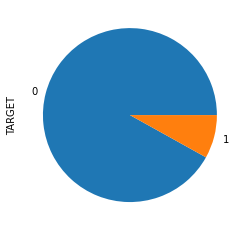

In [50]:
df_application_train['TARGET'].value_counts().plot(kind='pie')

#### Variables catégorielles

In [51]:
target_col = 'TARGET'
if DISPLAY_EDA_GRAPHS :
    for df, df_name in [[df_application_train, 'df_application_train'],
                        # [df_application_test, 'df_application_test'],
                        [df_bureau, 'df_bureau'],
                        [df_bureau_balance, 'df_bureau_balance'],
                        [df_credit_card_balance, 'df_credit_card_balance'],
                        [df_installments_payments, 'df_installments_payments'],
                        [df_POS_CASH_balance, 'df_POS_CASH_balance'],
                        [df_previous_application, 'df_previous_application']]:

        print(bcolors.BOLD+bcolors.HEADER+df_name+'\n'+'-'*len(df_name)+bcolors.ENDC)
        cat_cols = [col for col in df.columns if df[col].dtype == 'object']
        num_cols = list(set(df.columns) - set(cat_cols) - set(['SK_ID_CURR', 'SK_ID_BUREAU', 'TARGET']))
        feat_cols = num_cols + cat_cols
        all_cols = feat_cols + [target_col]

        plt.rcParams['figure.figsize'] = [15, 6]
        plt.rcParams['axes.titlesize'] = 20
        plt.rcParams['axes.labelsize'] = 14
        plt.rcParams['xtick.labelsize'] = 12
        plt.rcParams['ytick.labelsize'] = 12

        n = len(cat_cols)
        ind = 0
        for colonne in cat_cols:
            ind += 1
            DisplotData.trace_tuyaux_principaux(df,colonne, seuil=1., max_bar=50, kind='bar', rot=90, show_nan=True);

#### Variables numériques

In [52]:
plt.rcParams['figure.figsize'] = [15, 6]
plt.rcParams['axes.titlesize'] = 20
plt.rcParams['axes.labelsize'] = 14
plt.rcParams['xtick.labelsize'] = 12
plt.rcParams['ytick.labelsize'] = 12

In [53]:
if DISPLAY_EDA_GRAPHS :
    for df, df_name in [[df_application_train, 'df_application_train'],
                        # [df_application_test, 'df_application_test'],
                        [df_bureau, 'df_bureau'],
                        [df_bureau_balance, 'df_bureau_balance'],
                        [df_credit_card_balance, 'df_credit_card_balance'],
                        [df_installments_payments, 'df_installments_payments'],
                        [df_POS_CASH_balance, 'df_POS_CASH_balance'],
                        [df_previous_application, 'df_previous_application']]:

        print(bcolors.BOLD+bcolors.HEADER+df_name+'\n'+'-'*len(df_name)+bcolors.ENDC)
        cat_cols = [col for col in df.columns if df[col].dtype == 'object']
        num_cols = list(set(df.columns) - set(cat_cols) - set(['SK_ID_CURR', 'SK_ID_PREV', 'SK_ID_BUREAU', 'TARGET']))
        feat_cols = num_cols + cat_cols
        all_cols = feat_cols + [target_col]

        n = len(cat_cols)
        print(f"num_cols = {num_cols}")
        print(f"num_cols = {num_cols}")
        DisplotData.plot_distrib(df, num_cols, nbins=100)

**Analyses explo à pousser**
 - [ ] Pourquoi `DAYS_LAST_PHONE_CHANGE` a un énorme pic près de 0 ? 0 = NaN pour cette donnée ? Ca semble être la même chose pour les colonnes `Normalized information about building where the client live`
 - [ ] `EXT_SOURCE_2`, `EXT_SOURCE_3` : idem, mais en tant que var très influente, ne vaut-il pas mieux supprimer les 0.0 ?
 - [ ] idem `DAYS_DECISION`
 - [ ] `AMT_INCOME_TOTAL` : outlier(s) ! XGBoost y sera sensible (à vérifier)
 - [ ] `AMT_ANNUITY`, `AMT_CREDIT_SUM`, `AMT_INCOME_TOTAL`, `AMT_CREDIT_SUM_DEBT`, `AMT_CREDIT_MAX_OVERDUE`, `AMT_CREDIT_SUM_OVERDUE`, `AMT_CREDIT_SUM_LIMIT` : outlier(s) ! XGBoost y sera sensible (à vérifier)
 - [ ] `CREDIT_DAY_OVERDUE`, `CNT_CREDIT_PROLONG` : outlier(s) ?
 - [ ] `AMT_REQ_CREDIT_BUREAU_DAY`, `AMT_REQ_CREDIT_BUREAU_WEEK` quasiment que des 0 et des pouillèmes de 1 et autres (mais niv0)
 - [ ] `DAYS_CREDIT_ENDDATE` : encore un 365000 qui n'a pas été nettoyé ? (niv3)
 - [ ] `DAYS_CREDIT_UPDATE` : un -365000 qui n'a pas été nettoyé ? (niv1)
 - [ ] `DAYS_ENDDATE_FACT` : un -365000 qui n'a pas été nettoyé ? (niv1)

In [54]:
df_application_train['FLAG_OWN_REALTY'].value_counts()

Y    213312
N     94199
Name: FLAG_OWN_REALTY, dtype: int64

### Etudes bivariées

### Etudes multivariées 

#### ACP de visu

In [55]:
selected_features_file = data_dir+'selected_features.csv'
selected_features = read_feature_selection(selected_features_file, min_level=3)
selected_features.head()

,Column1,Table,Row,Traduction description,Non-relaxable,Interet (0-3),Commentaire interet,Operations,Description,Special
0,1,application_{train|test}.csv,SK_ID_CURR,ID de pret dans notre echantillon,0,3.0,NaN,NaN,ID of loan in our sample,NaN
1,2,application_{train|test}.csv,TARGET,Variable cible (1 - Client avec difficultes de...,0,3.0,NaN,NaN,Target variable (1 - client with payment diffi...,NaN
2,5,application_{train|test}.csv,NAME_CONTRACT_TYPE,Identification si le pret est cash ou revolving,1,3.0,Revolving = plutet surendettatoire,NaN,Identification if loan is cash or revolving,NaN
3,6,application_{train|test}.csv,CODE_GENDER,Sexe du client,1,3.0,LGBM2,NaN,Gender of the client,NaN
4,7,application_{train|test}.csv,FLAG_OWN_CAR,Flag Si le client possede une voiture,1,3.0,NaN,NaN,Flag if the client owns a car,NaN


In [56]:
# debug = True
df_prep, cat_cols, num_cols = preprocess(selected_features=selected_features, num_rows=100000) # 
acp_df = df_prep[df_prep['TARGET'].notnull()].copy()
acp_df = acp_df.dropna(axis=0)
del(df_prep)

Train samples: 100000, test samples: 48744
Bureau df shape: (305811, 87)
Process bureau and bureau_balance - done in 19s
Previous applications df shape: (338857, 38)
Process previous_applications - done in 4s
Pos-cash balance df shape: (337252, 15)
Process POS-CASH balance - done in 8s
Installments payments df shape: (339587, 4)
Process installments payments - done in 3s
Credit card balance df shape: (103558, 61)
Process credit card balance - done in 8s


In [57]:
# On ne retient que les colonnes numériques continues

In [58]:
# cols = [col for col in acp_df.columns if acp_df[col].dtype!='object']
cols = [col for col in acp_df.columns if '_NR' not in col]
acp_df = acp_df[cols]

In [59]:
acp_df

,SK_ID_CURR,TARGET,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,DAYS_BIRTH,DAYS_REGISTRATION,DAYS_ID_PUBLISH,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,DAYS_LAST_PHONE_CHANGE,DAYS_EMPLOYED_PERC,INCOME_CREDIT_PERC,INCOME_PER_PERSON,ANNUITY_INCOME_PERC,PAYMENT_RATE,BURO_DAYS_CREDIT#MAX,BURO_AMT_CREDIT_SUM#MAX,BURO_AMT_CREDIT_SUM#MEAN,BURO_AMT_CREDIT_SUM#SUM,BURO_CREDIT_DAY_OVERDUE#MIN,BURO_CREDIT_DAY_OVERDUE#MAX,BURO_CREDIT_DAY_OVERDUE#MEAN,BURO_AMT_CREDIT_SUM_OVERDUE#MIN,BURO_AMT_CREDIT_SUM_OVERDUE#MAX,BURO_AMT_CREDIT_SUM_OVERDUE#MEAN,BURO_AMT_CREDIT_MAX_OVERDUE#MIN,BURO_AMT_CREDIT_MAX_OVERDUE#MAX,BURO_AMT_CREDIT_MAX_OVERDUE#MEAN,BURO_DAYS_CREDIT_ENDDATE#MIN,BURO_DAYS_CREDIT_ENDDATE#MAX,BURO_DAYS_CREDIT_ENDDATE#MEAN,BURO_AMT_CREDIT_SUM_DEBT#MIN,BURO_AMT_CREDIT_SUM_DEBT#MAX,BURO_AMT_CREDIT_SUM_DEBT#MEAN,ACTIVE_DAYS_CREDIT#MAX,ACTIVE_AMT_CREDIT_SUM#MAX,ACTIVE_AMT_CREDIT_SUM#MEAN,ACTIVE_AMT_CREDIT_SUM#SUM,ACTIVE_CREDIT_DAY_OVERDUE#MIN,ACTIVE_CREDIT_DAY_OVERDUE#MAX,ACTIVE_CREDIT_DAY_OVERDUE#MEAN,ACTIVE_AMT_CREDIT_SUM_OVERDUE#MIN,ACTIVE_AMT_CREDIT_SUM_OVERDUE#MAX,ACTIVE_AMT_CREDIT_SUM_OVERDUE#MEAN,ACTIVE_AMT_CREDIT_MAX_OVERDUE#MIN,ACTIVE_AMT_CREDIT_MAX_OVERDUE#MAX,ACTIVE_AMT_CREDIT_MAX_OVERDUE#MEAN,ACTIVE_DAYS_CREDIT_ENDDATE#MIN,ACTIVE_DAYS_CREDIT_ENDDATE#MAX,ACTIVE_DAYS_CREDIT_ENDDATE#MEAN,ACTIVE_AMT_CREDIT_SUM_DEBT#MIN,ACTIVE_AMT_CREDIT_SUM_DEBT#MAX,ACTIVE_AMT_CREDIT_SUM_DEBT#MEAN,CLOSED_DAYS_CREDIT#MAX,CLOSED_AMT_CREDIT_SUM#MAX,CLOSED_AMT_CREDIT_SUM#MEAN,CLOSED_AMT_CREDIT_SUM#SUM,CLOSED_CREDIT_DAY_OVERDUE#MIN,CLOSED_CREDIT_DAY_OVERDUE#MAX,CLOSED_CREDIT_DAY_OVERDUE#MEAN,CLOSED_AMT_CREDIT_SUM_OVERDUE#MIN,CLOSED_AMT_CREDIT_SUM_OVERDUE#MAX,CLOSED_AMT_CREDIT_SUM_OVERDUE#MEAN,CLOSED_AMT_CREDIT_MAX_OVERDUE#MIN,CLOSED_AMT_CREDIT_MAX_OVERDUE#MAX,CLOSED_AMT_CREDIT_MAX_OVERDUE#MEAN,CLOSED_DAYS_CREDIT_ENDDATE#MIN,CLOSED_DAYS_CREDIT_ENDDATE#MAX,CLOSED_DAYS_CREDIT_ENDDATE#MEAN,CLOSED_AMT_CREDIT_SUM_DEBT#MIN,CLOSED_AMT_CREDIT_SUM_DEBT#MAX,CLOSED_AMT_CREDIT_SUM_DEBT#MEAN,PREV_AMT_GOODS_PRICE#MIN,PREV_AMT_GOODS_PRICE#MAX,PREV_AMT_GOODS_PRICE#MEAN,PREV_DAYS_DECISION#MIN,PREV_DAYS_DECISION#MAX,PREV_DAYS_DECISION#MEAN,APPROVED_AMT_GOODS_PRICE#MIN,APPROVED_AMT_GOODS_PRICE#MAX,APPROVED_AMT_GOODS_PRICE#MEAN,APPROVED_DAYS_DECISION#MIN,APPROVED_DAYS_DECISION#MAX,APPROVED_DAYS_DECISION#MEAN,REFUSED_AMT_GOODS_PRICE#MIN,REFUSED_AMT_GOODS_PRICE#MAX,REFUSED_AMT_GOODS_PRICE#MEAN,REFUSED_DAYS_DECISION#MIN,REFUSED_DAYS_DECISION#MAX,REFUSED_DAYS_DECISION#MEAN,POS_SK_DPD#MAX,POS_SK_DPD#MEAN,POS_SK_DPD_DEF#MAX,POS_SK_DPD_DEF#MEAN,INSTAL_DAYS_ENTRY_PAYMENT#MAX,INSTAL_DAYS_ENTRY_PAYMENT#MEAN,INSTAL_DAYS_ENTRY_PAYMENT#SUM,CC_AMT_BALANCE#MIN,CC_AMT_BALANCE#MAX,CC_AMT_BALANCE#MEAN,CC_AMT_BALANCE#SUM,CC_AMT_BALANCE#VAR,CC_AMT_RECEIVABLE_PRINCIPAL#MIN,CC_AMT_RECEIVABLE_PRINCIPAL#MAX,CC_AMT_RECEIVABLE_PRINCIPAL#MEAN,CC_AMT_RECEIVABLE_PRINCIPAL#SUM,CC_AMT_RECEIVABLE_PRINCIPAL#VAR,CC_AMT_RECIVABLE#MIN,CC_AMT_RECIVABLE#MAX,CC_AMT_RECIVABLE#MEAN,CC_AMT_RECIVABLE#SUM,CC_AMT_RECIVABLE#VAR,CC_SK_DPD#MIN,CC_SK_DPD#MAX,CC_SK_DPD#MEAN,CC_SK_DPD#SUM,CC_SK_DPD#VAR
135,100157,0.0,180000.0,1755000.0,61132.5,-16086,-3174.0,-4584,0.867872,0.147685,0.669057,0.0,0.096295,0.102564,90000.0,0.339625,0.034833,-159.0,450000.000,196035.012000,980175.060,0.0,0.0,0.000000,0.0,0.0,0.000,0.0,0.000,0.000000,-2382.0,1667.0,-460.200000,0.0,432603.000,86520.600000,-159.0,450000.00,4.500000e+05,450000.000,0.0,0.0,0.000000,0.0,0.0,0.000,0.000,0.000,0.00000,1667.0,1667.0,1667.000000,432603.0,432603.000,432603.000000,-1278.0,408352.500,132543.765000,530175.060,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.0000,-2382.0,493.0,-992.000000,0.0,0.0,0.0,49495.50,78718.5,68977.500000,-1934.0,-265.0,-1435.800000,49495.50,78718.5,64107.0000,-1934.0,-1430.0,-1660.000000,78718.5,78718.5,78718.50,-1934.0,-1934.0,-1934.000000,0.0,0.000000,0.0,0.000000,-1333.0,-1626.727273,-35788.0,0.000,0.000,0.000000,0.000,0.000000e+00,0.000,0.000,0.000000,0.000,0.000000e+00,0.000,0.000,0.000000,0.000,0.000000e+00,0.0,0.0,0.00000,0.0,0.000000
153,100180,0

In [60]:
from sklearn.decomposition import PCA

In [61]:
X_train_pca = acp_df[cols].drop(['TARGET'], axis=1)
y = acp_df[['TARGET']]

# Centrage et Réduction
std_scale = StandardScaler().fit(X_train_pca)
X_train_pca_scaled = std_scale.transform(X_train_pca)
# Calcul des composantes principales
pca = PCA(n_components=2)
pca.fit(X_train_pca_scaled)
X_train_pca_proj = pca.transform(X_train_pca_scaled)
# DataFrame
# X_train_pca_proj = pd.DataFrame(X_train_pca_proj,index=X_train_pca.index)


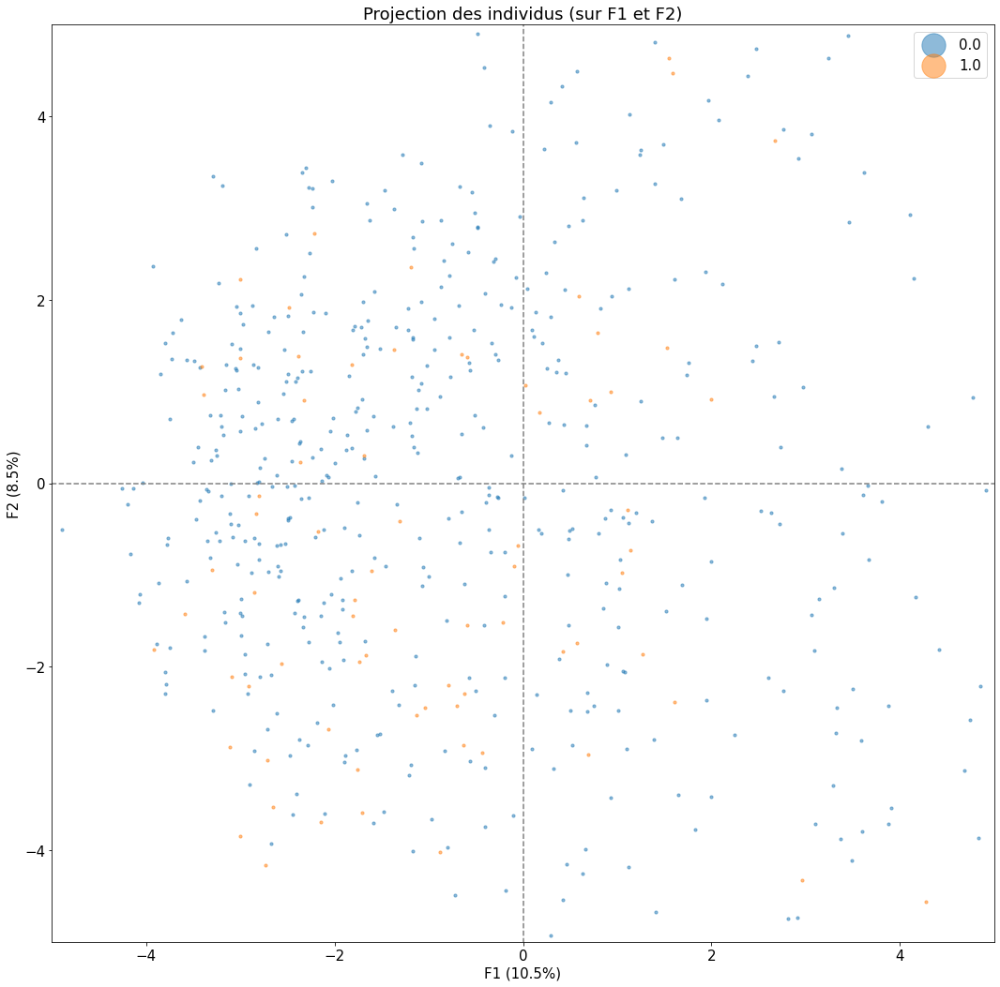

In [62]:
plt.rcParams['figure.figsize'] = [18, 18]
plt.rcParams['axes.titlesize'] = 18
plt.rcParams['axes.labelsize'] = 15
plt.rcParams['xtick.labelsize'] = 15
plt.rcParams['ytick.labelsize'] = 15
illustrative_var = [str(val[0]) for val in y.values]
DisplotML.display_factorial_planes(X_train_pca_proj, 2, pca, [(0,1)], alpha=0.5, labels=None,
                                   marker='o', s=10 , illustrative_var=illustrative_var,
                                   xlim=[-5.,5.], ylim=[-5.,5.]
                                  )
plt.show()

On a un "overlapping" assez important, mais difficile de conclure sur une ACP.

# Premiers modèles 

## Variables : toutes

In [392]:
submission_file_name = "submission_kernel02.csv"

In [393]:
debug = False
df_prep, cat_cols, num_cols = preprocess(selected_features=None, debug=debug)

Train samples: 307511, test samples: 48744
bb_cat 1 = ['STATUS__0', 'STATUS__1', 'STATUS__2', 'STATUS__3', 'STATUS__4', 'STATUS__5', 'STATUS__C', 'STATUS__X', 'STATUS__nan']
bb_cat 2 = ['STATUS__0', 'STATUS__1', 'STATUS__2', 'STATUS__3', 'STATUS__4', 'STATUS__5', 'STATUS__C', 'STATUS__X', 'STATUS__nan']
ON PASSE BIEN ICI
bureau.shape = (1716428, 51)
Bureau df shape: (305811, 116)
Process bureau and bureau_balance - done in 26s
Previous applications df shape: (338858, 249)
Process previous_applications - done in 29s
Pos-cash balance df shape: (337252, 18)
Process POS-CASH balance - done in 13s
Installments payments df shape: (339585, 26)
Process installments payments - done in 35s
Credit card balance df shape: (103558, 141)
Process credit card balance - done in 30s


In [402]:
debug = True
df_prep_3000, cat_cols, num_cols = preprocess(selected_features=None, debug=debug)

Train samples: 3000, test samples: 3000
bb_cat 1 = ['STATUS__0', 'STATUS__1', 'STATUS__2', 'STATUS__3', 'STATUS__4', 'STATUS__5', 'STATUS__C', 'STATUS__X', 'STATUS__nan']
bb_cat 2 = ['STATUS__0', 'STATUS__1', 'STATUS__2', 'STATUS__3', 'STATUS__4', 'STATUS__5', 'STATUS__C', 'STATUS__X', 'STATUS__nan']
ON PASSE BIEN ICI
bureau.shape = (1716428, 51)
Bureau df shape: (305811, 116)
Process bureau and bureau_balance - done in 26s
Previous applications df shape: (338858, 249)
Process previous_applications - done in 28s
Pos-cash balance df shape: (337252, 18)
Process POS-CASH balance - done in 12s
Installments payments df shape: (339585, 26)
Process installments payments - done in 30s
Credit card balance df shape: (103558, 141)
Process credit card balance - done in 17s


In [407]:
debug = False
df_prep_10000, cat_cols, num_cols = preprocess(selected_features=None, debug=debug, num_rows=10000)

Train samples: 10000, test samples: 10000
Bureau df shape: (305811, 116)
Process bureau and bureau_balance - done in 23s
Previous applications df shape: (338858, 249)
Process previous_applications - done in 27s
Pos-cash balance df shape: (337252, 18)
Process POS-CASH balance - done in 11s
Installments payments df shape: (339585, 26)
Process installments payments - done in 28s
Credit card balance df shape: (103558, 141)
Process credit card balance - done in 16s


### RandomForest

Starting RandomForest. Train shape: (307507, 798), test shape: (48744, 798)
X = [[ 0.72102166 -0.71806108 -0.66446125 ...  0.          0.
   0.        ]
 [-1.38692089  1.39263919 -0.66446125 ...  0.          0.
   0.        ]
 [-1.38692089 -0.71806108  1.50497866 ...  0.          0.
   0.        ]
 ...
 [-1.38692089  1.39263919 -0.66446125 ...  0.          0.
   0.        ]
 [-1.38692089 -0.71806108  1.50497866 ...  0.          0.
   0.        ]
 [ 0.72102166 -0.71806108 -0.66446125 ...  0.          0.
   0.        ]]
y = 280107    0.0
15631     0.0
295364    0.0
137238    0.0
109419    0.0
         ... 
168446    0.0
230231    0.0
123010    0.0
224026    0.0
35220     0.0
Name: TARGET, Length: 246005, dtype: float64
y_train_pred = [0.022 0.022 0.012 ... 0.028 0.018 0.02 ]
Train AUC score 1.000000
Test  AUC score 0.733662
Run RandomForest - done in 21908s
Stored 'feat_importance_rf' (DataFrame)
Stored 'train_df_rf' (DataFrame)
Stored 'test_df_rf' (DataFrame)


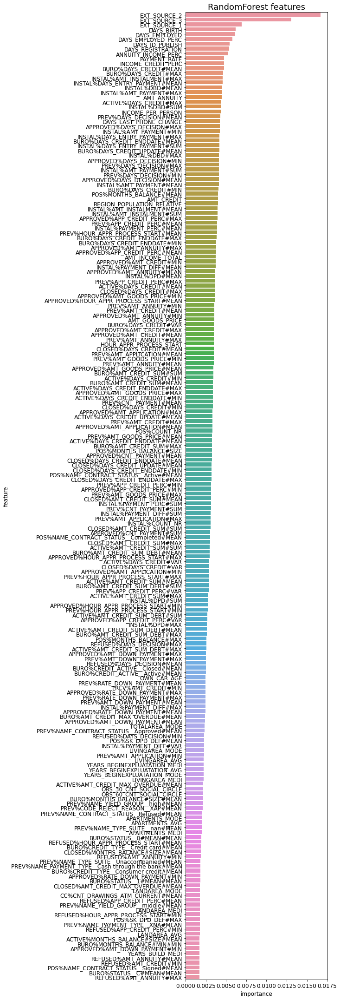

In [409]:
plt.rcParams['figure.figsize'] = [10, 30]
with timer("Run RandomForest"):
    feat_importance_rf, train_df_rf, test_df_rf = kfold_algo(df_prep, cat_cols, num_cols, algo_name='RandomForest', n_folds=5, stratified=True, debug=debug)
%store feat_importance_rf
%store train_df_rf
%store test_df_rf

Starting RandomForest. Train shape: (10000, 796), test shape: (10000, 796)
X = [[ 0.71854035 -0.70200842 -0.66011376 ...  0.          0.
  -1.45202944]
 [ 0.71854035 -0.70200842  1.5148904  ...  0.          0.
   0.        ]
 [ 0.71854035 -0.70200842 -0.66011376 ...  0.          0.
   3.31000672]
 ...
 [-1.3917103  -0.70200842 -0.66011376 ...  0.          0.
   0.        ]
 [-1.3917103   1.42448434  1.5148904  ...  0.          0.
  -1.67879307]
 [ 0.71854035 -0.70200842 -0.66011376 ...  0.          0.
  -0.60166584]]
y = 4512    0.0
1930    0.0
9364    0.0
632     0.0
9208    0.0
       ... 
4897    0.0
4485    1.0
8770    0.0
6760    0.0
6724    0.0
Name: TARGET, Length: 8000, dtype: float64
y_train_pred = [0.07955258 0.09096611 0.08642578 ... 0.09525387 0.06593933 0.06297955]
Train AUC score 0.782592
Test  AUC score 0.733270
Run RandomForest - done in 250s
Stored 'feat_importance_rf_10000' (DataFrame)
Stored 'train_df_rf_10000' (DataFrame)
Stored 'test_df_rf_10000' (DataFrame)


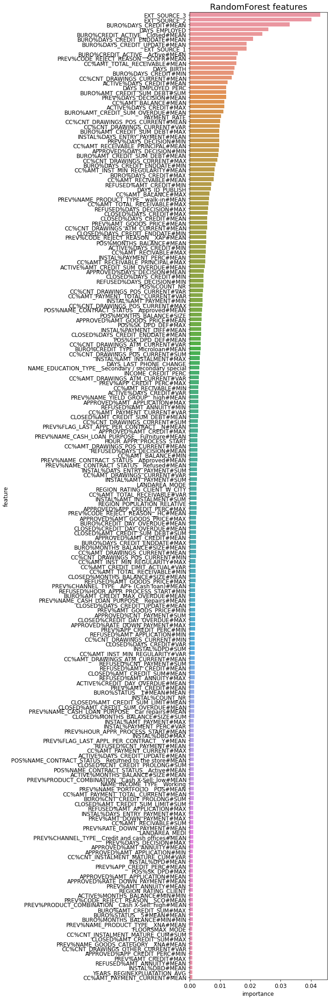

In [411]:
plt.rcParams['figure.figsize'] = [10, 30]
with timer("Run RandomForest"):
    feat_importance_rf_10000, train_df_rf_10000, test_df_rf_10000 = kfold_algo(df_prep_10000, cat_cols, num_cols, algo_name='RandomForest', n_folds=5, stratified=True, debug=debug)
%store feat_importance_rf_10000
%store train_df_rf_10000
%store test_df_rf_10000

Starting RandomForest. Train shape: (3000, 795), test shape: (3000, 795)
X = [[ 0.73783572  1.38553529 -0.67419986 ...  0.          0.
   3.04067075]
 [ 0.73783572 -0.72174272 -0.67419986 ...  0.          0.
   0.        ]
 [ 0.73783572 -0.72174272 -0.67419986 ...  0.          0.
   0.        ]
 ...
 [ 0.73783572  1.38553529 -0.67419986 ...  0.          0.
   0.        ]
 [ 0.73783572 -0.72174272  1.4832397  ...  0.          0.
   0.        ]
 [-1.35531525  1.38553529 -0.67419986 ...  0.          0.
  -0.4895411 ]]
y = 2617    0.0
2779    0.0
25      0.0
1180    0.0
2105    0.0
       ... 
1465    1.0
1592    0.0
2496    0.0
1166    0.0
2922    0.0
Name: TARGET, Length: 2400, dtype: float64
y_train_pred = [0.08757911 0.08212437 0.0988922  ... 0.07910923 0.06189028 0.07048669]
Train AUC score 0.881898
Test  AUC score 0.705821
Run RandomForest - done in 75s
Stored 'feat_importance_rf_3000' (DataFrame)
Stored 'train_df_rf_3000' (DataFrame)
Stored 'test_df_rf_3000' (DataFrame)


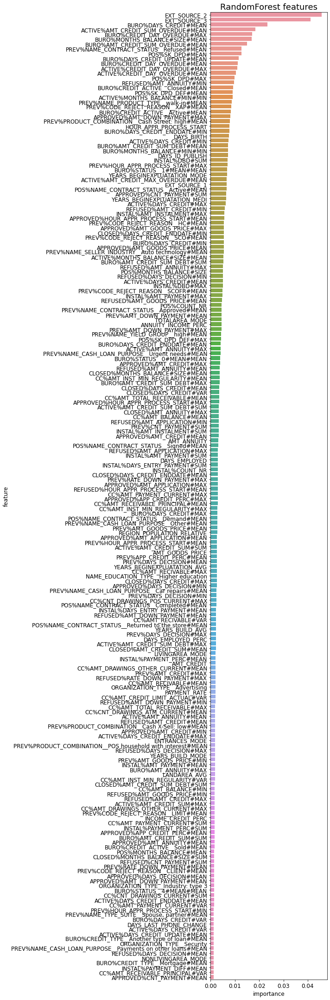

In [410]:
plt.rcParams['figure.figsize'] = [10, 30]
with timer("Run RandomForest"):
    feat_importance_rf_3000, train_df_rf_3000, test_df_rf_3000 = kfold_algo(df_prep_3000, cat_cols, num_cols, algo_name='RandomForest', n_folds=5, stratified=True, debug=debug)
%store feat_importance_rf_3000
%store train_df_rf_3000
%store test_df_rf_3000

### XGBoost

<div class="burk">
C'est pas là que tu veux aller</div>

Starting XGBoost. Train shape: (307507, 798), test shape: (48744, 798)
X = [[ 0.72102166 -0.71806108 -0.66446125 ...  0.          0.
   0.        ]
 [-1.38692089  1.39263919 -0.66446125 ...  0.          0.
   0.        ]
 [-1.38692089 -0.71806108  1.50497866 ...  0.          0.
   0.        ]
 ...
 [-1.38692089  1.39263919 -0.66446125 ...  0.          0.
   0.        ]
 [-1.38692089 -0.71806108  1.50497866 ...  0.          0.
   0.        ]
 [ 0.72102166 -0.71806108 -0.66446125 ...  0.          0.
   0.        ]]
y = 280107    0.0
15631     0.0
295364    0.0
137238    0.0
109419    0.0
         ... 
168446    0.0
230231    0.0
123010    0.0
224026    0.0
35220     0.0
Name: TARGET, Length: 246005, dtype: float64
y_train_pred = [0.13850068 0.03381256 0.03328817 ... 0.0400159  0.07306881 0.03407328]
Train AUC score 0.857301
Test  AUC score 0.789662
Run XGBoost - done in 6680s
Stored 'feat_importance_xgb' (DataFrame)
Stored 'train_df_xgb' (DataFrame)
Stored 'test_df_xgb' (DataFrame)


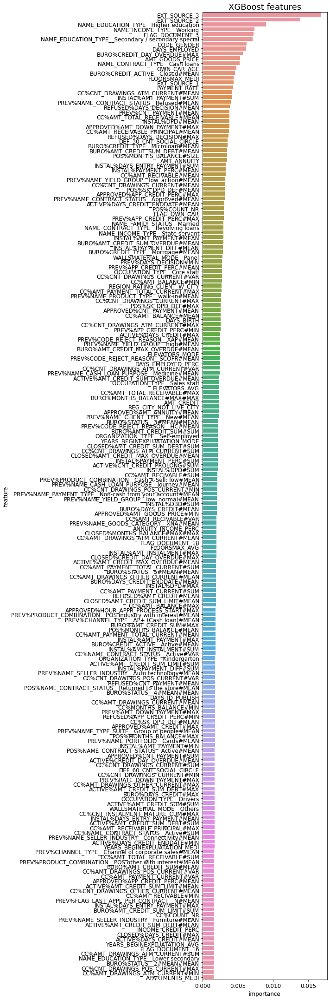

In [396]:
plt.rcParams['figure.figsize'] = [10, 30]
with timer("Run XGBoost"):
    feat_importance_xgb, train_df_xgb, test_df_xgb = kfold_algo(df_prep, cat_cols, num_cols, algo_name='XGBoost', n_folds=5, stratified=True, debug=debug)
%store feat_importance_xgb
%store train_df_xgb
%store test_df_xgb

#### 10000 points

Starting XGBoost. Train shape: (10000, 796), test shape: (10000, 796)
X = [[ 0.71854035 -0.70200842 -0.66011376 ...  0.          0.
  -1.45202944]
 [ 0.71854035 -0.70200842  1.5148904  ...  0.          0.
   0.        ]
 [ 0.71854035 -0.70200842 -0.66011376 ...  0.          0.
   3.31000672]
 ...
 [-1.3917103  -0.70200842 -0.66011376 ...  0.          0.
   0.        ]
 [-1.3917103   1.42448434  1.5148904  ...  0.          0.
  -1.67879307]
 [ 0.71854035 -0.70200842 -0.66011376 ...  0.          0.
  -0.60166584]]
y = 4512    0.0
1930    0.0
9364    0.0
632     0.0
9208    0.0
       ... 
4897    0.0
4485    1.0
8770    0.0
6760    0.0
6724    0.0
Name: TARGET, Length: 8000, dtype: float64
y_train_pred = [0.00633196 0.06962056 0.01979604 ... 0.04656306 0.00880422 0.00135875]
Train AUC score 0.999997
Test  AUC score 0.755465
Run XGBoost - done in 210s
Stored 'feat_importance_xgb_10000' (DataFrame)
Stored 'train_df_xgb_10000' (DataFrame)
Stored 'test_df_xgb_10000' (DataFrame)


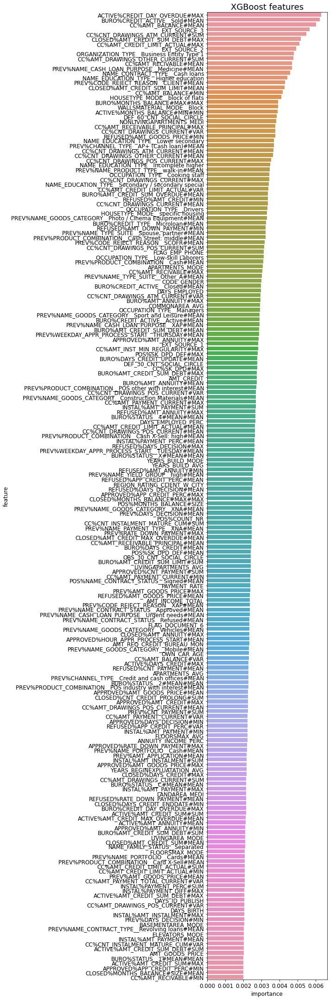

In [412]:
plt.rcParams['figure.figsize'] = [10, 30]
with timer("Run XGBoost"):
    feat_importance_xgb_10000, train_df_xgb_10000, test_df_xgb_10000 = kfold_algo(df_prep_10000, cat_cols, num_cols, algo_name='XGBoost', n_folds=5, stratified=True, debug=debug)
%store feat_importance_xgb_10000
%store train_df_xgb_10000
%store test_df_xgb_10000

#### 3000 points

<span class="girk">C'est là</span>

Starting XGBoost. Train shape: (3000, 795), test shape: (3000, 795)
X = [[ 0.73783572  1.38553529 -0.67419986 ...  0.          0.
   3.04067075]
 [ 0.73783572 -0.72174272 -0.67419986 ...  0.          0.
   0.        ]
 [ 0.73783572 -0.72174272 -0.67419986 ...  0.          0.
   0.        ]
 ...
 [ 0.73783572  1.38553529 -0.67419986 ...  0.          0.
   0.        ]
 [ 0.73783572 -0.72174272  1.4832397  ...  0.          0.
   0.        ]
 [-1.35531525  1.38553529 -0.67419986 ...  0.          0.
  -0.4895411 ]]
X.sum.sum = -2.1683987938558857e-11
y = 2617    0.0
2779    0.0
25      0.0
1180    0.0
2105    0.0
       ... 
1465    1.0
1592    0.0
2496    0.0
1166    0.0
2922    0.0
Name: TARGET, Length: 2400, dtype: float64
y_train_pred = [0.00976634 0.00390261 0.00162326 ... 0.0004294  0.00067211 0.00104651]
y_test_pred = [1.59741248e-04 2.02635513e-03 8.69130483e-04 3.61903827e-03
 7.69452238e-03 3.38886352e-03 7.80846737e-03 2.36019582e-01
 1.07924342e-02 3.71508626e-03 2.33652798e-04 

Train AUC score 1.000000
Test  AUC score 0.703936
Run XGBoost - done in 78s
Stored 'feat_importance_xgb_3000' (DataFrame)
Stored 'train_df_xgb_3000' (DataFrame)
Stored 'test_df_xgb_3000' (DataFrame)


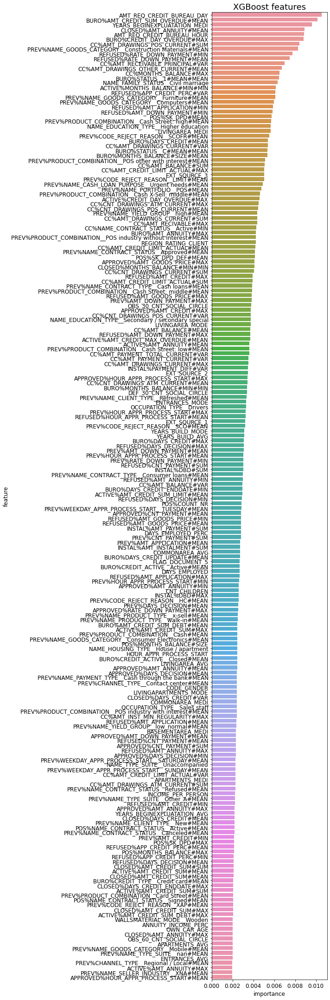

In [457]:
plt.rcParams['figure.figsize'] = [10, 30]
with timer("Run XGBoost"):
    feat_importance_xgb_3000, train_df_xgb_3000, test_df_xgb_3000 = kfold_algo(df_prep_3000, cat_cols, num_cols, algo_name='XGBoost', n_folds=5, stratified=True, debug=debug)
%store feat_importance_xgb_3000
%store train_df_xgb_3000
%store test_df_xgb_3000

In [440]:
df_prep_3000.shape

(6000, 795)

In [435]:
df_prep_3000.columns

Index(['index', 'SK_ID_CURR', 'TARGET', 'CODE_GENDER', 'FLAG_OWN_CAR',
       'FLAG_OWN_REALTY', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL', 'AMT_CREDIT',
       'AMT_ANNUITY',
       ...
       'CC%NAME_CONTRACT_STATUS__Signed#MAX',
       'CC%NAME_CONTRACT_STATUS__Signed#MEAN',
       'CC%NAME_CONTRACT_STATUS__Signed#SUM',
       'CC%NAME_CONTRACT_STATUS__Signed#VAR',
       'CC%NAME_CONTRACT_STATUS__nan#MIN', 'CC%NAME_CONTRACT_STATUS__nan#MAX',
       'CC%NAME_CONTRACT_STATUS__nan#MEAN', 'CC%NAME_CONTRACT_STATUS__nan#SUM',
       'CC%NAME_CONTRACT_STATUS__nan#VAR', 'CC%COUNT_NR'],
      dtype='object', length=795)

In [437]:
train_df.columns

Index(['SK_ID_CURR', 'TARGET', 'CODE_GENDER_NR', 'FLAG_OWN_CAR_NR',
       'FLAG_OWN_REALTY_NR', 'CNT_CHILDREN_NR', 'AMT_INCOME_TOTAL',
       'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE',
       ...
       'CC%CNT_INSTALMENT_MATURE_CUM#MAX', 'CC%CNT_INSTALMENT_MATURE_CUM#MEAN',
       'CC%SK_DPD#MEAN', 'CC%SK_DPD#MAX', 'CC%SK_DPD#SUM',
       'CC%AMT_RECIVABLE#MEAN', 'CC%AMT_DRAWINGS_CURRENT#MIN',
       'CC%AMT_DRAWINGS_CURRENT#MAX', 'CC%AMT_DRAWINGS_CURRENT#MEAN',
       'CC%COUNT_NR'],
      dtype='object', length=501)

### LightGBM

Starting LightGBM. Train shape: (307507, 798), test shape: (48744, 798)


'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.
'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.


[LightGBM] [Warning] num_threads is set with n_jobs=-1, nthread=4 will be ignored. Current value: num_threads=-1
[200]	training's auc: 0.797087	training's binary_logloss: 0.235295	valid_1's auc: 0.768136	valid_1's binary_logloss: 0.244041
[400]	training's auc: 0.819751	training's binary_logloss: 0.225749	valid_1's auc: 0.778787	valid_1's binary_logloss: 0.240116
[600]	training's auc: 0.835034	training's binary_logloss: 0.219476	valid_1's auc: 0.782425	valid_1's binary_logloss: 0.238872
[800]	training's auc: 0.847251	training's binary_logloss: 0.214436	valid_1's auc: 0.784	valid_1's binary_logloss: 0.238397
[1000]	training's auc: 0.857487	training's binary_logloss: 0.210047	valid_1's auc: 0.785093	valid_1's binary_logloss: 0.238059
[1200]	training's auc: 0.866842	training's binary_logloss: 0.205966	valid_1's auc: 0.785677	valid_1's binary_logloss: 0.237885
[1400]	training's auc: 0.874672	training's binary_logloss: 0.202417	valid_1's auc: 0.785888	valid_1's binary_logloss: 0.237847
[1600

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.
'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.


[LightGBM] [Warning] num_threads is set with n_jobs=-1, nthread=4 will be ignored. Current value: num_threads=-1
[200]	training's auc: 0.796839	training's binary_logloss: 0.235452	valid_1's auc: 0.770545	valid_1's binary_logloss: 0.243138
[400]	training's auc: 0.819556	training's binary_logloss: 0.225854	valid_1's auc: 0.780664	valid_1's binary_logloss: 0.239125
[600]	training's auc: 0.834819	training's binary_logloss: 0.219608	valid_1's auc: 0.784652	valid_1's binary_logloss: 0.237804
[800]	training's auc: 0.846967	training's binary_logloss: 0.2146	valid_1's auc: 0.786207	valid_1's binary_logloss: 0.237271
[1000]	training's auc: 0.85772	training's binary_logloss: 0.210062	valid_1's auc: 0.787107	valid_1's binary_logloss: 0.23701
[1200]	training's auc: 0.867163	training's binary_logloss: 0.205964	valid_1's auc: 0.787719	valid_1's binary_logloss: 0.236849
[1400]	training's auc: 0.875339	training's binary_logloss: 0.202244	valid_1's auc: 0.787784	valid_1's binary_logloss: 0.236876
Fold  

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.
'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.


[LightGBM] [Warning] num_threads is set with n_jobs=-1, nthread=4 will be ignored. Current value: num_threads=-1
[200]	training's auc: 0.796449	training's binary_logloss: 0.235617	valid_1's auc: 0.773163	valid_1's binary_logloss: 0.242119
[400]	training's auc: 0.819306	training's binary_logloss: 0.225972	valid_1's auc: 0.783881	valid_1's binary_logloss: 0.237748
[600]	training's auc: 0.834463	training's binary_logloss: 0.219807	valid_1's auc: 0.78786	valid_1's binary_logloss: 0.236302
[800]	training's auc: 0.846386	training's binary_logloss: 0.214865	valid_1's auc: 0.789866	valid_1's binary_logloss: 0.235631
[1000]	training's auc: 0.856673	training's binary_logloss: 0.210512	valid_1's auc: 0.791063	valid_1's binary_logloss: 0.235282
[1200]	training's auc: 0.866216	training's binary_logloss: 0.206368	valid_1's auc: 0.791728	valid_1's binary_logloss: 0.235052
[1400]	training's auc: 0.875008	training's binary_logloss: 0.202411	valid_1's auc: 0.79198	valid_1's binary_logloss: 0.234987
[160

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.
'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.


[LightGBM] [Warning] num_threads is set with n_jobs=-1, nthread=4 will be ignored. Current value: num_threads=-1
[200]	training's auc: 0.79689	training's binary_logloss: 0.235478	valid_1's auc: 0.77515	valid_1's binary_logloss: 0.241717
[400]	training's auc: 0.81943	training's binary_logloss: 0.225906	valid_1's auc: 0.78508	valid_1's binary_logloss: 0.237513
[600]	training's auc: 0.834676	training's binary_logloss: 0.219677	valid_1's auc: 0.789329	valid_1's binary_logloss: 0.235905
[800]	training's auc: 0.846922	training's binary_logloss: 0.214673	valid_1's auc: 0.790915	valid_1's binary_logloss: 0.235214
[1000]	training's auc: 0.857519	training's binary_logloss: 0.210237	valid_1's auc: 0.791714	valid_1's binary_logloss: 0.234907
[1200]	training's auc: 0.867253	training's binary_logloss: 0.206001	valid_1's auc: 0.792259	valid_1's binary_logloss: 0.23469
[1400]	training's auc: 0.87606	training's binary_logloss: 0.202029	valid_1's auc: 0.792503	valid_1's binary_logloss: 0.234536
[1600]	t

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.
'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.


[LightGBM] [Warning] num_threads is set with n_jobs=-1, nthread=4 will be ignored. Current value: num_threads=-1
[200]	training's auc: 0.796809	training's binary_logloss: 0.235428	valid_1's auc: 0.773545	valid_1's binary_logloss: 0.242894
[400]	training's auc: 0.819157	training's binary_logloss: 0.225937	valid_1's auc: 0.785032	valid_1's binary_logloss: 0.238563
[600]	training's auc: 0.83424	training's binary_logloss: 0.219795	valid_1's auc: 0.789008	valid_1's binary_logloss: 0.237142
[800]	training's auc: 0.846413	training's binary_logloss: 0.214889	valid_1's auc: 0.791069	valid_1's binary_logloss: 0.236364
[1000]	training's auc: 0.856799	training's binary_logloss: 0.210573	valid_1's auc: 0.792163	valid_1's binary_logloss: 0.235938
[1200]	training's auc: 0.865908	training's binary_logloss: 0.206618	valid_1's auc: 0.792629	valid_1's binary_logloss: 0.235786
[1400]	training's auc: 0.87467	training's binary_logloss: 0.202635	valid_1's auc: 0.792705	valid_1's binary_logloss: 0.235736
[160

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.
'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.


[LightGBM] [Warning] num_threads is set with n_jobs=-1, nthread=4 will be ignored. Current value: num_threads=-1
[200]	training's auc: 0.796397	training's binary_logloss: 0.235616	valid_1's auc: 0.778508	valid_1's binary_logloss: 0.241054
[400]	training's auc: 0.81892	training's binary_logloss: 0.226037	valid_1's auc: 0.78927	valid_1's binary_logloss: 0.236511
[600]	training's auc: 0.833682	training's binary_logloss: 0.219922	valid_1's auc: 0.793305	valid_1's binary_logloss: 0.235009
[800]	training's auc: 0.845974	training's binary_logloss: 0.214955	valid_1's auc: 0.795187	valid_1's binary_logloss: 0.234317
[1000]	training's auc: 0.856235	training's binary_logloss: 0.210598	valid_1's auc: 0.795873	valid_1's binary_logloss: 0.234045
[1200]	training's auc: 0.865678	training's binary_logloss: 0.206528	valid_1's auc: 0.796283	valid_1's binary_logloss: 0.233908
[1400]	training's auc: 0.87458	training's binary_logloss: 0.202592	valid_1's auc: 0.79635	valid_1's binary_logloss: 0.233849
[1600]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.
'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.


[LightGBM] [Warning] num_threads is set with n_jobs=-1, nthread=4 will be ignored. Current value: num_threads=-1
[200]	training's auc: 0.797049	training's binary_logloss: 0.235415	valid_1's auc: 0.777314	valid_1's binary_logloss: 0.24182
[400]	training's auc: 0.819143	training's binary_logloss: 0.225893	valid_1's auc: 0.787054	valid_1's binary_logloss: 0.237947
[600]	training's auc: 0.834052	training's binary_logloss: 0.219833	valid_1's auc: 0.79074	valid_1's binary_logloss: 0.236658
[800]	training's auc: 0.846173	training's binary_logloss: 0.214842	valid_1's auc: 0.792502	valid_1's binary_logloss: 0.236032
[1000]	training's auc: 0.856709	training's binary_logloss: 0.210392	valid_1's auc: 0.793777	valid_1's binary_logloss: 0.235587
[1200]	training's auc: 0.866292	training's binary_logloss: 0.206223	valid_1's auc: 0.794554	valid_1's binary_logloss: 0.23532
[1400]	training's auc: 0.875261	training's binary_logloss: 0.2022	valid_1's auc: 0.794768	valid_1's binary_logloss: 0.235226
[1600]	

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.
'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.


[LightGBM] [Warning] num_threads is set with n_jobs=-1, nthread=4 will be ignored. Current value: num_threads=-1
[200]	training's auc: 0.796522	training's binary_logloss: 0.235441	valid_1's auc: 0.779196	valid_1's binary_logloss: 0.242192
[400]	training's auc: 0.819136	training's binary_logloss: 0.225892	valid_1's auc: 0.789085	valid_1's binary_logloss: 0.238066
[600]	training's auc: 0.834388	training's binary_logloss: 0.219746	valid_1's auc: 0.792344	valid_1's binary_logloss: 0.236677
[800]	training's auc: 0.846489	training's binary_logloss: 0.214781	valid_1's auc: 0.793193	valid_1's binary_logloss: 0.236223
[1000]	training's auc: 0.856442	training's binary_logloss: 0.210554	valid_1's auc: 0.794285	valid_1's binary_logloss: 0.235811
[1200]	training's auc: 0.865627	training's binary_logloss: 0.206605	valid_1's auc: 0.794761	valid_1's binary_logloss: 0.235677
[1400]	training's auc: 0.874129	training's binary_logloss: 0.202765	valid_1's auc: 0.795125	valid_1's binary_logloss: 0.235524
[1

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.
'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.


[LightGBM] [Warning] num_threads is set with n_jobs=-1, nthread=4 will be ignored. Current value: num_threads=-1
[200]	training's auc: 0.797019	training's binary_logloss: 0.235504	valid_1's auc: 0.775693	valid_1's binary_logloss: 0.241554
[400]	training's auc: 0.819754	training's binary_logloss: 0.225909	valid_1's auc: 0.786131	valid_1's binary_logloss: 0.237129
[600]	training's auc: 0.834729	training's binary_logloss: 0.219729	valid_1's auc: 0.789345	valid_1's binary_logloss: 0.235767
[800]	training's auc: 0.846756	training's binary_logloss: 0.214778	valid_1's auc: 0.791136	valid_1's binary_logloss: 0.235063
[1000]	training's auc: 0.85722	training's binary_logloss: 0.210346	valid_1's auc: 0.79185	valid_1's binary_logloss: 0.234741
[1200]	training's auc: 0.867003	training's binary_logloss: 0.2061	valid_1's auc: 0.792248	valid_1's binary_logloss: 0.234604
[1400]	training's auc: 0.875807	training's binary_logloss: 0.202069	valid_1's auc: 0.792332	valid_1's binary_logloss: 0.234548
[1600]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.
'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.


[LightGBM] [Warning] num_threads is set with n_jobs=-1, nthread=4 will be ignored. Current value: num_threads=-1
[200]	training's auc: 0.797008	training's binary_logloss: 0.235415	valid_1's auc: 0.772401	valid_1's binary_logloss: 0.243087
[400]	training's auc: 0.81972	training's binary_logloss: 0.225812	valid_1's auc: 0.782242	valid_1's binary_logloss: 0.239292
[600]	training's auc: 0.834925	training's binary_logloss: 0.21956	valid_1's auc: 0.785038	valid_1's binary_logloss: 0.238144
[800]	training's auc: 0.847054	training's binary_logloss: 0.214499	valid_1's auc: 0.786083	valid_1's binary_logloss: 0.237745
[1000]	training's auc: 0.857989	training's binary_logloss: 0.209909	valid_1's auc: 0.786923	valid_1's binary_logloss: 0.237481
[1200]	training's auc: 0.867482	training's binary_logloss: 0.205748	valid_1's auc: 0.786969	valid_1's binary_logloss: 0.237497
Fold 10 AUC : 0.787012
Full train AUC score 0.791929
Full test  AUC score 0.791934
Alors, c'est pareil, hein ?
Run LightGBM with kf

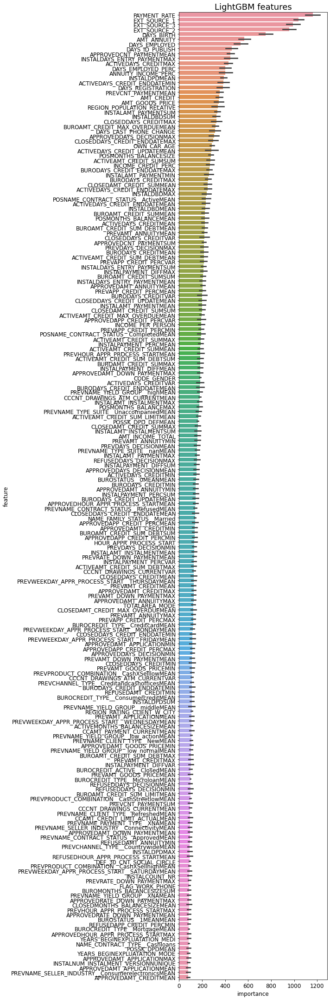

In [413]:
plt.rcParams['figure.figsize'] = [10, 30]
with timer("Run LightGBM with kfold"):
    feat_importance_lgbm, train_df_lgbm, test_df_lgbm = kfold_lightgbm(df_prep, n_folds=10, stratified=True, debug=debug)
%store feat_importance_lgbm
%store train_df_lgbm
%store test_df_lgbm

Starting LightGBM. Train shape: (10000, 796), test shape: (10000, 796)


'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.
'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.


[LightGBM] [Warning] num_threads is set with n_jobs=-1, nthread=4 will be ignored. Current value: num_threads=-1
[200]	training's auc: 0.892267	training's binary_logloss: 0.198368	valid_1's auc: 0.777337	valid_1's binary_logloss: 0.242254
[400]	training's auc: 0.937851	training's binary_logloss: 0.169543	valid_1's auc: 0.77667	valid_1's binary_logloss: 0.242549
Fold  1 AUC : 0.779423


'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.
'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.


[LightGBM] [Warning] num_threads is set with n_jobs=-1, nthread=4 will be ignored. Current value: num_threads=-1
[200]	training's auc: 0.887964	training's binary_logloss: 0.201017	valid_1's auc: 0.793648	valid_1's binary_logloss: 0.230319
[400]	training's auc: 0.935132	training's binary_logloss: 0.172609	valid_1's auc: 0.797263	valid_1's binary_logloss: 0.227362
Fold  2 AUC : 0.799141


'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.
'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.


[LightGBM] [Warning] num_threads is set with n_jobs=-1, nthread=4 will be ignored. Current value: num_threads=-1
[200]	training's auc: 0.890751	training's binary_logloss: 0.199301	valid_1's auc: 0.772026	valid_1's binary_logloss: 0.236376
[400]	training's auc: 0.935649	training's binary_logloss: 0.170422	valid_1's auc: 0.778144	valid_1's binary_logloss: 0.235237
[600]	training's auc: 0.961924	training's binary_logloss: 0.149958	valid_1's auc: 0.774682	valid_1's binary_logloss: 0.236425
Fold  3 AUC : 0.778353


'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.
'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.


[LightGBM] [Warning] num_threads is set with n_jobs=-1, nthread=4 will be ignored. Current value: num_threads=-1
[200]	training's auc: 0.893982	training's binary_logloss: 0.197868	valid_1's auc: 0.761166	valid_1's binary_logloss: 0.239383
Fold  4 AUC : 0.764155


'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.
'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.


[LightGBM] [Warning] num_threads is set with n_jobs=-1, nthread=4 will be ignored. Current value: num_threads=-1
[200]	training's auc: 0.890464	training's binary_logloss: 0.199765	valid_1's auc: 0.764336	valid_1's binary_logloss: 0.236624
Fold  5 AUC : 0.765018


'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.
'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.


[LightGBM] [Warning] num_threads is set with n_jobs=-1, nthread=4 will be ignored. Current value: num_threads=-1
[200]	training's auc: 0.89301	training's binary_logloss: 0.199165	valid_1's auc: 0.76871	valid_1's binary_logloss: 0.235214
[400]	training's auc: 0.938498	training's binary_logloss: 0.170386	valid_1's auc: 0.777603	valid_1's binary_logloss: 0.232444
[600]	training's auc: 0.963505	training's binary_logloss: 0.149534	valid_1's auc: 0.778137	valid_1's binary_logloss: 0.231964
Fold  6 AUC : 0.780093


'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.
'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.


[LightGBM] [Warning] num_threads is set with n_jobs=-1, nthread=4 will be ignored. Current value: num_threads=-1
[200]	training's auc: 0.895332	training's binary_logloss: 0.198188	valid_1's auc: 0.76273	valid_1's binary_logloss: 0.237989
Fold  7 AUC : 0.763870


'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.
'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.


[LightGBM] [Warning] num_threads is set with n_jobs=-1, nthread=4 will be ignored. Current value: num_threads=-1
[200]	training's auc: 0.891889	training's binary_logloss: 0.199124	valid_1's auc: 0.787635	valid_1's binary_logloss: 0.229887
Fold  8 AUC : 0.788268


'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.
'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.


[LightGBM] [Warning] num_threads is set with n_jobs=-1, nthread=4 will be ignored. Current value: num_threads=-1
[200]	training's auc: 0.891106	training's binary_logloss: 0.199018	valid_1's auc: 0.747492	valid_1's binary_logloss: 0.242991
[400]	training's auc: 0.936196	training's binary_logloss: 0.170486	valid_1's auc: 0.753331	valid_1's binary_logloss: 0.242553
Fold  9 AUC : 0.753162


'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.
'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.


[LightGBM] [Warning] num_threads is set with n_jobs=-1, nthread=4 will be ignored. Current value: num_threads=-1
[200]	training's auc: 0.889817	training's binary_logloss: 0.199826	valid_1's auc: 0.767373	valid_1's binary_logloss: 0.235649
[400]	training's auc: 0.93741	training's binary_logloss: 0.170013	valid_1's auc: 0.768851	valid_1's binary_logloss: 0.233832
Fold 10 AUC : 0.772425
Full train AUC score 0.773760
Full test  AUC score 0.774391
Alors, c'est pareil, hein ?
Run LightGBM with kfold - done in 97s
Stored 'feat_importance_lgbm_10000' (DataFrame)
Stored 'train_df_lgbm_10000' (DataFrame)
Stored 'test_df_lgbm_10000' (DataFrame)


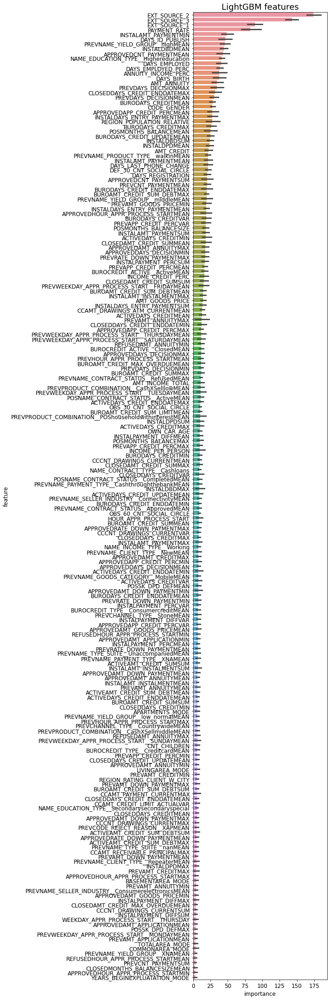

In [415]:
plt.rcParams['figure.figsize'] = [10, 30]
with timer("Run LightGBM with kfold"):
    feat_importance_lgbm_10000, train_df_lgbm_10000, test_df_lgbm_10000 = kfold_lightgbm(df_prep_10000, n_folds=10, stratified=True, debug=debug)
%store feat_importance_lgbm_10000
%store train_df_lgbm_10000
%store test_df_lgbm_10000

Starting LightGBM. Train shape: (3000, 795), test shape: (3000, 795)
[LightGBM] [Warning] num_threads is set with n_jobs=-1, nthread=4 will be ignored. Current value: num_threads=-1


'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.
'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.


[200]	training's auc: 0.855926	training's binary_logloss: 0.218064	valid_1's auc: 0.791365	valid_1's binary_logloss: 0.241841
[400]	training's auc: 0.895058	training's binary_logloss: 0.197198	valid_1's auc: 0.802385	valid_1's binary_logloss: 0.23622
Fold  1 AUC : 0.802385


'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.
'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.


[LightGBM] [Warning] num_threads is set with n_jobs=-1, nthread=4 will be ignored. Current value: num_threads=-1
[200]	training's auc: 0.859796	training's binary_logloss: 0.217978	valid_1's auc: 0.784722	valid_1's binary_logloss: 0.239939
[400]	training's auc: 0.895177	training's binary_logloss: 0.19788	valid_1's auc: 0.80314	valid_1's binary_logloss: 0.234571
Fold  2 AUC : 0.803744


'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.
'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.


[LightGBM] [Warning] num_threads is set with n_jobs=-1, nthread=4 will be ignored. Current value: num_threads=-1
[200]	training's auc: 0.86038	training's binary_logloss: 0.216963	valid_1's auc: 0.75619	valid_1's binary_logloss: 0.251905
Fold  3 AUC : 0.764870


'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.
'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.


[LightGBM] [Warning] num_threads is set with n_jobs=-1, nthread=4 will be ignored. Current value: num_threads=-1
[200]	training's auc: 0.858049	training's binary_logloss: 0.218762	valid_1's auc: 0.793176	valid_1's binary_logloss: 0.237736
[400]	training's auc: 0.892674	training's binary_logloss: 0.19832	valid_1's auc: 0.812953	valid_1's binary_logloss: 0.230908
[600]	training's auc: 0.916056	training's binary_logloss: 0.183622	valid_1's auc: 0.808877	valid_1's binary_logloss: 0.231635
Fold  4 AUC : 0.814614


'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.
'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.


[LightGBM] [Warning] num_threads is set with n_jobs=-1, nthread=4 will be ignored. Current value: num_threads=-1
[200]	training's auc: 0.860244	training's binary_logloss: 0.218652	valid_1's auc: 0.807065	valid_1's binary_logloss: 0.236079
Fold  5 AUC : 0.817029


'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.
'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.


[LightGBM] [Warning] num_threads is set with n_jobs=-1, nthread=4 will be ignored. Current value: num_threads=-1
[200]	training's auc: 0.856857	training's binary_logloss: 0.217742	valid_1's auc: 0.791365	valid_1's binary_logloss: 0.241161
[400]	training's auc: 0.897588	training's binary_logloss: 0.196501	valid_1's auc: 0.799517	valid_1's binary_logloss: 0.236975
Fold  6 AUC : 0.800423


'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.
'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.


[LightGBM] [Warning] num_threads is set with n_jobs=-1, nthread=4 will be ignored. Current value: num_threads=-1
[200]	training's auc: 0.859453	training's binary_logloss: 0.216957	valid_1's auc: 0.744414	valid_1's binary_logloss: 0.252471
Fold  7 AUC : 0.750000


'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.
'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.


[LightGBM] [Warning] num_threads is set with n_jobs=-1, nthread=4 will be ignored. Current value: num_threads=-1
[200]	training's auc: 0.863585	training's binary_logloss: 0.215694	valid_1's auc: 0.659237	valid_1's binary_logloss: 0.258511
[400]	training's auc: 0.8981	training's binary_logloss: 0.196398	valid_1's auc: 0.667242	valid_1's binary_logloss: 0.261248
Fold  8 AUC : 0.662847


'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.
'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.


[LightGBM] [Warning] num_threads is set with n_jobs=-1, nthread=4 will be ignored. Current value: num_threads=-1
[200]	training's auc: 0.858949	training's binary_logloss: 0.217956	valid_1's auc: 0.732695	valid_1's binary_logloss: 0.245524
[400]	training's auc: 0.89476	training's binary_logloss: 0.19624	valid_1's auc: 0.747292	valid_1's binary_logloss: 0.242029
[600]	training's auc: 0.917846	training's binary_logloss: 0.181224	valid_1's auc: 0.743996	valid_1's binary_logloss: 0.241989
Fold  9 AUC : 0.748234


'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.
'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.


[LightGBM] [Warning] num_threads is set with n_jobs=-1, nthread=4 will be ignored. Current value: num_threads=-1
[200]	training's auc: 0.864776	training's binary_logloss: 0.216517	valid_1's auc: 0.730968	valid_1's binary_logloss: 0.244081
Fold 10 AUC : 0.735363
Full train AUC score 0.763960
Full test  AUC score 0.769951
Alors, c'est pareil, hein ?
Run LightGBM with kfold - done in 30s
Stored 'feat_importance_lgbm_3000' (DataFrame)
Stored 'train_df_lgbm_3000' (DataFrame)
Stored 'test_df_lgbm_3000' (DataFrame)


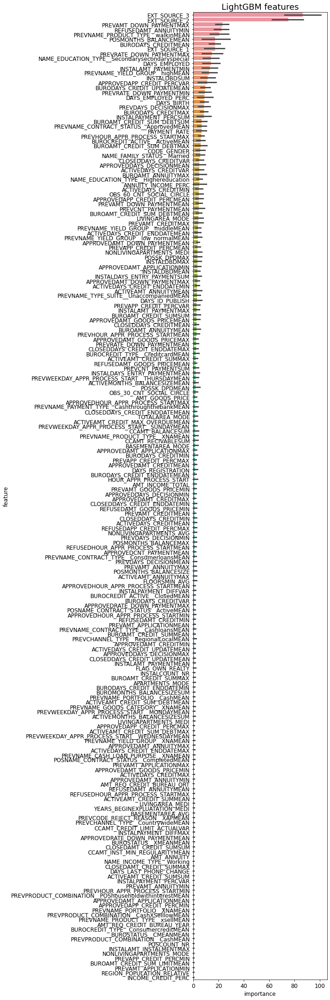

In [414]:
plt.rcParams['figure.figsize'] = [10, 30]
with timer("Run LightGBM with kfold"):
    feat_importance_lgbm_3000, train_df_lgbm_3000, test_df_lgbm_3000 = kfold_lightgbm(df_prep_3000, n_folds=10, stratified=True, debug=debug)
%store feat_importance_lgbm_3000
%store train_df_lgbm_3000
%store test_df_lgbm_3000

## Variables de niveau 2 et 3

In [ ]:
selected_features_file = data_dir+'selected_features.csv'
selected_features = read_feature_selection(selected_features_file, min_level=2)
selected_features.head()

In [ ]:
debug = False
df_prep, cat_cols, num_cols = preprocess(selected_features=selected_features, debug=debug)

In [ ]:
plt.rcParams['figure.figsize'] = [10, 30]
with timer("Run RandomForest"):
    feat_importance_rf, train_df_rf, test_df_rf = kfold_algo(df, cat_cols, num_cols, algo_name='RandomForest', n_folds=5, stratified=True, debug=debug)
# %store feat_importance_rf
# %store train_df_rf
# %store test_df_rf

In [ ]:
plt.rcParams['figure.figsize'] = [10, 30]
with timer("Run XGBoost"):
    feat_importance_xgb, train_df_xgb, test_df_xgb = kfold_algo(df, cat_cols, num_cols, algo_name='XGBoost', n_folds=5, stratified=True, debug=debug)
# %store feat_importance_xgb
# %store train_df_xgb
# %store test_df_xgb

In [ ]:
plt.rcParams['figure.figsize'] = [10, 30]
with timer("Run LightGBM with kfold"):
    feat_importance_lgbm, train_df_lgbm, test_df_lgbm = kfold_lightgbm(df, n_folds=10, stratified=True, debug=debug)
# %store feat_importance_lgbm
# %store train_df_lgbm
# %store test_df_lgbm

## Variables de niveau 3

In [ ]:
selected_features_file = data_dir+'selected_features.csv'
selected_features = read_feature_selection(selected_features_file, min_level=3)
selected_features.head()

In [ ]:
debug = True
df_prep, cat_cols, num_cols = preprocess(selected_features=selected_features, debug=debug, num_rows=10000)

In [ ]:
plt.rcParams['figure.figsize'] = [10, 30]
with timer("Run RandomForest"):
    feat_importance_rf, train_df_rf, test_df_rf = kfold_algo(df, cat_cols, num_cols, algo_name='RandomForest', n_folds=5, stratified=True, debug=debug)
# %store feat_importance_rf
# %store train_df_rf
# %store test_df_rf

In [ ]:
plt.rcParams['figure.figsize'] = [10, 30]
with timer("Run XGBoost"):
    feat_importance_xgb, train_df_xgb, test_df_xgb = kfold_algo(df, cat_cols, num_cols, algo_name='XGBoost', n_folds=5, stratified=True, debug=debug)
# %store feat_importance_xgb
# %store train_df_xgb
# %store test_df_xgb

In [ ]:
train_df_xgb

In [ ]:
plt.rcParams['figure.figsize'] = [10, 30]
with timer("Run LightGBM with kfold"):
    feat_importance_lgbm, train_df_lgbm, test_df_lgbm = kfold_lightgbm(df, n_folds=10, stratified=True, debug=debug)
# %store feat_importance_lgbm
# %store train_df_lgbm
# %store test_df_lgbm

In [ ]:
df_application_train['NAME_TYPE_SUITE'].value_counts()

In [ ]:
plt.rcParams['figure.figsize'] = [10, 2]
display_importances(feature_importance_df_essai, 3)

DCQJC, on a tout à fait le droit d'ajouter les informations provenant des autres tables, et celles que l'on a créées, aux Dataframes train et test.

In [3]:
submission_file_name = "submission_kernel02.csv"

In [4]:
feature_importance_df_lgbm = feature_importance_df

NameError: name 'feature_importance_df' is not defined

In [ ]:
df.shape

In [ ]:
%store feat_importance_lgbm
%store train_df_lgbm
%store test_df_lgbm

In [5]:
%store -r feat_importance_lgbm
%store -r train_df_lgbm
%store -r test_df_lgbm

no stored variable or alias feat_importance_lgbm
no stored variable or alias train_df_lgbm
no stored variable or alias test_df_lgbm


In [6]:
plt.rcParams['figure.figsize'] = [10, 40]
display_importances(feat_importance_lgbm, 200)

NameError: name 'plt' is not defined

In [ ]:
feat_importance = feat_importance_lgbm.copy()

In [ ]:
# for col, val in feat_importance[['feature', 'importance']].values:
fi = feat_importance[["feature", "importance"]].groupby("feature").mean().sort_values(by="importance", ascending=False)
for col, val in zip(fi.index, fi.values):
    if 'NAME_CONTRACT_STATUS' in col: #ACTIVE_, CLOSED_, BURO_
        print(col, val)

In [ ]:
df_POS_CASH_balance['NAME_CONTRACT_STATUS'].value_counts()

In [ ]:
df_bureau

In [ ]:
df_bureau['AMT_CREDIT_SUM']#.value_counts()

On peut par exemple retenir les colonnes jusqu'à `CLOSED_AMT_CREDIT_SUM_MEAN`

# DOE

## Score personnalisé

In [22]:
def custom_metric1(y_true, y_pred, X_train): # needs_proba=True ?
#     TP, FN, FP, TN = confusion_matrix(y_actual, y_pred).ravel().tolist()
#     cost = (60*TP+ 0*FN + 10*FP + 10*TN)/y_actual.size
    # False Positive : on perd le bénéfice du prêt, càd AMT_ANNUITY
    # False Negative : on perd le reste à rembourser, çàd AMT_CREDIT dans le pire des cas
    # True Positive : on gagne le bénéfice du prêt
    # True Negative : on ne perd ni ne gagne rien
#     print(f"X_train.shape AVANT = {X_train.shape}")
    X_work = X_train.loc[y_true.index].copy()
#     print(f"X_work.shape APRES = {X_work.shape}")
#     print(f"y_true.shape APRES = {y_true.shape}")
#     print(f"y_pred.shape APRES = {y_pred.shape}")
#     print(f"X_work.index = {X_work.index}")
#     print(f"y_pred.index = {y_pred.index}")
#     print(f"y_true.index = {y_true.index}")
#     print(f"y_true = {y_true}")
#     print(f"y_pred = {y_pred}")
    selected_TN = (y_pred==0) & (y_true==0)
    
    gain_TN = X_work.loc[selected_TN, 'AMT_ANNUITY'].sum()
    
    selected_FP = (y_pred==1) & (y_true==0)
    gain_FP = X_work.loc[selected_FP, 'AMT_ANNUITY'].sum()
    
    selected_FN = (y_pred==0) & (y_true==1)
    gain_FN = X_work.loc[selected_FN, 'AMT_CREDIT'].sum()
    
    selected_TP = (y_pred==1) & (y_true==1)
    gain_TP = 0. # Normalement, on n'a pas réalisé le prêt
    gain = gain_TN - gain_FP - gain_FN + gain_TP
#     print(f"selected_TN.sum() = {selected_TN.sum()}")
#     print(f"selected_FP.sum() = {selected_FP.sum()}")
#     print(f"selected_FN.sum() = {selected_FN.sum()}")
#     print(f"selected_TP.sum() = {selected_TP.sum()}")
    ai = selected_TN.sum()+selected_FP.sum()+selected_FN.sum()+selected_TP.sum()
    if ai!=y_true.shape: print(f"*** MALHEUR !!! Tus lis indices = {ai}, or y_true.shape = {y_true.shape}")
#     print(f"gain = {gain}")
    return gain

Regarder la "somme" des deux indicateurs, dans le datset
On peut aussi travailler avec des montants moyens, si on n'est pas certain des colonnes

In [23]:
def custom_metric(y_true, y_pred, X_train): # needs_proba=True ?
    # False Positive : on perd le bénéfice du prêt, càd AMT_ANNUITY
    # False Negative : on perd le reste à rembourser, çàd AMT_CREDIT dans le pire des cas
    # True Positive : on gagne le bénéfice du prêt
    # True Negative : on ne perd ni ne gagne rien
    X_work = X_train.loc[y_true.index].copy()
    print(f"y_pred.shape = {y_pred.shape}")
    y_pred = y_pred.reshape(-1,)
    print(f"y_true.shape = {y_true.shape}")
    print(f"y_pred.shape APRES = {y_pred.shape}")
    
    selected_TN = (y_true==0) # (y_pred==0) & 
    selected_FP = (y_true==0) # (y_pred==1) & 
    selected_FN = (y_true==1) # (y_pred==0) & 
    selected_TP = (y_true==1) # (y_pred==1) & 
    
    gain_TN = (1. - y_pred) * X_work.loc[selected_TN, 'AMT_ANNUITY']
    gain_FP = y_pred * X_work.loc[selected_FP, 'AMT_ANNUITY']
    gain_FN = (1. - y_pred) * X_work.loc[selected_FN, 'AMT_CREDIT']
    gain_TP = y_pred * X_work.loc[selected_TP, 'AMT_CREDIT'] # Plus on détecte un vrai positif, plus on gagne la perte qu'on aurait fait
    
    gain = gain_TN.sum() - gain_FP.sum() - gain_FN.sum() + gain_TP.sum()
#     ai = selected_TN.sum()+selected_FP.sum()+selected_FN.sum()+selected_TP.sum()
#     if ai!=y_true.shape: print(f"*** MALHEUR !!! Tus lis indices = {ai}, or y_true.shape = {y_true.shape}")
    print(f"gain = {gain}")
    return gain

In [24]:
def custom_metric_threshold(y_true, y_pred_1, X_train, threshold=0.5):
    """Fonction custom de scoring, calculant un bilan financier en fonction d'un seuil de décision
    et des données d'entraînement.
    
    Parameters
    ----------
    y_true : 1D
        Contient les labels réels
    y_pred_1 : 1D
        Contient les probas de la classe 1
    X_train : pandas.DataFrame
        Dataset servant au calcul du bilan financier.
    threshold : float
        Seuil utilisé pour déclarer la prédiction à la valeur 0.
    """
    # False Positive : on perd le bénéfice du prêt, càd AMT_ANNUITY
    # False Negative : on perd le reste à rembourser, çàd AMT_CREDIT dans le pire des cas
    # True Positive : on gagne le bénéfice du prêt
    # True Negative : on ne perd ni ne gagne rien
    
    X_work = X_train.loc[y_true.index].copy()
#     print(f"y_pred_1.shape = {y_pred_1.shape}")
#     print(f"y_pred_1 = {y_pred_1}")
#     print(f"y_true.shape = {y_true.shape}")
#     print(f"threshold = {threshold}")
    y_pred_0 = 1. - y_pred_1
    is_acceptable = (y_pred_0 >= threshold) # On regarde la probabilité d'un Négatif
    
    selected_TN = (is_acceptable)  & (y_true==0)
    selected_FP = (~is_acceptable) & (y_true==0)
    selected_FN = (is_acceptable)  & (y_true==1)
    selected_TP = (~is_acceptable) & (y_true==1)
    
    gain_TN = X_work.loc[selected_TN, 'AMT_ANNUITY'] * y_pred_0[selected_TN] # On pondère par la proba associée
    gain_FP = 0. * y_pred_0[selected_FP] # X_work.loc[selected_FP, 'AMT_ANNUITY'] * y_pred_0[selected_FP]
    gain_FN = X_work.loc[selected_FN, 'AMT_CREDIT' ] * y_pred_1[selected_FN]
    gain_TP = 0. * y_pred_1[selected_FN] # On ne gagne ni ne perd rien
    
    gain = gain_TN.sum() - gain_FP.sum() - gain_FN.sum() + gain_TP.sum()
#     ai = selected_TN.sum()+selected_FP.sum()+selected_FN.sum()+selected_TP.sum()
#     if ai!=y_true.shape: print(f"*** MALHEUR !!! Tus lis indices = {ai}, or y_true.shape = {y_true.shape}")
#     print(f"gain = {gain}")
    return gain

# custom_score_threshold = make_scorer(custom_metric_threshold, greater_is_better=True, needs_proba=True, X_train=train_df, threshold=0.5)

## Préparation

In [25]:
submission_file_name = "submission_kernel.csv"

In [28]:
selected_features_file = data_dir+'selected_features.csv'
selected_features = read_feature_selection(selected_features_file, min_level=3)
selected_features.head()

,Column1,Table,Row,Traduction description,Non-relaxable,Interet,Commentaire interet,Operations,Description,Special
0,1,application_{train|test}.csv,SK_ID_CURR,ID de pret dans notre echantillon,0,3,NaN,NaN,ID of loan in our sample,NaN
1,2,application_{train|test}.csv,TARGET,Variable cible (1 - Client avec difficultes de...,0,3,NaN,NaN,Target variable (1 - client with payment diffi...,NaN
2,5,application_{train|test}.csv,NAME_CONTRACT_TYPE,Identification si le pret est cash ou revolving,1,3,Revolving = plutet surendettatoire,[mean],Identification if loan is cash or revolving,NaN
3,6,application_{train|test}.csv,CODE_GENDER,Sexe du client,1,3,LGBM2,NaN,Gender of the client,NaN
4,7,application_{train|test}.csv,FLAG_OWN_CAR,Flag Si le client possede une voiture,1,3,NaN,NaN,Flag if the client owns a car,NaN


In [29]:
debug = False
# df_prep, cat_cols, num_cols = preprocess(selected_features=selected_features, debug=debug, num_rows=10000) # selected_features=selected_features
df_prep, cat_cols, num_cols = preprocess(selected_features=selected_features, debug=False) # selected_features=selected_features
train_df = df_prep[df_prep['TARGET'].notnull()]

Train samples: 307511, test samples: 48744
Bureau df shape: (305811, 60)
Process bureau and bureau_balance - done in 11s
Previous applications df shape: (338858, 45)
Process previous_applications - done in 6s
Pos-cash balance df shape: (337252, 4)
Process POS-CASH balance - done in 3s
Installments payments df shape: (339587, 7)
Process installments payments - done in 2s
Credit card balance df shape: (103558, 20)
Process credit card balance - done in 3s


In [ ]:
train_df.shape

In [313]:
for col in train_df.columns:
    print(col)

SK_ID_CURR
TARGET
CODE_GENDER_NR
FLAG_OWN_CAR_NR
FLAG_OWN_REALTY_NR
CNT_CHILDREN_NR
AMT_INCOME_TOTAL
AMT_CREDIT
AMT_ANNUITY
AMT_GOODS_PRICE
REGION_POPULATION_RELATIVE
DAYS_BIRTH
DAYS_EMPLOYED_NR
DAYS_REGISTRATION
DAYS_ID_PUBLISH
OWN_CAR_AGE_NR
FLAG_MOBIL_NR
FLAG_EMP_PHONE_NR
FLAG_WORK_PHONE_NR
FLAG_CONT_MOBILE_NR
FLAG_PHONE_NR
FLAG_EMAIL_NR
CNT_FAM_MEMBERS_NR
REGION_RATING_CLIENT_NR
REGION_RATING_CLIENT_W_CITY_NR
HOUR_APPR_PROCESS_START_NR
REG_REGION_NOT_LIVE_REGION_NR
REG_REGION_NOT_WORK_REGION_NR
LIVE_REGION_NOT_WORK_REGION_NR
REG_CITY_NOT_LIVE_CITY_NR
REG_CITY_NOT_WORK_CITY_NR
LIVE_CITY_NOT_WORK_CITY_NR
EXT_SOURCE_1
EXT_SOURCE_2
EXT_SOURCE_3
APARTMENTS_AVG
BASEMENTAREA_AVG
YEARS_BEGINEXPLUATATION_AVG
YEARS_BUILD_AVG
COMMONAREA_AVG
ELEVATORS_AVG
ENTRANCES_AVG
FLOORSMAX_AVG
FLOORSMIN_AVG
LANDAREA_AVG
LIVINGAPARTMENTS_AVG
LIVINGAREA_AVG
NONLIVINGAPARTMENTS_AVG
NONLIVINGAREA_AVG
APARTMENTS_MODE
BASEMENTAREA_MODE
YEARS_BEGINEXPLUATATION_MODE
YEARS_BUILD_MODE
COMMONAREA_MODE
ELEVATORS_MOD

0.0    90
1.0    10
Name: TARGET, dtype: int64


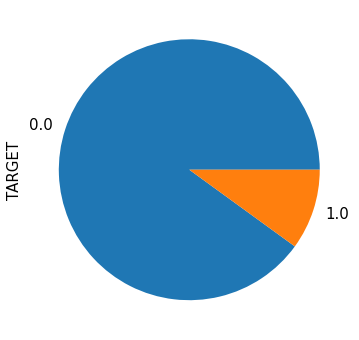

In [87]:
mini_train_df = train_df.sample(n=100, random_state=18011975)
print(mini_train_df['TARGET'].value_counts())
mini_train_df['TARGET'].value_counts().plot(kind='pie')

In [89]:
y = train_df['TARGET']

In [90]:
counter = Counter(y)
weight = counter[0] / counter[1]
weight

11.658227848101266

### Algorithmes

In [30]:
problem_kind = 'classification'
target_col = 'TARGET'

In [31]:
scalers = [StandardScaler] # StandardScaler, MinMaxScaler, QuantileTransformer(output_distribution='uniform') ?
# encoders = [OneHotEncoder(sparse=False,handle_unknown='ignore')]
encoders = [[]]

In [32]:
# Dictionnaires d'hyperparamètres
param_grid_dum = {}

# param_grid_knn  = {'n_neighbors': range(1, 51)}
# param_grid_svc = {'C': np.logspace(-3, 3, 10)}

weights = np.linspace(0.05, 0.95, 20)
param_grid_lr = {
    'class_weight': [None, 'balanced'], #, {0: x, 1: 1.0-x} for x in weights
    'C': [0.0001, 0.001, 0.01],
    'dual': [False],
    'fit_intercept': [True],
    'intercept_scaling': [1],
    'max_iter': [1000],
    'multi_class': ['ovr'],
    'penalty': ['l2'],
    'random_state': [None],
    'solver': ['liblinear'], 'n_jobs': [1], # n_jobs=1 pour liblinear
    'tol': [0.0001],
    'warm_start': [False],
    'random_state': [18011975],
}

param_grid_xgbc = {
#     'scale_pos_weight': [weight],
    'n_estimators': [200, 500],  #[1000], #[20, 50, 100, 200], #[500, 1000, 10000] # 500 mieux que 1000
    'learning_rate': [0.05],  # [0.01, 0.05, 0.1, 0.3],
    'max_depth': [5],
    'colsample_bytree': [0.8],  # [0.5, 1.],
#     'subsample': [0.5, 0.7, 1.],
#     'gamma': [1., 5., 10.],
#     'min_child_weight': [5., 7.],
#     'colsample_bytree':
#     'max_depth': [1, 3, 6],
#     'alpha': [1., 100., 200.],
    'nthread': [10],
    'random_state': [18011975],
}

param_grid_lgbc = {
    'nthread': [4],
    'n_estimators': [10000],
    'learning_rate': [0.02],
    'num_leaves': [34],
    'colsample_bytree': [0.9497036],
    'subsample': [0.8715623],
    'max_depth': [8],
    'reg_alpha': [0.041545473],
    'reg_lambda': [0.0735294],
    'min_split_gain': [0.0222415],
    'min_child_weight': [39.3259775],
    'verbose': [-1],
    'random_state': [18011975],
#     'silent': [-1],
}

param_grid_rfc = {
    'n_estimators': [200, 500], #[20, 50, 100, 200]
    'max_depth': [None, 2], #[None, 1, 2, 5],
    'min_samples_split': [2, 5], #[2, 5, 10],
    'random_state': [18011975],
}

In [33]:
algos_clf = [
#     {'surname': 'Dummy stratified',
#      'class': DummyClassifier(strategy='stratified'),
#      'param_grid': param_grid_dum},
#     {'surname': 'SVC', # utilise un OVO, histoire de comparer
#      'class': SVC(kernel='linear'),
#      'param_grid': param_grid_svc},
#     {'surname': 'kNN',
#      'class': KNeighborsClassifier(),
#      'param_grid': param_grid_knn},
    
#     {'surname': 'Logistic',
#      'class': LogisticRegression(verbose=0), # class_weight='balanced'
#      'param_grid': param_grid_lr},
    {'surname': 'XGBoost', # ne fonctionne pas car trop peu de samples pour certaines classes
    'class': XGBClassifier(), # 
    'param_grid': param_grid_xgbc},
#     {'surname': 'LightGBM',
#      'class': LGBMClassifier(), # class_weight={0:1, 1:10}
#      'param_grid': param_grid_lgbc},
#     {'surname': 'RandomForest',
#      'class': RandomForestClassifier(), # class_weight={0:1, 1:10}
#      'param_grid': param_grid_rfc},
]

### Scores et seuils

In [34]:
scores = ['roc_auc'] # ['roc_auc', 'precision', 'recall', 'f1']

In [35]:
custom_score1 = make_scorer(custom_metric1, greater_is_better=True, X_train=train_df)

In [36]:
custom_score = make_scorer(custom_metric, greater_is_better=True, X_train=train_df, needs_proba=True)

In [37]:
scoring_data = [
    {'score_function': custom_metric_threshold,
     'greater_is_better': True,
     'needs_proba': True,
     'score_params': {'X_train': train_df,
                      'threshold': 0.51}},
]

In [38]:
scoring_data = [
    {'score_function': custom_metric_threshold,
     'greater_is_better': True,
     'needs_proba': True,
     'score_params': {'X_train': train_df,
                      'threshold': 0.51}},
    {'score_function': custom_metric_threshold,
     'greater_is_better': True,
     'needs_proba': True,
     'score_params': {'X_train': train_df,
                      'threshold': 0.80}},
    {'score_function': custom_metric_threshold,
     'greater_is_better': True,
     'needs_proba': True,
     'score_params': {'X_train': train_df,
                      'threshold': 0.95}},
    {'score_function': custom_metric_threshold,
     'greater_is_better': True,
     'needs_proba': True,
     'score_params': {'X_train': train_df,
                      'threshold': 0.99}},
]

### Variables sélectionnées

In [39]:
models_cols = [
    {'categ_cols':[], # Tout est déjà encodé
     'num_cols'  :[f for f in train_df.columns if f not in ['TARGET','SK_ID_CURR','SK_ID_BUREAU','SK_ID_PREV','index']],
    },
]

In [40]:
chosen_models_cols = models_cols #[5:6]# [2:6:3]

In [41]:
doe = list(itertools.product(algos_clf, encoders, scalers, chosen_models_cols))
columns = ['Algorithm', 'Encoder', 'Scaler', 'Variables']
# doe = list(itertools.product(algos_clf, encoders, scalers, chosen_models_cols, scoring_data))
# columns = ['Algorithm', 'Encoder', 'Scaler', 'Variables', 'Scoring data']
df_doe = pd.DataFrame(data=doe, columns=columns)
df_doe_init = df_doe.copy()

In [42]:
df_doe_init

,Algorithm,Encoder,Scaler,Variables
0,"{'surname': 'XGBoost', 'class': XGBClassifier(...",[],<class 'sklearn.preprocessing._data.StandardSc...,"{'categ_cols': [], 'num_cols': ['CODE_GENDER_N..."


## Lancement

In [43]:
##################
# Pour DEBUG
##################
print(train_df.shape)
df_doe_all, algos_results_all, s, best_mdl, best_mdl_name = \
        MLstuff.classification_doe(train_df, df_doe_init,
                                   target_col, problem_kind,
                                   scores,
                                   oversampling=False, undersampling=False,
                                   predict_proba=True, class_to_predict=1,
                                   encode_y=False)
df_doe_all

(307507, 275)
Taille du dataset de classification  : (307507, 275)
Taille du dataset d'entrainement : (246005, 273)
preprocess_X: steps = [('imputer', SimpleImputer()), ('scaler', StandardScaler())]
preprocess_X: preprocessor = ColumnTransformer(transformers=[('numerical',
                                 Pipeline(steps=[('imputer', SimpleImputer()),
                                                 ('scaler', StandardScaler())]),
                                 ['CODE_GENDER_NR', 'FLAG_OWN_CAR_NR',
                                  'FLAG_OWN_REALTY_NR', 'AMT_INCOME_TOTAL',
                                  'AMT_CREDIT', 'AMT_ANNUITY',
                                  'AMT_GOODS_PRICE', 'DAYS_BIRTH',
                                  'DAYS_EMPLOYED', 'CNT_FAM_MEMBERS_NR',
                                  'HOUR_APPR_PROCESS_START_NR', 'EXT_SOURCE_2',
                                  'EXT_SOURCE_3', '...
                                  'NAME_TYPE_SUITE__Spouse, partner_NR',
        

,Algorithm,Encoder,Scaler,Variables,Best params,Scoring,Train roc_auc,Train relative roc_auc,Test roc_auc,Test relative roc_auc,Elapsed time
0,"{'surname': 'XGBoost', 'class': XGBClassifier(...",[],<class 'sklearn.preprocessing._data.StandardSc...,"{'categ_cols': [], 'num_cols': ['CODE_GENDER_N...","{'model__colsample_bytree': 0.8, 'model__learn...",roc_auc,0.841414,N/A,0.782245,N/A,4628.296311


In [44]:
# df_doe_all = df_doe.copy()
# algos_results_10000 = copy.deepcopy(algos_results)
%store df_doe_all
%store algos_results_all

Stored 'df_doe_all' (DataFrame)
Stored 'algos_results_all' (list)


### Old

In [374]:
##################
# AVEC Under sur TOUS les samples
##################
print(train_df.shape)
df_doe_under, algos_results, s, best_mdl, best_mdl_name = \
        MLstuff.classification_doe(train_df, df_doe_init,
                                   target_col, problem_kind,
                                   scores,
                                   oversampling=False, undersampling=True,
                                   predict_proba=True, class_to_predict=1,
                                   encode_y=False)
df_doe_under

(307507, 798)
Taille du dataset de classification  : (307507, 798)
Taille du dataset d'entrainement : (246005, 795)

Algorithme XGBoost :
--------------------

y_train.value_counts() = 0.0    226145
1.0     19860
Name: TARGET, dtype: int64
Resampling dataset...
Dataset resampled.
y_train_temp.value_counts() = 0.0    19860
1.0    19860
Name: TARGET, dtype: int64
+++ AVEC over/undersampling
y_train_pred = [0.66030395 0.32995987 0.36031687 ... 0.3775693  0.49527505 0.2308332 ]
roc_auc
Meilleurs hyperparamètres sur le jeu d'entraînement : {'model__colsample_bytree': 0.8, 'model__learning_rate': 0.05, 'model__max_depth': 5, 'model__n_estimators': 1000, 'model__nthread': 8, 'model__random_state': 18011975}. Score (val) : 7.776e-01
4: 0
{'model__colsample_bytree': 0.8, 'model__learning_rate': 0.05, 'model__max_depth': 5, 'model__n_estimators': 1000, 'model__nthread': 8, 'model__random_state': 18011975}

Et le César du meilleur algorithme est attribué à : XGBoost
pour son rôle dans            

,Algorithm,Encoder,Scaler,Variables,Best params,Scoring,Train roc_auc,Train relative roc_auc,Test roc_auc,Test relative roc_auc,Elapsed time
0,"{'surname': 'XGBoost', 'class': XGBClassifier(...",[],<class 'sklearn.preprocessing._data.StandardSc...,"{'categ_cols': [], 'num_cols': ['CODE_GENDER',...","{'model__colsample_bytree': 0.8, 'model__learn...",roc_auc,0.793546,N/A,0.712801,N/A,1796.812235


In [375]:
df_doe_all_under_roc = df_doe_under.copy()
algos_results_all_roc = copy.deepcopy(algos_results)
%store df_doe_all_under_roc
%store algos_results_all_roc

Stored 'df_doe_all_under_roc' (DataFrame)
Stored 'algos_results_all_roc' (list)


In [ ]:
##################
# SANS Under sur TOUS les samples, mais vraiment tous
##################
print(train_df.shape)
df_doe, algos_results, s, best_mdl, best_mdl_name = \
        MLstuff.classification_doe(train_df, df_doe_init,
                                   target_col, problem_kind,
                                   scores,
                                   oversampling=False, undersampling=False,
                                   predict_proba=True, class_to_predict=1,
                                   encode_y=False)
df_doe

(307507, 798)
Taille du dataset de classification  : (307507, 798)
Taille du dataset d'entrainement : (246005, 795)

Algorithme XGBoost :
--------------------

y_train.value_counts() = 0.0    226145
1.0     19860
Name: TARGET, dtype: int64
--- SANS over/undersampling


In [ ]:
df_doe_all_roc = df_doe.copy()
algos_results_all_roc = copy.deepcopy(algos_results)
%store df_doe_all_roc
%store algos_results_all_roc

In [391]:
df_doe_all_roc

,Algorithm,Encoder,Scaler,Variables,Best params,Scoring,Train roc_auc,Train relative roc_auc,Test roc_auc,Test relative roc_auc,Elapsed time
0,"{'surname': 'XGBoost', 'class': XGBClassifier(...",[],<class 'sklearn.preprocessing._data.StandardSc...,"{'categ_cols': [], 'num_cols': ['CODE_GENDER',...","{'model__colsample_bytree': 0.8, 'model__learn...",roc_auc,0.559721,N/A,0.52345,N/A,12239.54724


In [299]:
df_doe_all_cs

,Algorithm,Encoder,Scaler,Variables,Scoring data,Best params,Scoring,Train custom_score,Test custom_score,Train roc_auc,Train relative roc_auc,Test roc_auc,Test relative roc_auc,Elapsed time
0,"{'surname': 'XGBoost', 'class': XGBClassifier(...",[],<class 'sklearn.preprocessing._data.StandardSc...,"{'categ_cols': [], 'num_cols': ['CODE_GENDER_N...",{'score_function': <function custom_metric_thr...,"{'model__colsample_bytree': 0.8, 'model__learn...",roc_auc,2.728798e+09,5.203714e+08,0.793453,N/A,0.711198,N/A,1652.576373


In [419]:
train_df_xgb_3000

,index,SK_ID_CURR,TARGET,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,...,CC%CNT_DRAWINGS_ATM_CURRENT#MAX,CC%CNT_DRAWINGS_ATM_CURRENT#MEAN,CC%CNT_DRAWINGS_ATM_CURRENT#SUM,CC%CNT_DRAWINGS_ATM_CURRENT#VAR,CC%CNT_DRAWINGS_CURRENT#MIN,CC%CNT_DRAWINGS_CURRENT#MAX,CC%CNT_DRAWINGS_CURRENT#MEAN,CC%CNT_DRAWINGS_CURRENT#SUM,CC%CNT_DRAWINGS_CURRENT#VAR,CC%CNT_DRAWINGS_OTHER_CURRENT#MIN,CC%CNT_DRAWINGS_OTHER_CURRENT#MAX,CC%CNT_DRAWINGS_OTHER_CURRENT#MEAN,CC%CNT_DRAWINGS_OTHER_CURRENT#SUM,CC%CNT_DRAWINGS_OTHER_CURRENT#VAR,CC%CNT_DRAWINGS_POS_CURRENT#MIN,CC%CNT_DRAWINGS_POS_CURRENT#MAX,CC%CNT_DRAWINGS_POS_CURRENT#MEAN,CC%CNT_DRAWINGS_POS_CURRENT#SUM,CC%CNT_DRAWINGS_POS_CURRENT#VAR,CC%CNT_INSTALMENT_MATURE_CUM#MIN,CC%CNT_INSTALMENT_MATURE_CUM#MAX,CC%CNT_INSTALMENT_MATURE_CUM#MEAN,CC%CNT_INSTALMENT_MATURE_CUM#SUM,CC%CNT_INSTALMENT_MATURE_CUM#VAR,CC%SK_DPD#MIN,CC%SK_DPD#MAX,CC%SK_DPD#MEAN,CC%SK_DPD#SUM,CC%SK_DPD#VAR,CC%SK_DPD_DEF#MIN,CC%SK_DPD_DEF#MAX,CC%SK_DPD_DEF#MEAN,CC%SK_DPD_DEF#SUM,CC%SK_DPD_DEF#VAR,CC%NAME_CONTRACT_STATUS__Active#MIN,CC%NAME_CONTRACT_STATUS__Active#MAX,CC%NAME_CONTRACT_STATUS__Active#MEAN,CC%NAME_CONTRACT_STATUS__Active#SUM,CC%NAME_CONTRACT_STATUS__Active#VAR,CC%NAME_CONTRACT_STATUS__Approved#MIN,CC%NAME_CONTRACT_STATUS__Approved#MAX,CC%NAME_CONTRACT_STATUS__Approved#MEAN,CC%NAME_CONTRACT_STATUS__Approved#SUM,CC%NAME_CONTRACT_STATUS__Approved#VAR,CC%NAME_CONTRACT_STATUS__Completed#MIN,CC%NAME_CONTRACT_STATUS__Completed#MAX,CC%NAME_CONTRACT_STATUS__Completed#MEAN,CC%NAME_CONTRACT_STATUS__Completed#SUM,CC%NAME_CONTRACT_STATUS__Completed#VAR,CC%NAME_CONTRACT_STATUS__Demand#MIN,CC%NAME_CONTRACT_STATUS__Demand#MAX,CC%NAME_CONTRACT_STATUS__Demand#MEAN,CC%NAME_CONTRACT_STATUS__Demand#SUM,CC%NAME_CONTRACT_STATUS__Demand#VAR,CC%NAME_CONTRACT_STATUS__Refused#MIN,CC%NAME_CONTRACT_STATUS__Refused#MAX,CC%NAME_CONTRACT_STATUS__Refused#MEAN,CC%NAME_CONTRACT_STATUS__Refused#SUM,CC%NAME_CONTRACT_STATUS__Refused#VAR,CC%NAME_CONTRACT_STATUS__Sent proposal#MIN,CC%NAME_CONTRACT_STATUS__Sent proposal#MAX,CC%NAME_CONTRACT_STATUS__Sent proposal#MEAN,CC%NAME_CONTRACT_STATUS__Sent proposal#SUM,CC%NAME_CONTRACT_STATUS__Sent proposal#VAR,CC%NAME_CONTRACT_STATUS__Signed#MIN,CC%NAME_CONTRACT_STATUS__Signed#MAX,CC%NAME_CONTRACT_STATUS__Signed#MEAN,CC%NAME_CONTRACT_STATUS__Signed#SUM,CC%NAME_CONTRACT_STATUS__Signed#VAR,CC%NAME_CONTRACT_STATUS__nan#MIN,CC%NAME_CONTRACT_STATUS__nan#MAX,CC%NAME_CONTRACT_STATUS__nan#MEAN,CC%NAME_CONTRACT_STATUS__nan#SUM,CC%NAME_CONTRACT_STATUS__nan#VAR,CC%COUNT_NR
0,0,100002,1.0,0,0,0,0,202500.0,406597.5,24700.5,351000.0,0.018801,-9461,-637.0,-3648.0,-2120,NaN,1,1,0,1,1,0,1.0,2,2,10,0,0,0,0,0,0,0.083037,0.262949,0.139376,0.0247,0.0369,0.9722,0.6192,0.0143,0.00,0.0690,0.0833,0.1250,0.0369,0.0202,0.0190,0.0000,0.0000,0.0252,0.0383,0.9722,0.6

In [ ]:
##################
# AVEC Under
##################
print(train_df.shape)
df_doe, algos_results, s, best_mdl, best_mdl_name = \
        MLstuff.classification_doe(train_df, df_doe_init,
                                   target_col, problem_kind,
                                   scores,
                                   oversampling=False, undersampling=True,
                                   predict_proba=True, class_to_predict=1,
                                   encode_y=False)
df_doe

(49998, 254)
Taille du dataset de classification  : (49998, 254)
Taille du dataset d'entrainement : (39998, 249)

Algorithme Logistic :
---------------------

y_train.value_counts() = 0.0    36777
1.0     3221
Name: TARGET, dtype: int64
Resampling dataset...
Dataset resampled.
y_train_temp.value_counts() = 0.0    3221
1.0    3221
Name: TARGET, dtype: int64
+++ AVEC over/undersampling
y_train_pred = [0.12355924 0.12208113 0.25389789 ... 0.30993761 0.79885249 0.18589507]
roc_auc
Meilleurs hyperparamètres sur le jeu d'entraînement : {'model__C': 0.01, 'model__class_weight': None, 'model__dual': False, 'model__fit_intercept': True, 'model__intercept_scaling': 1, 'model__max_iter': 1000, 'model__multi_class': 'ovr', 'model__n_jobs': 1, 'model__penalty': 'l2', 'model__random_state': 18011975, 'model__solver': 'liblinear', 'model__tol': 0.0001, 'model__warm_start': False}. Score (val) : 3.265e+07
4: 0
{'model__C': 0.01, 'model__class_weight': None, 'model__dual': False, 'model__fit_intercept'

Taille du dataset d'entrainement : (39998, 249)

Algorithme Logistic :
---------------------

y_train.value_counts() = 0.0    36777
1.0     3221
Name: TARGET, dtype: int64
Resampling dataset...
Dataset resampled.
y_train_temp.value_counts() = 0.0    3221
1.0    3221
Name: TARGET, dtype: int64
+++ AVEC over/undersampling
y_train_pred = [0.12355924 0.12208113 0.25389789 ... 0.30993761 0.79885249 0.18589507]
roc_auc
Meilleurs hyperparamètres sur le jeu d'entraînement : {'model__C': 0.01, 'model__class_weight': None, 'model__dual': False, 'model__fit_intercept': True, 'model__intercept_scaling': 1, 'model__max_iter': 1000, 'model__multi_class': 'ovr', 'model__n_jobs': 1, 'model__penalty': 'l2', 'model__random_state': 18011975, 'model__solver': 'liblinear', 'model__tol': 0.0001, 'model__warm_start': False}. Score (val) : 2.380e+07
4: 7
{'model__C': 0.01, 'model__class_weight': None, 'model__dual': False, 'model__fit_intercept': True, 'model__intercept_scaling': 1, 'model__max_iter': 1000, '

Taille du dataset d'entrainement : (39998, 249)

Algorithme Logistic :
---------------------

y_train.value_counts() = 0.0    36777
1.0     3221
Name: TARGET, dtype: int64
Resampling dataset...
Dataset resampled.
y_train_temp.value_counts() = 0.0    3221
1.0    3221
Name: TARGET, dtype: int64
+++ AVEC over/undersampling
y_train_pred = [0.12355924 0.12208113 0.25389789 ... 0.30993761 0.79885249 0.18589507]
roc_auc
Meilleurs hyperparamètres sur le jeu d'entraînement : {'model__C': 0.01, 'model__class_weight': None, 'model__dual': False, 'model__fit_intercept': True, 'model__intercept_scaling': 1, 'model__max_iter': 1000, 'model__multi_class': 'ovr', 'model__n_jobs': 1, 'model__penalty': 'l2', 'model__random_state': 18011975, 'model__solver': 'liblinear', 'model__tol': 0.0001, 'model__warm_start': False}. Score (val) : 6.026e+06
4: 14
{'model__C': 0.01, 'model__class_weight': None, 'model__dual': False, 'model__fit_intercept': True, 'model__intercept_scaling': 1, 'model__max_iter': 1000, 

Taille du dataset d'entrainement : (39998, 249)

Algorithme Logistic :
---------------------

y_train.value_counts() = 0.0    36777
1.0     3221
Name: TARGET, dtype: int64
Resampling dataset...
Dataset resampled.
y_train_temp.value_counts() = 0.0    3221
1.0    3221
Name: TARGET, dtype: int64
+++ AVEC over/undersampling
y_train_pred = [0.12355924 0.12208113 0.25389789 ... 0.30993761 0.79885249 0.18589507]
roc_auc
Meilleurs hyperparamètres sur le jeu d'entraînement : {'model__C': 0.01, 'model__class_weight': None, 'model__dual': False, 'model__fit_intercept': True, 'model__intercept_scaling': 1, 'model__max_iter': 1000, 'model__multi_class': 'ovr', 'model__n_jobs': 1, 'model__penalty': 'l2', 'model__random_state': 18011975, 'model__solver': 'liblinear', 'model__tol': 0.0001, 'model__warm_start': False}. Score (val) : -2.044e+07
4: 21
{'model__C': 0.01, 'model__class_weight': None, 'model__dual': False, 'model__fit_intercept': True, 'model__intercept_scaling': 1, 'model__max_iter': 1000,


Algorithme Logistic :
---------------------

y_train.value_counts() = 0.0    36777
1.0     3221
Name: TARGET, dtype: int64
Resampling dataset...
Dataset resampled.
y_train_temp.value_counts() = 0.0    3221
1.0    3221
Name: TARGET, dtype: int64
+++ AVEC over/undersampling
y_train_pred = [0.12355924 0.12208113 0.25389789 ... 0.30993761 0.79885249 0.18589507]
roc_auc
Meilleurs hyperparamètres sur le jeu d'entraînement : {'model__C': 0.01, 'model__class_weight': None, 'model__dual': False, 'model__fit_intercept': True, 'model__intercept_scaling': 1, 'model__max_iter': 1000, 'model__multi_class': 'ovr', 'model__n_jobs': 1, 'model__penalty': 'l2', 'model__random_state': 18011975, 'model__solver': 'liblinear', 'model__tol': 0.0001, 'model__warm_start': False}. Score (val) : -5.488e+07
4: 28
{'model__C': 0.01, 'model__class_weight': None, 'model__dual': False, 'model__fit_intercept': True, 'model__intercept_scaling': 1, 'model__max_iter': 1000, 'model__multi_class': 'ovr', 'model__n_jobs': 1

Taille du dataset d'entrainement : (39998, 249)

Algorithme Logistic :
---------------------

y_train.value_counts() = 0.0    36777
1.0     3221
Name: TARGET, dtype: int64
Resampling dataset...
Dataset resampled.
y_train_temp.value_counts() = 0.0    3221
1.0    3221
Name: TARGET, dtype: int64
+++ AVEC over/undersampling
y_train_pred = [0.12355924 0.12208113 0.25389789 ... 0.30993761 0.79885249 0.18589507]
roc_auc
Meilleurs hyperparamètres sur le jeu d'entraînement : {'model__C': 0.01, 'model__class_weight': None, 'model__dual': False, 'model__fit_intercept': True, 'model__intercept_scaling': 1, 'model__max_iter': 1000, 'model__multi_class': 'ovr', 'model__n_jobs': 1, 'model__penalty': 'l2', 'model__random_state': 18011975, 'model__solver': 'liblinear', 'model__tol': 0.0001, 'model__warm_start': False}. Score (val) : -9.018e+07
4: 35
{'model__C': 0.01, 'model__class_weight': None, 'model__dual': False, 'model__fit_intercept': True, 'model__intercept_scaling': 1, 'model__max_iter': 1000,

Taille du dataset d'entrainement : (39998, 249)

Algorithme Logistic :
---------------------

y_train.value_counts() = 0.0    36777
1.0     3221
Name: TARGET, dtype: int64
Resampling dataset...
Dataset resampled.
y_train_temp.value_counts() = 0.0    3221
1.0    3221
Name: TARGET, dtype: int64
+++ AVEC over/undersampling
y_train_pred = [0.39019776 0.39162596 0.50764188 ... 0.49243775 0.55883369 0.41010401]
roc_auc
Meilleurs hyperparamètres sur le jeu d'entraînement : {'model__C': 0.0001, 'model__class_weight': None, 'model__dual': False, 'model__fit_intercept': True, 'model__intercept_scaling': 1, 'model__max_iter': 1000, 'model__multi_class': 'ovr', 'model__n_jobs': 1, 'model__penalty': 'l2', 'model__random_state': 18011975, 'model__solver': 'liblinear', 'model__tol': 0.0001, 'model__warm_start': False}. Score (val) : -1.023e+08
4: 42
{'model__C': 0.0001, 'model__class_weight': None, 'model__dual': False, 'model__fit_intercept': True, 'model__intercept_scaling': 1, 'model__max_iter': 1


Algorithme Logistic :
---------------------

y_train.value_counts() = 0.0    36777
1.0     3221
Name: TARGET, dtype: int64
Resampling dataset...
Dataset resampled.
y_train_temp.value_counts() = 0.0    3221
1.0    3221
Name: TARGET, dtype: int64
+++ AVEC over/undersampling
y_train_pred = [0.39019776 0.39162596 0.50764188 ... 0.49243775 0.55883369 0.41010401]
roc_auc
Meilleurs hyperparamètres sur le jeu d'entraînement : {'model__C': 0.0001, 'model__class_weight': None, 'model__dual': False, 'model__fit_intercept': True, 'model__intercept_scaling': 1, 'model__max_iter': 1000, 'model__multi_class': 'ovr', 'model__n_jobs': 1, 'model__penalty': 'l2', 'model__random_state': 18011975, 'model__solver': 'liblinear', 'model__tol': 0.0001, 'model__warm_start': False}. Score (val) : -1.023e+08
4: 49
{'model__C': 0.0001, 'model__class_weight': None, 'model__dual': False, 'model__fit_intercept': True, 'model__intercept_scaling': 1, 'model__max_iter': 1000, 'model__multi_class': 'ovr', 'model__n_jobs

y_train_pred = [0.125114   0.06030715 0.06621223 ... 0.3843629  0.9346913  0.2480139 ]
roc_auc
Meilleurs hyperparamètres sur le jeu d'entraînement : {'model__colsample_bytree': 0.8, 'model__learning_rate': 0.05, 'model__max_depth': 5, 'model__n_estimators': 1000, 'model__nthread': 10, 'model__random_state': 18011975}. Score (val) : 5.181e+07
4: 58
{'model__colsample_bytree': 0.8, 'model__learning_rate': 0.05, 'model__max_depth': 5, 'model__n_estimators': 1000, 'model__nthread': 10, 'model__random_state': 18011975}
Taille du dataset d'entrainement : (39998, 249)

Algorithme XGBoost :
--------------------

y_train.value_counts() = 0.0    36777
1.0     3221
Name: TARGET, dtype: int64
Resampling dataset...
Dataset resampled.
y_train_temp.value_counts() = 0.0    3221
1.0    3221
Name: TARGET, dtype: int64
+++ AVEC over/undersampling
y_train_pred = [0.125114   0.06030715 0.06621223 ... 0.3843629  0.9346913  0.2480139 ]
roc_auc
Meilleurs hyperparamètres sur le jeu d'entraînement : {'model__co

Taille du dataset d'entrainement : (39998, 249)

Algorithme XGBoost :
--------------------

y_train.value_counts() = 0.0    36777
1.0     3221
Name: TARGET, dtype: int64
Resampling dataset...
Dataset resampled.
y_train_temp.value_counts() = 0.0    3221
1.0    3221
Name: TARGET, dtype: int64
+++ AVEC over/undersampling
y_train_pred = [0.125114   0.06030715 0.06621223 ... 0.3843629  0.9346913  0.2480139 ]
roc_auc
Meilleurs hyperparamètres sur le jeu d'entraînement : {'model__colsample_bytree': 0.8, 'model__learning_rate': 0.05, 'model__max_depth': 5, 'model__n_estimators': 1000, 'model__nthread': 10, 'model__random_state': 18011975}. Score (val) : 3.637e+07
4: 68
{'model__colsample_bytree': 0.8, 'model__learning_rate': 0.05, 'model__max_depth': 5, 'model__n_estimators': 1000, 'model__nthread': 10, 'model__random_state': 18011975}
Taille du dataset d'entrainement : (39998, 249)

Algorithme XGBoost :
--------------------

y_train.value_counts() = 0.0    36777
1.0     3221
Name: TARGET, dty

Taille du dataset d'entrainement : (39998, 249)

Algorithme XGBoost :
--------------------

y_train.value_counts() = 0.0    36777
1.0     3221
Name: TARGET, dtype: int64
Resampling dataset...
Dataset resampled.
y_train_temp.value_counts() = 0.0    3221
1.0    3221
Name: TARGET, dtype: int64
+++ AVEC over/undersampling
y_train_pred = [0.125114   0.06030715 0.06621223 ... 0.3843629  0.9346913  0.2480139 ]
roc_auc
Meilleurs hyperparamètres sur le jeu d'entraînement : {'model__colsample_bytree': 0.8, 'model__learning_rate': 0.05, 'model__max_depth': 5, 'model__n_estimators': 1000, 'model__nthread': 10, 'model__random_state': 18011975}. Score (val) : 6.043e+06
4: 78
{'model__colsample_bytree': 0.8, 'model__learning_rate': 0.05, 'model__max_depth': 5, 'model__n_estimators': 1000, 'model__nthread': 10, 'model__random_state': 18011975}
Taille du dataset d'entrainement : (39998, 249)

Algorithme XGBoost :
--------------------

y_train.value_counts() = 0.0    36777
1.0     3221
Name: TARGET, dty

Taille du dataset d'entrainement : (39998, 249)

Algorithme XGBoost :
--------------------

y_train.value_counts() = 0.0    36777
1.0     3221
Name: TARGET, dtype: int64
Resampling dataset...
Dataset resampled.
y_train_temp.value_counts() = 0.0    3221
1.0    3221
Name: TARGET, dtype: int64
+++ AVEC over/undersampling
y_train_pred = [0.125114   0.06030715 0.06621223 ... 0.3843629  0.9346913  0.2480139 ]
roc_auc
Meilleurs hyperparamètres sur le jeu d'entraînement : {'model__colsample_bytree': 0.8, 'model__learning_rate': 0.05, 'model__max_depth': 5, 'model__n_estimators': 1000, 'model__nthread': 10, 'model__random_state': 18011975}. Score (val) : -4.508e+07
4: 88
{'model__colsample_bytree': 0.8, 'model__learning_rate': 0.05, 'model__max_depth': 5, 'model__n_estimators': 1000, 'model__nthread': 10, 'model__random_state': 18011975}
Taille du dataset d'entrainement : (39998, 249)

Algorithme XGBoost :
--------------------

y_train.value_counts() = 0.0    36777
1.0     3221
Name: TARGET, dt

In [202]:
df_etude_param_seuil = df_doe.copy()
df_etude_param_seuil['Seuil'] = np.array(list(range(50,100))*2)/100.
df_etude_param_seuil['Algo'] = [str(ch['surname']) for ch in df_etude_param_seuil['Algorithm'].values]
# %store df_etude_param_seuil

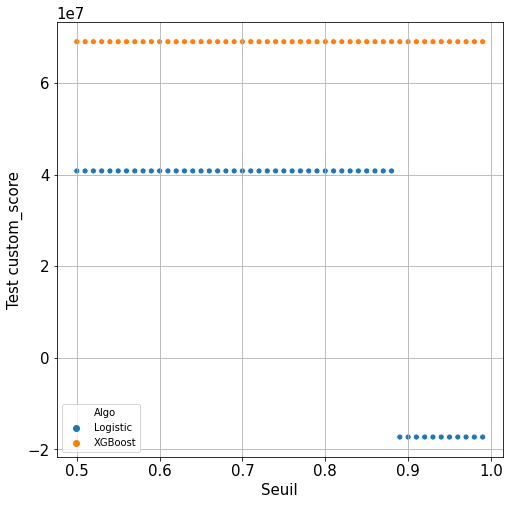

In [203]:
plt.rcParams['figure.figsize'] = [8, 8]
plt.rcParams['axes.titlesize'] = 20
plt.rcParams['axes.labelsize'] = 15
plt.rcParams['xtick.labelsize'] = 15
plt.rcParams['ytick.labelsize'] = 15
fig = plt.figure()
sns.scatterplot(data=df_etude_param_seuil, x='Seuil', y='Test custom_score', hue='Algo')
plt.grid('on')
plt.show()

#### Smote seul

In [ ]:
##################
# AVEC SMOTE
##################
df_doe_overunder, algos_results, s, best_mdl, best_mdl_name = \
        MLstuff.classification_doe(train_df, df_doe_init,
                                   target_col, problem_kind,
                                   scores,
                                   oversampling=True, undersampling=False,
                                   predict_proba=True, class_to_predict=1,
                                   encode_y=False)
df_doe_overunder # Avec over/undersampling

**Observations :**
 - Plus on augmente le nombre de voisins de SMOTE-NC, plus le score se dégrade.
 - RandomOverSampler donne un résultat légèrement supérieur à la baseline (enfin) !

**OK, sans SMOTE mais undersampling :**
On tombe à 620x2 = 1240 sample au lieu de 8000 dans X_train, et le test roc_auc monte à 0.748 (0.737 sans rien). Donc le rééquilibrage par sous-échantillonnage des 0 permet au moins de garder la perf (même si on a beaucoup moins de samples). Pour compléter l'expérience, travailler avec 1240 samples dans X_train directement, càd 1550 sample dans X donne test roc_auc = 0.754 avec un bon randoms_state, 0.664 avec un mauvais.
Donc SMOTE semble pénaliser la perf.

Avec SMOTE seul :
On passe de 620 samples positifs à 4059. Le roc_auc tombe à 0.729. Donc c'est bien SMOTE qui met un peu le boxon.

**Sans SMOTE ni Under**, sur un dataset de même taille qu'après UnderSampling

In [ ]:
##################
# SANS SMOTE/Under
##################
df_doe, algos_results, s, best_mdl, best_mdl_name = \
        MLstuff.classification_doe(train_df[0:6442], df_doe_init,
                                   target_col, problem_kind,
                                   scores,
                                   oversampling=False, undersampling=False,
                                   predict_proba=True, class_to_predict=1,
                                   encode_y=False)
df_doe # Sans over/undersampling

#### Avec 1550 point seulement

In [ ]:
debug = False
# df_prep_1550, cat_cols, num_cols = preprocess(selected_features=selected_features, debug=debug, num_rows=1550)
df_prep_1550 = df_prep.sample(1550, random_state=31051996)
train_df_1550 = df_prep_1550[df_prep_1550['TARGET'].notnull()]
df_doe_1550, algos_results_1550, s, best_mdl, best_mdl_name = \
        MLstuff.classification_doe(train_df_1550, df_doe_init,
                                   target_col, problem_kind,
                                   scores,
                                   oversampling=False, undersampling=False,
                                   predict_proba=True, class_to_predict=1,
                                   encode_y=False)
df_doe_1550 # Sans over/undersampling

In [ ]:
from imblearn.over_sampling import SMOTE, SMOTENC

In [ ]:
help(SMOTENC)

In [ ]:
help(ADASYN)

Mentor : dans la mesure où l'on doit donner un décision, autant utiliser un seuil dans la custom score, pour classifier à 0 ou 1 
Utiliser les probas dans la grid search ne permet pas de retourner le seuil optimal dans les futures prises de décisions
--> autant faire une recherche sur grille de ce seuil si on utilise les proba
argmax([0.2 0.8]
[0.3 0.7]
[0.8 0.2]] --> en binaire pas besoin de seuil, c'est le max = 0.8
en multiclasse : c'est le max pour chaque ligne



La grille `linspace` pour `class_weight` n'a que très peu amélioré le résultat (ROC AUC) par rapport à `class_weight='balanced'`. 

In [12]:
df_doe_5algos_save

NameError: name 'df_doe_5algos_save' is not defined

### Avec 10000 *autres* points que les 10000 premiers

In [ ]:
df_prep_all_samples, cat_cols, num_cols = preprocess(selected_features=selected_features, debug=debug)

In [13]:
df_prep_10000 = df_prep_all_samples.sample(10000, random_state=18011975)
train_df_10000 = df_prep_10000[df_prep_10000['TARGET'].notnull()]

NameError: name 'df_prep_all_samples' is not defined

#### Baseline

In [ ]:
df_doe_10000, algos_results_10000, s, best_mdl, best_mdl_name = \
        MLstuff.classification_doe(train_df_10000, df_doe_init,
                                   target_col, problem_kind,
                                   scores,
                                   oversampling=False, undersampling=False,
                                   predict_proba=True, class_to_predict=1,
                                   encode_y=False)
df_doe_10000 # Sans over/undersampling

#### Under only

In [ ]:
help(RandomUnderSampler)

In [14]:
help(SMOTE)

NameError: name 'SMOTE' is not defined

In [ ]:
df_doe_10000_under, algos_results_10000, s, best_mdl, best_mdl_name = \
        MLstuff.classification_doe(train_df_10000, df_doe_init,
                                   target_col, problem_kind,
                                   scores,
                                   oversampling=False, undersampling=True,
                                   predict_proba=True, class_to_predict=1,
                                   encode_y=False)
df_doe_10000_under # Sans over/undersampling

#### SMOTE only

In [ ]:
df_doe_10000_over, algos_results_10000, s, best_mdl, best_mdl_name = \
        MLstuff.classification_doe(train_df_10000, df_doe_init,
                                   target_col, problem_kind,
                                   scores,
                                   oversampling=True, undersampling=False,
                                   predict_proba=True, class_to_predict=1,
                                   encode_y=False)
df_doe_10000_over # Sans over/undersampling

#### SMOTE+Under

In [ ]:
df_doe_10000_overunder, algos_results_10000, s, best_mdl, best_mdl_name = \
        MLstuff.classification_doe(train_df_10000, df_doe_init,
                                   target_col, problem_kind,
                                   scores,
                                   oversampling=True, undersampling=True,
                                   predict_proba=True, class_to_predict=1,
                                   encode_y=False)
df_doe_10000_overunder # Sans over/undersampling

### Avec un déséquilibre encore plus fort

In [ ]:
df_prep_T0 = df_prep_all_samples.loc[df_prep_all_samples['TARGET']==0].sample(9800, random_state=18011975)
df_prep_T1 = df_prep_all_samples.loc[df_prep_all_samples['TARGET']==1].sample(200, random_state=18011975)
train_df_deseq = pd.concat((df_prep_T0, df_prep_T1)).sample(frac=1)
train_df_deseq['TARGET'].value_counts()

#### Baseline

In [15]:
df_doe_deseq, algos_results_deseq, s, best_mdl, best_mdl_name = \
        MLstuff.classification_doe(train_df_deseq, df_doe_init,
                                   target_col, problem_kind,
                                   scores,
                                   oversampling=False, undersampling=False,
                                   predict_proba=True, class_to_predict=1,
                                   encode_y=False)
df_doe_deseq # Sans over/undersampling

NameError: name 'MLstuff' is not defined

#### Under only

In [ ]:
df_doe_deseq_under, algos_results_deseq, s, best_mdl, best_mdl_name = \
        MLstuff.classification_doe(train_df_deseq, df_doe_init,
                                   target_col, problem_kind,
                                   scores,
                                   oversampling=False, undersampling=True,
                                   predict_proba=True, class_to_predict=1,
                                   encode_y=False)
df_doe_deseq_under # Sans over/undersampling

#### SMOTE only

In [ ]:
df_doe_deseq_over, algos_results_deseq, s, best_mdl, best_mdl_name = \
        MLstuff.classification_doe(train_df_deseq, df_doe_init,
                                   target_col, problem_kind,
                                   scores,
                                   oversampling=True, undersampling=False,
                                   predict_proba=True, class_to_predict=1,
                                   encode_y=False)
df_doe_deseq_over # Sans over/undersampling

#### SMOTE+Under

In [ ]:
df_doe_deseq_overunder, algos_results_deseq, s, best_mdl, best_mdl_name = \
        MLstuff.classification_doe(train_df_deseq, df_doe_init,
                                   target_col, problem_kind,
                                   scores,
                                   oversampling=True, undersampling=True,
                                   predict_proba=True, class_to_predict=1,
                                   encode_y=False)
df_doe_deseq_overunder

C'est maintenant **certain**, il se passe quelque chose avec SMOTE.

ACP + visu des points 0 et des points 1.

## Affichages

In [ ]:
score = 'Test roc_auc'
ind_best_mdl = df_doe.loc[df_doe[score]==df_doe[score].max()].index
ind_best_mdl = list(ind_best_mdl)[0]
ind_best_mdl

### Courbe ROC AUC

In [ ]:
def generate_auc_roc_curve(clf, X_test, y_test):
    y_pred_proba = clf.predict_proba(X_test)[:, 1]
    fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)
    auc = roc_auc_score(y_test, y_pred_proba)
    plt.plot(fpr, tpr, label=f"AUC ROC Curve with Area Under the curve = {auc:.4f}")
    plt.legend() #loc=4
    plt.show()


In [16]:
X_test_enc = algos_results[ind_best_mdl]['X_test_enc']
y_test = algos_results[ind_best_mdl]['y_test']
y_test_pred = algos_results[ind_best_mdl]['y_test_pred']

NameError: name 'algos_results' is not defined

In [ ]:
plt.rcParams['figure.figsize'] = [8, 8]
plt.rcParams['axes.titlesize'] = 20
plt.rcParams['axes.labelsize'] = 15
plt.rcParams['xtick.labelsize'] = 15
plt.rcParams['ytick.labelsize'] = 15
generate_auc_roc_curve(best_mdl, X_test_enc, y_test)

In [ ]:
other_mdl = algos_results[0]['model'].best_estimator_ # Dummy

In [ ]:
generate_auc_roc_curve(other_mdl, X_test_enc, y_test)

In [17]:
N = 2
doe_top = MLstuff.result_table_top_N(df_doe, 'Test roc_auc', N)
doe_top.to_csv(f"doe_top_{N}_{target_col}.csv",sep=';', index=False)
doe_top

NameError: name 'MLstuff' is not defined

# Interprétation du modèle

In [133]:
import shap

In [134]:
shap.initjs()

In [219]:
score

'Test roc_auc'

In [383]:
#winner = df_doe.loc[df_doe[score].astype(float)==df_doe[score].astype(float).min()]
best_score = df_doe[score].max()
winner = df_doe.loc[df_doe[score]==best_score]
ind_best_mdl = list(winner.index)[0]
winner

,Algorithm,Encoder,Scaler,Variables,Best params,Scoring,Train roc_auc,Train relative roc_auc,Test roc_auc,Test relative roc_auc,Elapsed time
0,"{'surname': 'XGBoost', 'class': XGBClassifier(...",[],<class 'sklearn.preprocessing._data.StandardSc...,"{'categ_cols': [], 'num_cols': ['CODE_GENDER',...","{'model__colsample_bytree': 0.8, 'model__learn...",roc_auc,0.793546,N/A,0.712801,N/A,1713.015876


In [384]:
problem = df_doe.iloc[ind_best_mdl]
res           = algos_results[ind_best_mdl] # int(winner.index.values)
algo          = problem['Algorithm']['surname']
X_train_enc   = res['X_train_enc']
X_train       = res['X_train']
y_train       = res['y_train']
X_test_enc    = res['X_test_enc']
y_test        = res['y_test']
y_train_pred  = res['y_train_pred']
y_test_pred   = res['y_test_pred']
feat_cols     = problem['Variables']['categ_cols'] + problem['Variables']['num_cols']
feat_cols_enc = res['Column names']
model         = res['model'].best_estimator_['model']

X_train_enc = pd.DataFrame(X_train_enc, columns=feat_cols) #feat_cols_enc
X_train_enc.index = y_train_pred.index

s = f"{algo} | {model} :\n"
print(s+'-'*(min(124,len(s)-3)))
#     print(feat_cols)

XGBoost | XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=0.8,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
              importance_type=None, interaction_constraints='',
              learning_rate=0.05, max_bin=256, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=5, max_leaves=0, min_child_weight=1,
              missing=nan, monotone_constraints='()', n_estimators=1000,
              n_jobs=8, nthread=8, num_parallel_tree=1, predictor='auto',
              random_state=18011975, reg_alpha=0, ...) :
----------------------------------------------------------------------------------------------------------------------------


In [385]:
if algo in ['XGBoost','LightGBM','RandomForest']:
    explainer = shap.TreeExplainer(model, X_train_enc) # GradientExplainer
elif algo in ['Logistic']:
    explainer = shap.LinearExplainer(model, X_train_enc) # GradientExplainer
else:
    print("*** Algo pas prévu.")

## Feature importance "built-in"

In [386]:
# feats = [f for f in train_df.columns if f not in ['TARGET','SK_ID_CURR','SK_ID_BUREAU','SK_ID_PREV','index']]
feature_importance_df = pd.DataFrame()
feature_importance_df["feature"] = feat_cols
feature_importance_df["importance"] = best_mdl['model'].feature_importances_


In [387]:
feature_importance_df.to_csv(f"feature_importance_{algo}_{score}={best_score:.3f}.csv", sep=";", index=False)

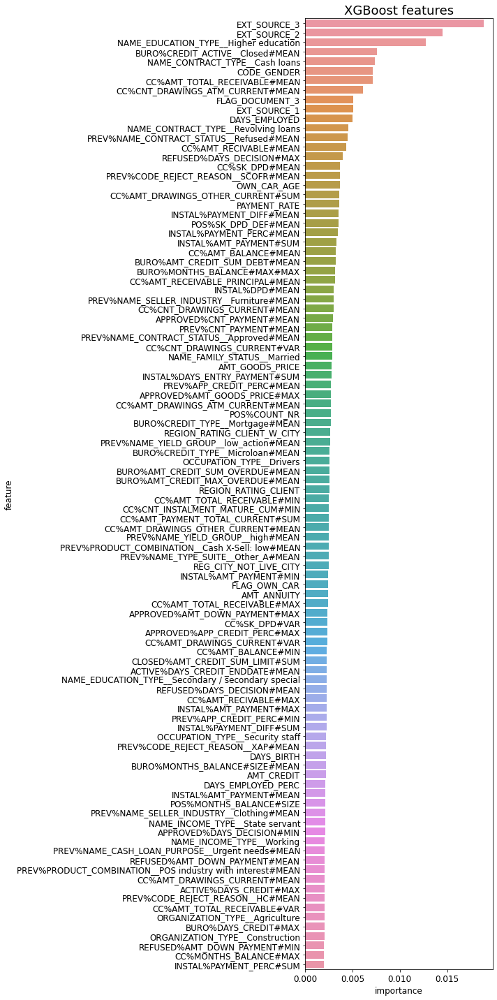

In [388]:
plt.rcParams['figure.figsize'] = [10, 20]
plt.rcParams['axes.titlesize'] = 18
plt.rcParams['axes.labelsize'] = 12
plt.rcParams['xtick.labelsize'] = 12
plt.rcParams['ytick.labelsize'] = 12
display_importances(feature_importance_df, n_feat=100, algo_name=algo)

## N samples pris au hasard

In [138]:
N = 100

In [139]:
X_sampled_enc = X_train_enc.sample(N, random_state=18011975)

In [140]:
if algo in ['XGBoost','LightGBM','RandomForest']:
    shap_values = explainer.shap_values(X_sampled_enc, check_additivity=False)
elif algo in ['Logistic']:
    shap_values = explainer.shap_values(X_sampled_enc)
else:
    print("*** Algo pas prévu.")

In [141]:
shap.force_plot(explainer.expected_value, shap_values, X_train_enc)

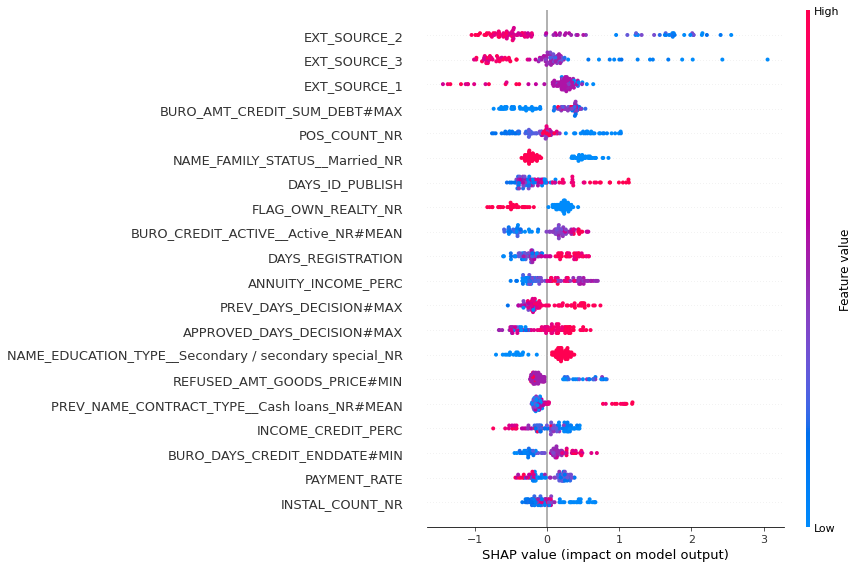

In [142]:
shap.summary_plot(shap_values, X_sampled_enc)

- [XGBoost] : Une variance élevée de solde de compte Credit Card (`CC_AMT_BALANCE_VAR`) a une influence croissante sur la proba d'être défaillant sur le crédit.

`DAYS_EMPLOYED` : plus la valeur est elevée (rouge), plus le modèle augmente la target (vers la défaillance) ?!

In [143]:
df_application_train['DAYS_EMPLOYED'].describe()

count    307511.000000
mean      63815.045904
std      141275.766519
min      -17912.000000
25%       -2760.000000
50%       -1213.000000
75%        -289.000000
max      365243.000000
Name: DAYS_EMPLOYED, dtype: float64

C'est parce que les valeurs sont en relatif par rapport à la date de demande de prêt, donc négatives.

### Un de ces samples

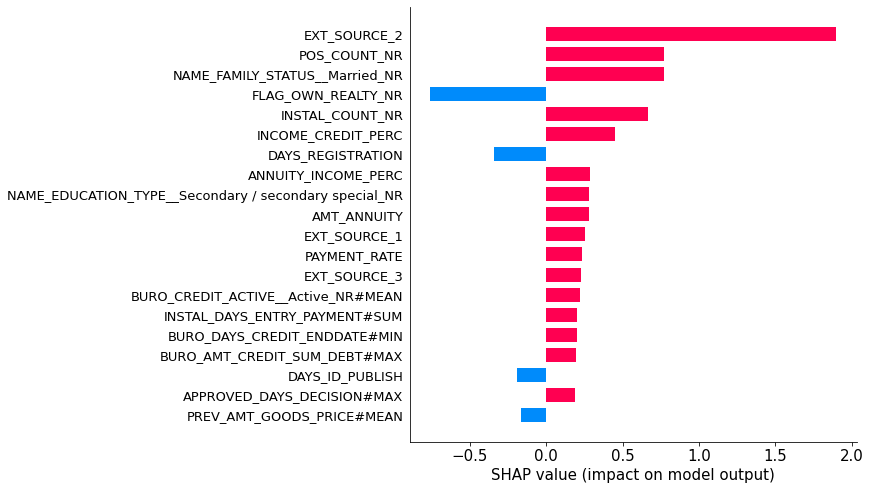

In [144]:
shap.bar_plot(explainer.shap_values(X_sampled_enc)[0],
             feature_names=X_train_enc.columns,
             max_display=20)

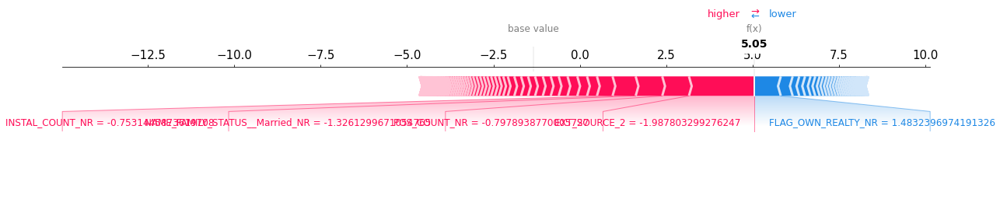

In [145]:
shap.force_plot(explainer.expected_value, shap_values[0,:], X_sampled_enc.iloc[0,:], matplotlib=True)

### Feature importance

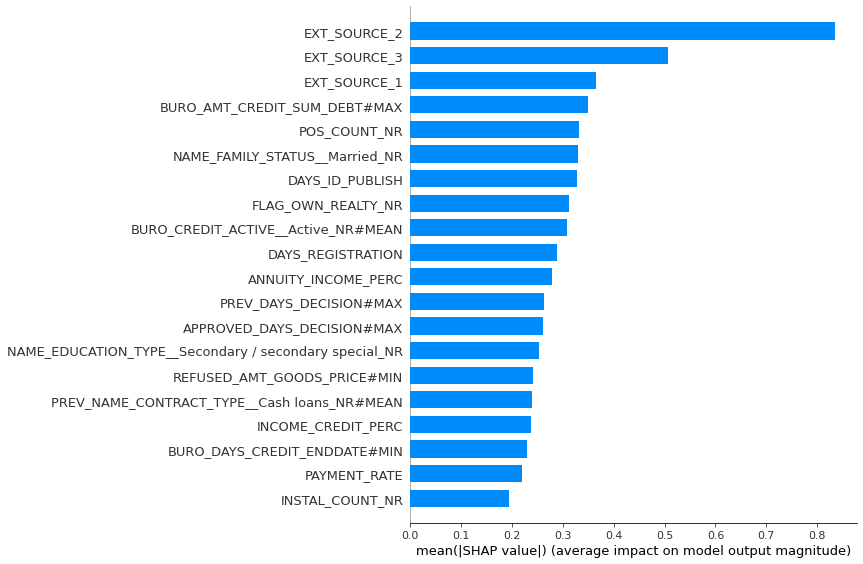

In [146]:
shap.summary_plot(shap_values, X_sampled_enc, plot_type="bar")

#### Regroupement des valeurs catégorielles

In [147]:
if 0 :
    # On moyenne sur les points samplés
    shap_values_moy = abs(shap_values).mean(axis=0)
    grouped_influences = PwePwocess.influenceCatVal(feat_cols, shap_values_moy, sep='$') # Relancer l'OneHot avec un '$' comme sép
    df_fi = pd.Series(grouped_influences)

    plt.rcParams['figure.figsize'] = [12, 8]
    plt.rcParams['axes.titlesize'] = 20
    plt.rcParams['axes.labelsize'] = 15
    plt.rcParams['xtick.labelsize'] = 15
    plt.rcParams['ytick.labelsize'] = 15

    df_fi.plot(kind='barh',color='firebrick',figsize=(8,6)) # firebrick, salmon
    plt.xlabel('mean(|SHAP value|, grouped for categorial features)');
    plt.title(f'Feature importances on {target_col}');
    plt.grid('on')
    plt.show()
    df_fi

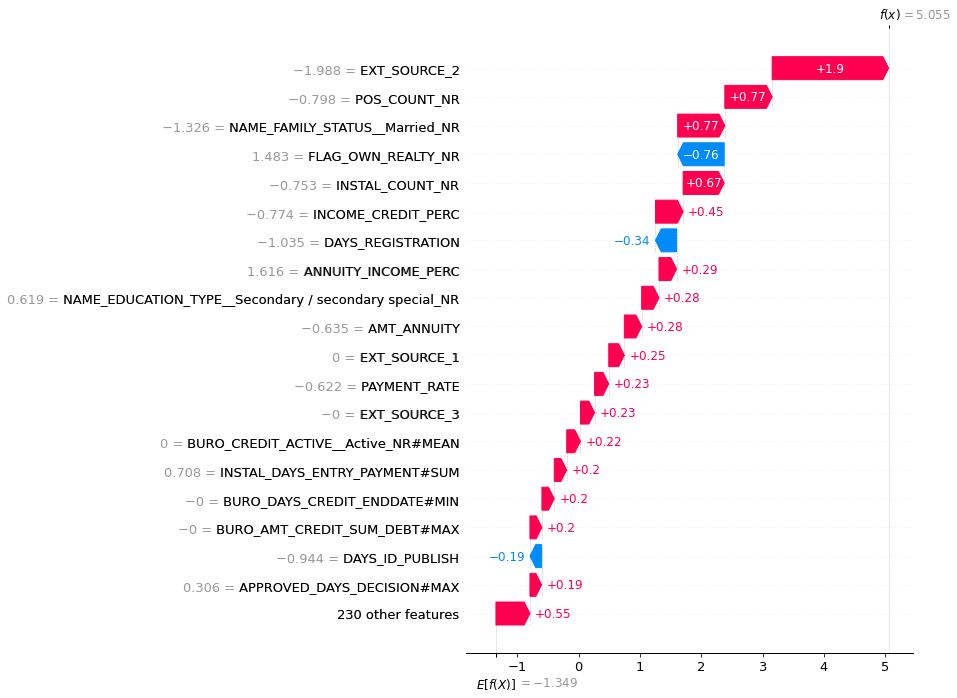

In [148]:
shap_values_0 = explainer(X_sampled_enc[:1])
shap.waterfall_plot(shap_values_0[0], max_display=20) # Ne fonctionne pas

## N samples dans la population refusée

In [149]:
seuil = 0.75 # Pour éviter la confusion dans l'interprétation

In [150]:
X_train_enc.index = y_train_pred.index

In [151]:
y_train_pred['TARGET_pred'].shape

(2400,)

In [152]:
X_train_enc.shape

(2400, 249)

In [153]:
X_train_enc.loc[(y_train_pred['TARGET_pred']>0.5)].shape

(914, 249)

In [154]:
seuil

0.75

In [155]:
y_test.loc[y_test['TARGET']>seuil].shape

(47, 1)

In [156]:
X_sampled_enc_refused = X_train_enc.loc[(y_train_pred['TARGET_pred']>seuil)].sample(N, random_state=18011975)

In [157]:
if algo in ['XGBoost','LightGBM','RandomForest']:
    shap_values_refused = explainer.shap_values(X_sampled_enc_refused, check_additivity=False)
elif algo in ['Logistic']:
    shap_values_refused = explainer.shap_values(X_sampled_enc_refused)
else:
    print("*** Algo pas prévu.")

In [158]:
shap.force_plot(explainer.expected_value, shap_values_refused, X_train_enc)

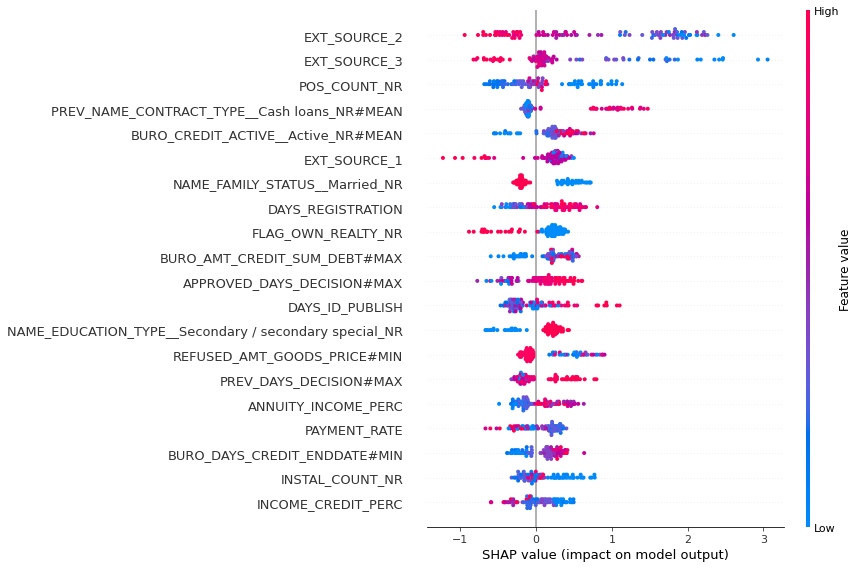

In [159]:
shap.summary_plot(shap_values_refused, X_sampled_enc_refused)

### Un de ces samples

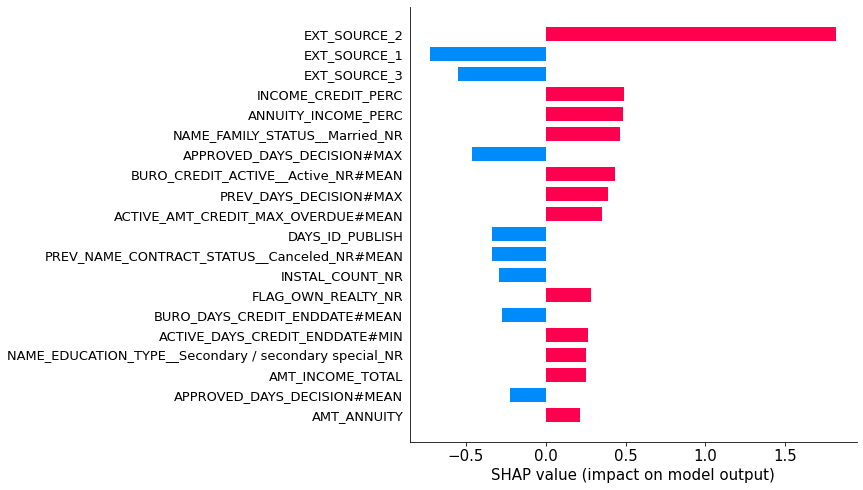

In [160]:
shap.bar_plot(explainer.shap_values(X_sampled_enc_refused)[0],
             feature_names=X_train_enc.columns,
             max_display=20)

In [161]:
X_train.loc[X_sampled_enc_refused.index[0]]

CODE_GENDER_NR                               1.0
FLAG_OWN_CAR_NR                              0.0
FLAG_OWN_REALTY_NR                           0.0
AMT_INCOME_TOTAL                         99000.0
AMT_CREDIT                              518562.0
                                          ...   
CC_NAME_CONTRACT_STATUS__nan_NR#MAX          NaN
CC_NAME_CONTRACT_STATUS__nan_NR#MEAN         NaN
CC_NAME_CONTRACT_STATUS__nan_NR#SUM          NaN
CC_NAME_CONTRACT_STATUS__nan_NR#VAR          NaN
CC_COUNT_NR                                  NaN
Name: 336, Length: 249, dtype: float64

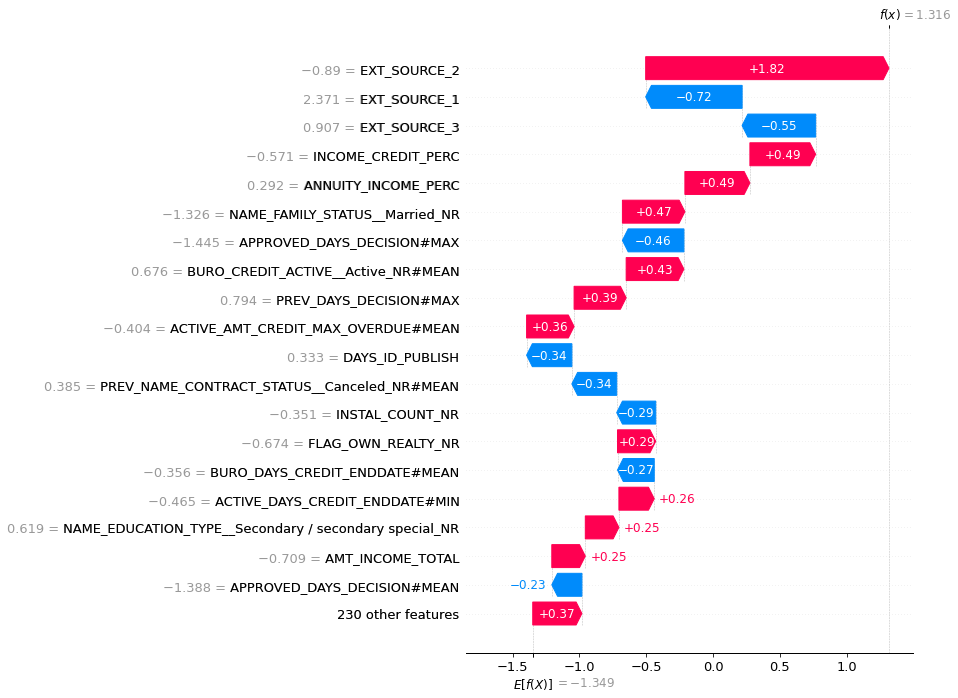

In [162]:
shap_values_refused_0 = explainer(X_sampled_enc_refused[:1])
shap.waterfall_plot(shap_values_refused_0[0], max_display=20) # Ne fonctionne pas

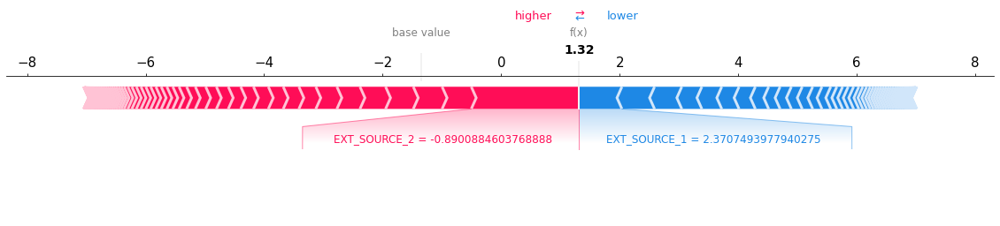

In [163]:
shap.force_plot(explainer.expected_value, shap_values_refused[0,:], X_sampled_enc_refused.iloc[0,:], matplotlib=True)

## N samples dans la population acceptée

In [164]:
seuil_acc = 0.25

In [165]:
X_sampled_enc_accepted = X_train_enc.loc[(y_train_pred['TARGET_pred']<seuil_acc)].sample(N, random_state=18011975)

In [166]:
if algo in ['XGBoost','LightGBM','RandomForest']:
    shap_values_accepted = explainer.shap_values(X_sampled_enc_accepted, check_additivity=False)
elif algo in ['Logistic']:
    shap_values_accepted = explainer.shap_values(X_sampled_enc_accepted)
else:
    print("*** Algo pas prévu.")

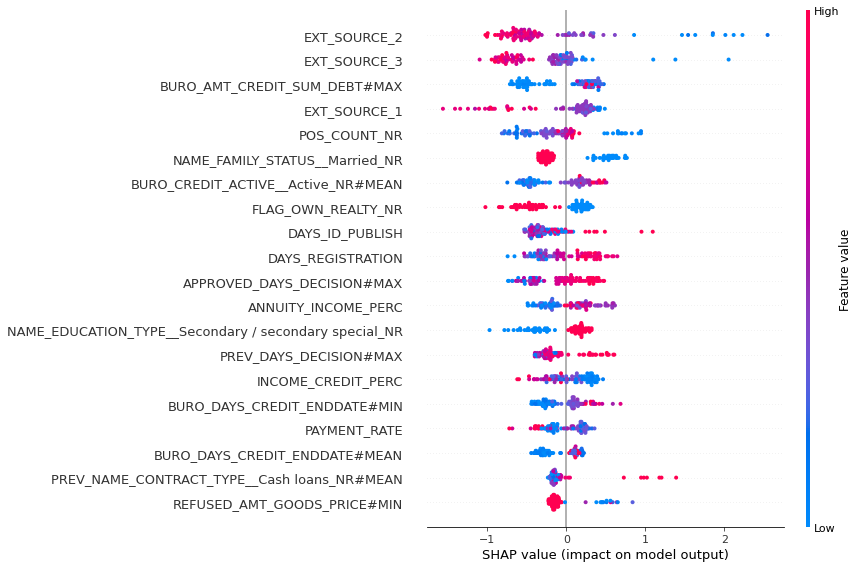

In [167]:
shap.summary_plot(shap_values_accepted, X_sampled_enc_accepted)

### Un de ces samples

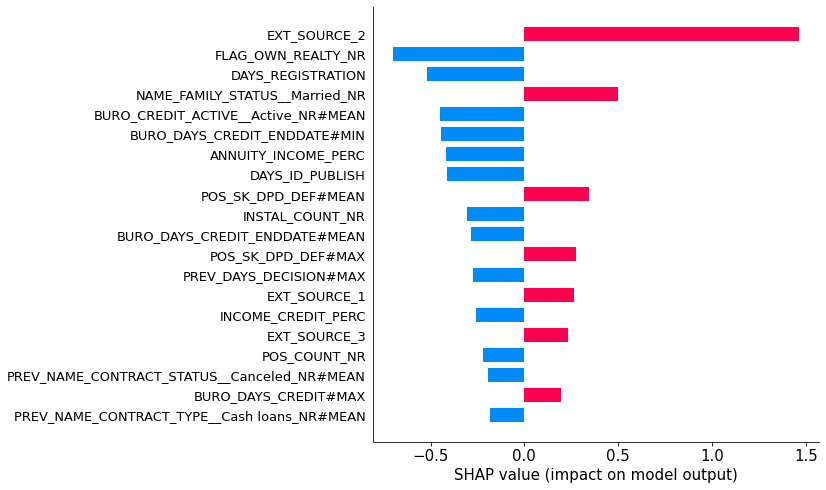

In [168]:
shap.bar_plot(explainer.shap_values(X_sampled_enc_accepted)[0],
             feature_names=X_train_enc.columns,
             max_display=20)

In [169]:
X_train.loc[X_sampled_enc_accepted.index[0]]

CODE_GENDER_NR                               1.0
FLAG_OWN_CAR_NR                              0.0
FLAG_OWN_REALTY_NR                           1.0
AMT_INCOME_TOTAL                        139500.0
AMT_CREDIT                              269550.0
                                          ...   
CC_NAME_CONTRACT_STATUS__nan_NR#MAX          NaN
CC_NAME_CONTRACT_STATUS__nan_NR#MEAN         NaN
CC_NAME_CONTRACT_STATUS__nan_NR#SUM          NaN
CC_NAME_CONTRACT_STATUS__nan_NR#VAR          NaN
CC_COUNT_NR                                  NaN
Name: 507, Length: 249, dtype: float64

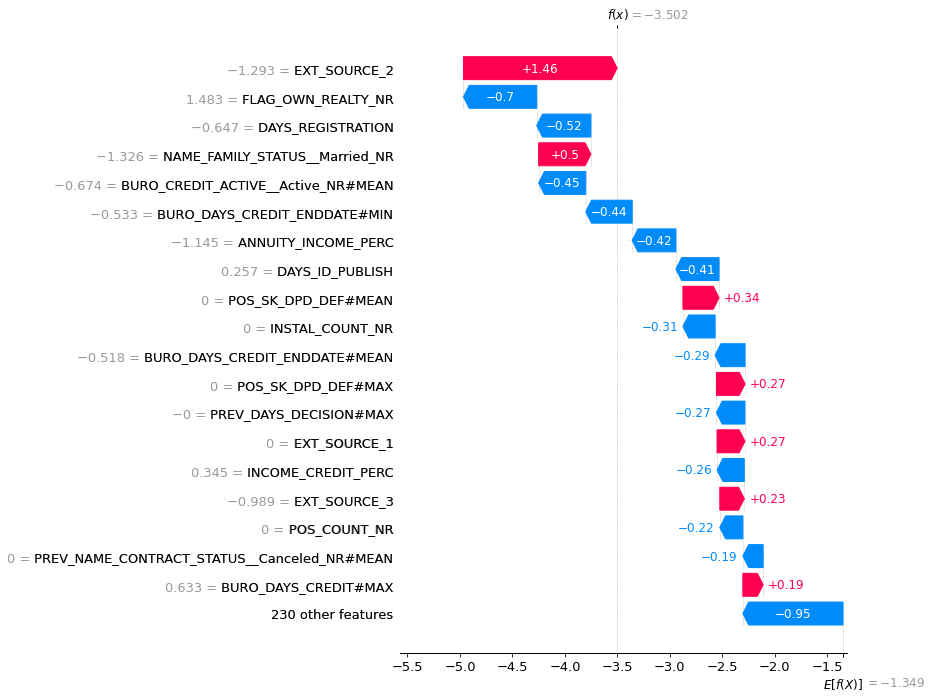

In [170]:
shap_values_accepted_0 = explainer(X_sampled_enc_accepted[:1])
shap.waterfall_plot(shap_values_accepted_0[0], max_display=20) # Ne fonctionne pas

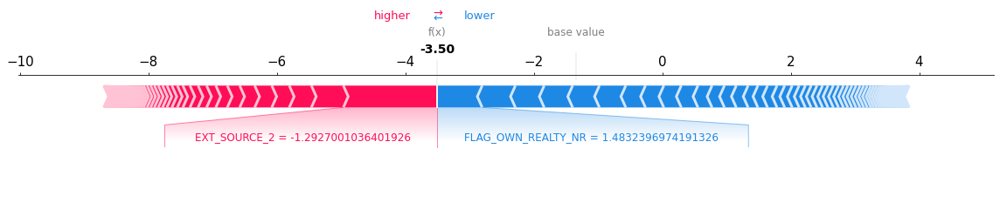

In [171]:
shap.force_plot(explainer.expected_value, shap_values_accepted[0,:], X_sampled_enc_accepted.iloc[0,:], matplotlib=True)

## Decision plot

https://coderzcolumn.com/tutorials/machine-learning/shap-explain-machine-learning-model-predictions-using-game-theoretic-approach

## Dependance plot ?

## Partial Dependence Plot ?

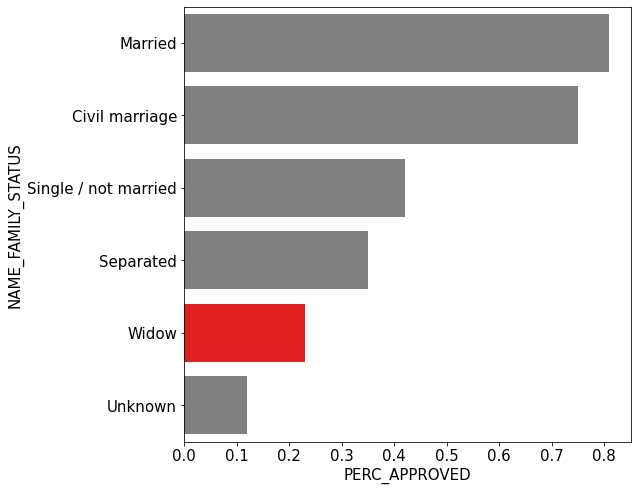

In [185]:
df_cat = pd.DataFrame({"NAME_FAMILY_STATUS": ["Married", "Single / not married", "Civil marriage", "Separated", "Widow", "Unknown"],
                       "PERC_APPROVED": [0.81, 0.42, 0.75, 0.35, 0.23, 0.12]})

df_cat = df_cat.sort_values(by="PERC_APPROVED", ascending=False)#.plot(kind='barh', grid=False, rot=0)
client_type = 'Widow'
clrs = ['red' if (x==client_type) else 'grey' for x in df_cat["NAME_FAMILY_STATUS"].values ]

sns.barplot(data=df_cat, x="PERC_APPROVED", y="NAME_FAMILY_STATUS", palette=clrs)

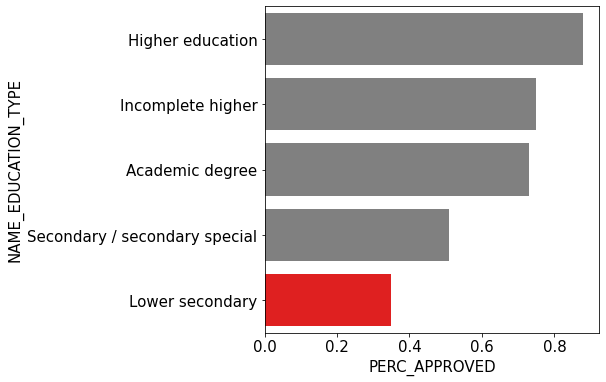

In [189]:
df_cat = pd.DataFrame({"NAME_EDUCATION_TYPE": ["Secondary / secondary special", 
                            "Higher education", 
                            "Incomplete higher", 
                            "Lower secondary", 
                            "Academic degree"],
                       "PERC_APPROVED": [0.51, 0.88, 0.75, 0.35, 0.73]})

df_cat = df_cat.sort_values(by="PERC_APPROVED", ascending=False)#.plot(kind='barh', grid=False, rot=0)
client_type = 'Lower secondary'
clrs = ['red' if (x==client_type) else 'grey' for x in df_cat["NAME_EDUCATION_TYPE"].values ]

plt.rcParams['figure.figsize'] = [6, 6]
sns.barplot(data=df_cat, x="PERC_APPROVED", y="NAME_EDUCATION_TYPE", palette=clrs)

In [178]:
df_cat

,NAME_FAMILY_STATUS,PERC_APPROVED
0,Married,0.81
1,Single / not married,0.42
2,Civil marriage,0.75
3,Separated,0.35
4,Widow,0.23
5,Unknown,0.12


# Mentorats

 **Mentorat 26/10**
 - VisualStudio : good (mieux en noir ^^)
 - Données : éviter de passer trop de temps à sélectionner et travailler ses données + d'autres contrib qui ont bien perfé
 - Modélisation : 60% (dont SHAP)
 - Dashboard : 30%
 - API : 10% (Flask conseillé, d'autant que c'est du Python, les trucs tout faits c'est cac... dommage)

**Mentorat 16/11**
 - Custom score : pas foufou sur XGBoost et Logisitic
 - SMOTE : échec. 
     - SMOTE-NC : échec. Overlapping ? PCA mais pas convaincu
     - BorderlineSMOTE-NC : échec
     - BorderlineSMOTE, SVMSMOTE, ADASYN, RandomOverSampler : échec
 - UnderSampling : mieux
 - Cours https://openclassrooms.com/fr/courses/6573181-adoptez-les-api-rest-pour-vos-projets-web
 - Partie API Flask du cours https://openclassrooms.com/fr/courses/4525361-realisez-un-dashboard-avec-tableau/5774811-creez-une-api-avec-flask
 - Pb de localhost:5000 pas accessible sous Windows... Config PC Linux... Résolution pb localhost... Retour Windows...
 - Tutos Streamlit + API Flask Medium.com, YouTube 
 - Adoption arborescence de https://github.com/Nneji123/Serving-Machine-Learning-Models
 - "Livrables : Le dashboard interactif répondant aux spécifications ci-dessus et l’API de prédiction du score, déployées chacunes sur le cloud" : pas obligé, mais **Streamlit** héberge (facile). Pour l'hébergement de l'API : **PythonAnywhere**

# TODO old / pas prio

**Perso**
- [X] Comprendre si et comment le noyau suggéré se sert des infos des autres tables.
- [X] Vérifier qu'un ID dans la table test a bien des infos dans ces autres tables : NON !
- [X] Du coup regarder le taux de NaN dans les df_train et df_test, du noyau Kaggle : pas mal, et ça ne gêne pas LightGBM
- [X] Comprendre le diagramme de feature importance :
    - [X] pourquoi seulement 40
    - [X] que représente réellement le trait : IC ? min;max ? oui, il fait croire, sur un test
    - [X] pourquoi le classement affiché n'est pas réellement décroissant, même quand on tient compte des bornes de l'intervalle du trait ? Je ne sais pas, mais c'est résolu en spécifiant un paramètre order à sns.barplot()
- [X] Extraire les 100 features les plus importantes de LighGBM
- [X] Déterminer correctement l'ensemble des colonnes catégorielles et numériques après les différentes transformations
- [X] Passer un SimpleImputer aux colonnes numériques (les NaN dans les cols catég. sont normalement devenus des 1 dans une noubelle catég. _nan)
- [ ] Passer un KNNImputer aux colonnes numériques
- [X] Pipeliner les imputations et scaling à RandomForest
- [X] Faire aboutir RandomForest
- [X] Extraire les 100 features les plus importantes de RandomForest
- [ ] Les comparer à celles de LightGBM
- [ ] Ajouter des features perso (nb de soldes négatifs dans les 6 derniers mois, etc., voir portable)

**04/11**
 - [X] Repasser le LightGBM après modifs de sélection de variables 

**06/11 matin**
 - [X] Forker et adapter lauch_DOE pour notre pb
 - [X] Faire tourner sur 3000 points
 
**06/11 apm**
 - [X] Ajouter le LogisticRegression dans les algos possibles + (hp)
 - [X] Custom score avec prise en compte du montant du prêt pour la perte à ne pas faire le prêt et la perte à prêter à un déf.
 - [X] Les hyperparam peuvent-ils être réglés sur moins de samples (de manière fiable) ? Demander à Yann.
 

**07/11 matin**
 - [X] Debug score custom avec mini dataset tiré du vrai (avec 5 ou 6 .index)
 
**07/11 apm**
 - [ ] Lire les articles donnés par OC sur le imbalanced dataset
 - [X] Installer imbalanced-learn
 - [X] Mettre en place la gestion des imbalanced dataset
 

# TODO

**Backlog**
 - [X] Courbes de ROC AUC
 - [ ] Matrice de confusion + heatmap
 - [ ] Courbes de learning rate
 - [X] Mois moyen de défaillance, pour réduire la perte associée dans le custom score. Non : autre idée :les montants.
 - [ ] Option refit='roc_auc' ou refit=custom_score à tester dans GridSearchCV (https://scikit-learn.org/stable/auto_examples/model_selection/plot_multi_metric_evaluation.html#sphx-glr-auto-examples-model-selection-plot-multi-metric-evaluation-py)
 - [ ] Mettre la méthode d'imputation comme paramètre du DOE ('mean', 'median', 0, ...)
 - [X] Nettoyer le STATUS==NaN et mettre 'X' à la place, dans bureau_balance. Non, c'est au join() que ça se passe
 - [ ] Corrections de :
    - [ ] `ORGANIZATION_TYPE_Industry: type 1`
    - [ ] `NAME_FAMILY_STATUS_Single / not married`
 - [ ] Checker l'importance des variables pour LightGBM, par rapport au Deep Dive
 - [ ] Vérifier que je n'ai pas rajouté SK_ID_CURR et SK_ID_BUREAU etc dans les features (ce qui expliquerait le +2 cols)
 - [X] Déporter le custom_score = make_scorer(custom_metric, greater_is_better=True, X_train=train_df) dans le prog classification_doe() et repasser à une chaine pour `scores = ['custom_score', ...]`
 - [ ] Méthodes de sélection de features (permutation, SelectFromModel : https://machinelearningmastery.com/calculate-feature-importance-with-python/)
 - [ ] Creuser pourquoi LogisticRegression donne si peu de > 0.5 (et avec un ROC AUC pas dégueu)
 - [X] Minibug possible : plusieurs variables ont le même nom : dans selected_features on doit aussi tester si le nom de la 'Table' a (commence par) la valeur appropriée pour les kept_col (mais l'impact est juste qu'on en garde plus que voulu, pas le contraire)
 - [X] Faire une PCA pour voir quel noyau est mieux pour Logistic/autres
 - [ ] **OUH LA vérifier les notions de FP et FN dans les anciennes custom_score !!!**
 - [X] Pourquoi la ROC Curve a une meilleure aire que le score calculé par la fonction `roc_auc` ? Passeuh t'as utilisé `.predict()` au lieu de `.predict_proba()`, ducon
 - [ ] SGDClassifier ?
 - [ ] NaiveBayes ?
 - [ ] Le reporting de la décision de prêt pousse à utliser des features simples (pas variance de la somme du min des remboursements du prêt précédent n° 14)
 - [ ] Sortir le train_df de la constrcution du DOE : ce param peut être passé à make scorer dans classification_doe ou même launch_algo 

**Imbalanced**
 - [X] Afficher les value_counts() avant/après SMOTE+under avant la GridSearch
 - [X] Prendre 10000 *autres* points que les 10000 premiers
 - [X] Faire une PCA et afficher les points 0/1 en bleu/orange
 - [X] Tester des valeurs différentes de k pour le SMOTE
 - [X] Tester d'autres types de SMOTE (ADAPmachin et tout)
 - [X] Si vraiment pas moyen d'améliorer SMOTE+Under, faire le contraire : prouver qu'avec un dataset encore plus déséquilibré, SMOTE+Under améliore les résultats... Done : seul le UnderSampling améliore le ROC AUC
 - [ ] **N'y a-t-il pas une erreur théorique à vouloir voir le ROC AUC s'améliorer avec SMOTE alors qu'il permet plutôt d'améliorer le score precision (TP/(TP+FP)) ?** => Afficher toutes les autres métriques de classification ! SMOTE peut même baisser l'accuracy, de ce que je lis.
 

\begin{equation*}
\text{dist}(X_i, X_j) = \sqrt{\sum_{k=1}^{K_{num}}(X_k^i – X_k^j)^2} + D \sum_{k=K_{num}+1}^{K_{cat}} 1_{ \{ X_k^i = X_k^j \} }
\end{equation*}

Où $D = \text{median}_{1 \leq k\leq K_{num}}(\sigma_k)$.

 - [X] Deep dive dans les colonnes sources pour flagguer les NR
 - [X] Checker les nouvelles variables ad-hoc du preprocess Kasgle qui doivent être suffixées _NR
 - [ ] Sélectionner les traitements vraiment parlant entre min, max, mean, size, var, etc. pour réduire encore les infos.
 - [X] Construire le imbalanced pipeline en repérant les variables contenant l'info `_NR` pour le SMOTE-NC.
 - [ ] `class_weight='balanced'`
 - [ ] GradientBoosting de scikit
 - [ ] resample de sklearn.utils (pour le UNDER et le OVER !)

**Mentorat 16/11**
 - [ ] A finir :
     - [ ] Web app
     - [ ] API
     - [ ] Cloud (même pas obligé)
 - [ ] A fignoler :
     - [ ] Variables du modèle (surtout pour leur signification client)
     - [ ] NaiveBayes ?
     - [ ] class_weight (retenter, et tests à faire apparaître)
     - [ ] Hyperparameter tuning
     - [ ] Matrice de confusion du best model
     - [X] `custom score` : virer la ligne des positifs détectés
     - [ ] Espérance : bien checker que les pondérations sont bonnes, voire les virer 
     - [ ] Ajouter un modèle qui prédit tout le monde à 0.
     

**16/11 soir**
 - [X] Développer fonction(s) d'application des opérations lues dans le fichier `selected_features.csv`, pour tous les fichiers
 - [X] Pas encore : en attendant : regarder les colonnes s'il y a des 1 dans les colonnes `_nan` car elles sont créées d'office par l'option nan_as_category=True. Oui ! C'est le join() car pas de NaN dans bureau.csv, ni dans bureau_and_balance.csv, mais les id doivent ne pas être exactement les mêmes.

**17/11**
 - [X] Faire tourner ancien XGBoost sur les 307000 * 14% (UnderSampling) et toutes les variables (prévoir 30 min de elapsed)
 - [X] Relancer XGBoost avec tous les samples et toutes les variables, sans Under ni SMOTE 
 - [X] Avec le résultat, refaire une passe sur les variables importantes et les opérations les plus importantes (soit dans le fichier `selected_features.csv` si le dév de l'application des opérations est OK, en dur sinon
 - [X] Finir avec un `selected_features.csv` de beaucoup moins de var. et opérations.


**18/11 apm**
 - [X] **Débuguer pourquoi je ne réobtiens pas exactement la même chose avec classification_doe et kfold_algo !!** : purée, le score FINAL, mal implémenté (pas à base de .predict_proba() mais .predict())
 - [ ] Lancer nouveau modèle épuré et comparer la perf (roc_auc) en tenant compte du elapsed. Le level=3 donne 0.7822/0:38 au lieu de 0.7896/1:51 ! 😋
 - [ ] Contrôler les noms de variables puisque suite à la correction du magnifique bug sur sep1/sep2, n'oublions pas...
 - [ ] Remettre en route custom_score
 - [ ] Voir si d'autres variables intuitivement importantes ne seraient pas à **forcer**
